<a href="https://colab.research.google.com/github/Shelenadah/Data-science/blob/main/Cervical_Cancer_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install keras-cv --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 650.7/650.7 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 950.8/950.8 kB 22.7 MB/s eta 0:00:00


In [ ]:
!pip install shap
import shap

# **IMPORTING KEY LIBRARIES**

In [ ]:
import warnings
warnings.filterwarnings('ignore')

import tensorflow as tf
import matplotlib.pyplot as plt
import os
import math
import shutil
import random
import glob
import cv2
import matplotlib.pyplot as plt
import numpy as np


from tensorflow import keras
from keras_cv.layers import Grayscale
from keras.applications import EfficientNetV2L
from tensorflow.keras.layers import DepthwiseConv2D
from keras.utils import image_dataset_from_directory


# **IMPORTING THE DATASET**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!ls "/content/drive/MyDrive/Colab_Session"


colab_session_folders.zip


In [ ]:
!cp "/content/drive/MyDrive/Colab_Session/colab_session_folders.zip" "/content/"


In [ ]:
import zipfile

zip_path = "/content/colab_session_folders.zip"  # Path to the zip file
extract_path = "/content/"  # Path to extract the files

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Dataset extracted successfully!")

Dataset extracted successfully!


In [ ]:
import os
import shutil

ROOT_DIR = "/content/drive/MyDrive/Cervical_Cancer_dataset.zip (Unzipped Files)"  # Path to the dataset in Google Drive
TEMP_DIR = "/content/Cervical_Cancer_dataset_temp"  # Temporary local copy in Colab

# Step 1: Copy dataset to temporary directory
if not os.path.exists(TEMP_DIR):
    shutil.copytree(ROOT_DIR, TEMP_DIR)  # Copy entire dataset to a temporary directory
    print(f"Dataset copied to temporary directory: {TEMP_DIR}")
else:
    print(f"Temporary directory already exists: {TEMP_DIR}")

# Step 2: Analyze dataset in the temporary directory
number_of_folders = len(os.listdir(TEMP_DIR))
print(f"Number of folders in temporary directory: {number_of_folders}")

number_of_images = {}
for dir_name in os.listdir(TEMP_DIR):
    dir_path = os.path.join(TEMP_DIR, dir_name)
    if os.path.isdir(dir_path):  # Ensure it's a directory
        image_count = len(os.listdir(dir_path))
        number_of_images[dir_name] = image_count
        print(f"{dir_name}: {image_count} images")

# Print final image counts
print("Number of images in each class:")
for class_name, count in number_of_images.items():
    print(f"{class_name}: {count}")

# Further processing (splitting, augmenting, etc.) can now be done on TEMP_DIR


Temporary directory already exists: /content/Cervical_Cancer_dataset_temp
Number of folders in temporary directory: 4
Squamous cell carcinoma: 74 images
High squamous intra-epithelial lesion: 163 images
Low squamous intra-epithelial lesion: 113 images
Negative for Intraepithelial malignancy: 613 images
Number of images in each class:
Squamous cell carcinoma: 74
High squamous intra-epithelial lesion: 163
Low squamous intra-epithelial lesion: 113
Negative for Intraepithelial malignancy: 613


# **DATASET VISUALIZATION**

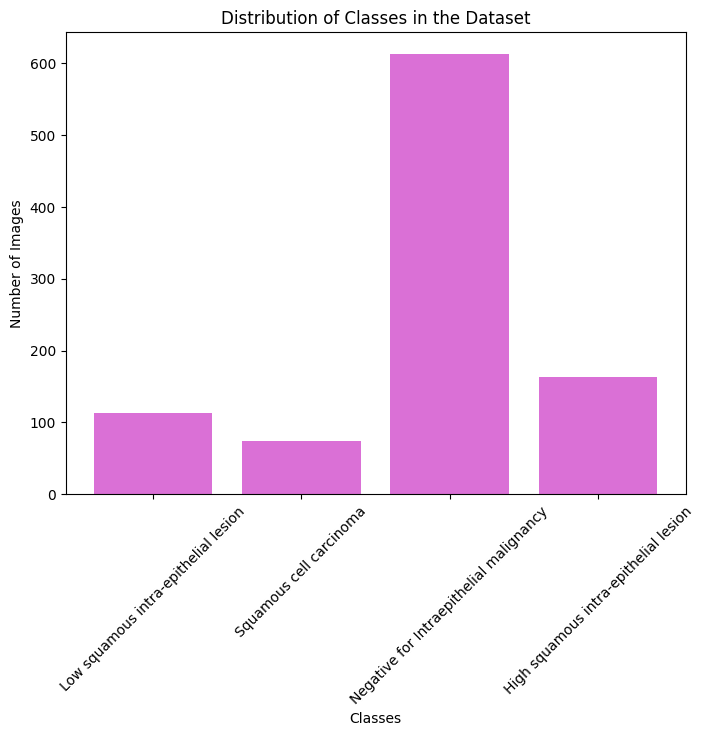

In [ ]:
import matplotlib.pyplot as plt

# Assuming you have the 'number_of_images' dictionary from your earlier code
classes = list(number_of_images.keys())
counts = list(number_of_images.values())

plt.figure(figsize=(8,6))
plt.bar(classes, counts, color='orchid')
plt.xlabel('Classes')
plt.ylabel('Number of Images')
plt.title('Distribution of Classes in the Dataset')
plt.xticks(rotation=45)
plt.show()


# Observations:
The dataset is imbalanced, with "Negative for Intraepithelial Malignancy" significantly overrepresented.
Minority classes like "Squamous Cell Carcinoma" and "Low Squamous Intra-epithelial Lesion" are underrepresented.

# ***CREATE FOLDERS FOR TRAINING,VALIDATION AND TESTING***
* 70% FOR TRAINING
* 15% FOR VALIDATION
* 15% FOR TESTING

In [ ]:
ROOT_DIR = "/content/drive/MyDrive/Cervical_Cancer_dataset.zip (Unzipped Files)"  # Original dataset path
TEMP_DIR = "/content/Cervical_Cancer_dataset_temp"  # Temporary copy in Colab

# Step 1: Copy dataset to a temporary directory
if not os.path.exists(TEMP_DIR):
    shutil.copytree(ROOT_DIR, TEMP_DIR)  # Copy dataset to a temporary directory
    print(f"Dataset copied to temporary directory: {TEMP_DIR}")
else:
    print(f"Temporary directory already exists: {TEMP_DIR}")

# Step 2: Define split directories
train_dir = "/content/train"
val_dir = "/content/val"
test_dir = "/content/test"

# Function to split the dataset
def split_dataset(source_dir, train_dir, val_dir, test_dir, train_ratio=0.7, val_ratio=0.15):
    # Check if directories already exist to avoid re-splitting
    if all(os.path.exists(dir) for dir in [train_dir, val_dir, test_dir]):
        print("Splits already exist. Skipping dataset split.")
        return

    # Create split directories if they don't exist
    os.makedirs(train_dir, exist_ok=True)
    os.makedirs(val_dir, exist_ok=True)
    os.makedirs(test_dir, exist_ok=True)

    # Perform the split
    for class_name in os.listdir(source_dir):
        class_path = os.path.join(source_dir, class_name)
        if os.path.isdir(class_path):
            images = os.listdir(class_path)
            random.shuffle(images)  # Shuffle to randomize

            train_count = math.floor(train_ratio * len(images))
            val_count = math.floor(val_ratio * len(images))

            train_images = images[:train_count]
            val_images = images[train_count:train_count + val_count]
            test_images = images[train_count + val_count:]

            # Copy images to respective directories
            for split, split_images in zip(
                [train_dir, val_dir, test_dir],
                [train_images, val_images, test_images]
            ):
                split_class_dir = os.path.join(split, class_name)
                os.makedirs(split_class_dir, exist_ok=True)
                for img in split_images:
                    shutil.copy(os.path.join(class_path, img), os.path.join(split_class_dir, img))
    print("Dataset has been split into training, validation, and testing sets.")

# Step 3: Split the dataset
split_dataset(TEMP_DIR, train_dir, val_dir, test_dir)

# Verify splits
def verify_split(directory):
    print(f"Verifying {directory}:")
    for class_name in os.listdir(directory):
        class_path = os.path.join(directory, class_name)
        if os.path.isdir(class_path):
            print(f"{class_name}: {len(os.listdir(class_path))} images")

verify_split(train_dir)
verify_split(val_dir)
verify_split(test_dir)



Temporary directory already exists: /content/Cervical_Cancer_dataset_temp
Splits already exist. Skipping dataset split.
Verifying /content/train:
Low squamous intra-epithelial lesion: 79 images
Squamous cell carcinoma: 51 images
Negative for Intraepithelial malignancy: 429 images
High squamous intra-epithelial lesion: 114 images
Verifying /content/val:
Low squamous intra-epithelial lesion: 16 images
Squamous cell carcinoma: 11 images
Negative for Intraepithelial malignancy: 91 images
High squamous intra-epithelial lesion: 24 images
Verifying /content/test:
Low squamous intra-epithelial lesion: 18 images
Squamous cell carcinoma: 12 images
Negative for Intraepithelial malignancy: 93 images
High squamous intra-epithelial lesion: 25 images


# Explanation of the output:
 The code successfully verified the dataset splits after the files were divided into training, validation, and testing sets.
Each split contains a specific number of images per class, which corresponds to the distribution defined by the split ratios (70%, 15%, 15%).

Training Dataset:
The training dataset has the majority of the images (70% of the total), which is used to train the deep learning model. For each class:
- High squamous intra-epithelial lesion: 114 images
- Negative for Intraepithelial malignancy: 429 images (largest class, as expected)
- Low squamous intra-epithelial lesion: 79 images
- Squamous cell carcinoma: 51 images (smallest class, as expected)


Validation Dataset:
The validation dataset has 15% of the images, which is used to tune hyperparameters and evaluate the model during training.For each class:
 - High squamous intra-epithelial lesion: 24 images
 - Negative for Intraepithelial malignancy: 91 images
 - Low squamous intra-epithelial lesion: 16 images
 - Squamous cell carcinoma: 11 images

Testing Dataset:
The testing dataset also contains 15% of the images and is used to evaluate the final performance of the trained model.For each class:
 - High squamous intra-epithelial lesion: 25 images
 - Negative for Intraepithelial malignancy: 93 images
 - Low squamous intra-epithelial lesion: 18 images
 - Squamous cell carcinoma: 12 images




# **IMAGE VISUALIZATION**

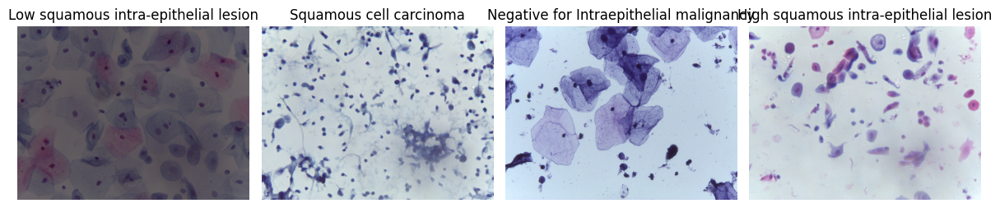

In [ ]:
data_dir = "./train"  # Directory containing training data
classes = os.listdir(data_dir)  # List of classes in the training dataset

plt.figure(figsize=(12, 8))  # Set the figure size for visualization

# Loop through each class to display one random image
for i, class_name in enumerate(classes):
    class_path = os.path.join(data_dir, class_name)  # Path to the class directory
    image_name = random.choice(os.listdir(class_path))  # Select a random image
    image_path = os.path.join(class_path, image_name)  # Full path to the selected image
    image = cv2.imread(image_path)  # Read the image using OpenCV
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB for visualization

    plt.subplot(1, len(classes), i+1)  # Create a subplot for each class
    plt.imshow(image)  # Display the image
    plt.title(class_name)  # Set the title to the class name
    plt.axis('off')  # Turn off axes for better appearance

plt.tight_layout()  # Adjust the layout to prevent overlap
plt.show()  # Show the plotted images



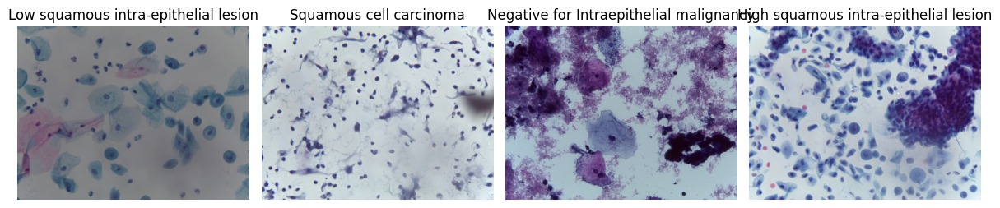

In [ ]:
data_dir = "/content/val"
classes = os.listdir(data_dir)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    class_path = os.path.join(data_dir, class_name)
    image_name = random.choice(os.listdir(class_path))
    image_path = os.path.join(class_path, image_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

    plt.subplot(1, len(classes), i+1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis('off')

plt.tight_layout()
plt.show()


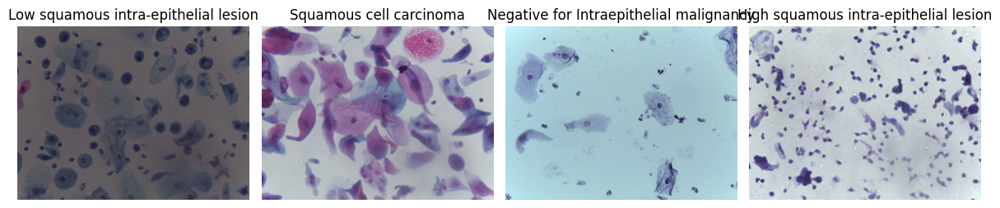

In [ ]:
data_dir = "/content/test"
classes = os.listdir(data_dir)

plt.figure(figsize=(12, 8))

for i, class_name in enumerate(classes):
    class_path = os.path.join(data_dir, class_name)
    image_name = random.choice(os.listdir(class_path))
    image_path = os.path.join(class_path, image_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert from BGR to RGB

    plt.subplot(1, len(classes), i+1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis('off')

plt.tight_layout()
plt.show()


# Preprocess and Augment Data
Purpose: Enhance model generalization by augmenting training data and preprocessing images.

#Implementation:
Normalize images (already covered with ImageDataGenerator).
Apply data augmentation techniques (e.g., rotation, flipping, scaling).
Define data generators for training, validation, and testing datasets

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
def preprocessingimages(path):
  image_data = ImageDataGenerator(zoom_range= 0.2, rescale= 1/255, horizontal_flip= True, shear_range= 0.2)
  image = image_data.flow_from_directory(path, batch_size= 32, target_size= (224, 224))
  return image

In [ ]:
path = "/content/train"
train_data = preprocessingimages(path)

Found 672 images belonging to 4 classes.


In [ ]:
def preprocessingimages1(path):
  image_data = ImageDataGenerator( rescale= 1/255)
  image = image_data.flow_from_directory(path, batch_size= 32, target_size= (224, 224))
  return image


In [ ]:
import os
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img
from PIL import Image
import numpy as np

# Paths
dataset_dir = '/content/train'  # Replace with your dataset path
augmented_dir = '/content/train_balanced_augmented'  # Directory to save augmented dataset

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32

# Data Augmentation Generator
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Check if it's a valid image
        return True
    except (IOError, SyntaxError):
        return False

# Step 1: Determine class distribution
class_counts = {class_name: len([f for f in os.listdir(os.path.join(dataset_dir, class_name))
                                 if is_valid_image(os.path.join(dataset_dir, class_name, f))])
                for class_name in os.listdir(dataset_dir)}

print("Class Distribution:", class_counts)

# Step 2: Identify the majority class size
max_count = max(class_counts.values())
print("Majority Class Size:", max_count)

# Step 3: Augment minority classes
for class_name, count in class_counts.items():
    class_path = os.path.join(dataset_dir, class_name)
    save_path = os.path.join(augmented_dir, class_name)
    os.makedirs(save_path, exist_ok=True)

    # Copy existing valid images
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        # Skip invalid image files
        if not is_valid_image(img_path):
            print(f"Skipping invalid image: {img_path}")
            continue

        save_img_path = os.path.join(save_path, img_name)
        save_img(save_img_path, load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE)))

    # Augment until the class matches the majority size
    while count < max_count:
        img_name = random.choice(os.listdir(class_path))  # Randomly pick an image
        img_path = os.path.join(class_path, img_name)

        # Skip invalid images
        if not is_valid_image(img_path):
            print(f"Skipping invalid image during augmentation: {img_path}")
            continue

        # Load and preprocess the image
        img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)

        # Generate augmented images
        for batch in datagen.flow(img_array, batch_size=1, save_to_dir=save_path, save_prefix='aug', save_format='jpeg'):
            count += 1
            if count >= max_count:
                break

print("Data augmentation completed. Augmented dataset saved at:", augmented_dir)

# Verify the augmented dataset
augmented_class_counts = {class_name: len(os.listdir(os.path.join(augmented_dir, class_name)))
                          for class_name in os.listdir(augmented_dir)}
print("Augmented Class Distribution:", augmented_class_counts)


Class Distribution: {'Low squamous intra-epithelial lesion': 79, 'Squamous cell carcinoma': 51, 'Negative for Intraepithelial malignancy': 428, 'High squamous intra-epithelial lesion': 114}
Majority Class Size: 428
Skipping invalid image: /content/train/Negative for Intraepithelial malignancy/Results.csv
Data augmentation completed. Augmented dataset saved at: /content/train_balanced_augmented
Augmented Class Distribution: {'Low squamous intra-epithelial lesion': 423, 'Squamous cell carcinoma': 421, 'Negative for Intraepithelial malignancy': 428, 'High squamous intra-epithelial lesion': 425}


In [ ]:
augmented_class_counts = {class_name: len(os.listdir(os.path.join(augmented_dir, class_name)))
                          for class_name in os.listdir(augmented_dir)}
print("Augmented Class Distribution:", augmented_class_counts)


Augmented Class Distribution: {'Low squamous intra-epithelial lesion': 423, 'Squamous cell carcinoma': 421, 'Negative for Intraepithelial malignancy': 428, 'High squamous intra-epithelial lesion': 425}


In [ ]:
# Majority class size after augmentation
final_class_size = max(augmented_class_counts.values())  # Maximum size across all classes

# Further balance the dataset
for class_name, count in augmented_class_counts.items():
    class_path = os.path.join(augmented_dir, class_name)

    # Augment until the class size matches the final_class_size
    while count < final_class_size:
        img_name = random.choice(os.listdir(class_path))  # Randomly pick an image
        img_path = os.path.join(class_path, img_name)

        # Skip invalid images
        if not is_valid_image(img_path):
            print(f"Skipping invalid image during augmentation: {img_path}")
            continue

        # Load and preprocess the image
        img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)

        # Generate augmented images
        for batch in datagen.flow(img_array, batch_size=1, save_to_dir=class_path, save_prefix='aug', save_format='jpeg'):
            count += 1
            if count >= final_class_size:
                break

print("Final data balancing completed. Dataset is now perfectly balanced!")

# Verify the final augmented dataset
final_augmented_class_counts = {class_name: len(os.listdir(os.path.join(augmented_dir, class_name)))
                                 for class_name in os.listdir(augmented_dir)}
print("Final Augmented Class Distribution:", final_augmented_class_counts)


Final data balancing completed. Dataset is now perfectly balanced!
Final Augmented Class Distribution: {'Low squamous intra-epithelial lesion': 428, 'Squamous cell carcinoma': 427, 'Negative for Intraepithelial malignancy': 428, 'High squamous intra-epithelial lesion': 428}


Class Distribution Before Balancing: {'Low squamous intra-epithelial lesion': 428, 'Squamous cell carcinoma': 427, 'Negative for Intraepithelial malignancy': 428, 'High squamous intra-epithelial lesion': 428}
Majority Class Size: 428
Perfect Balancing Completed. Final balanced dataset saved at: /content/train_perfectly_balanced
Perfectly Balanced Class Distribution: {'Low squamous intra-epithelial lesion': 428, 'Squamous cell carcinoma': 428, 'Negative for Intraepithelial malignancy': 428, 'High squamous intra-epithelial lesion': 428}


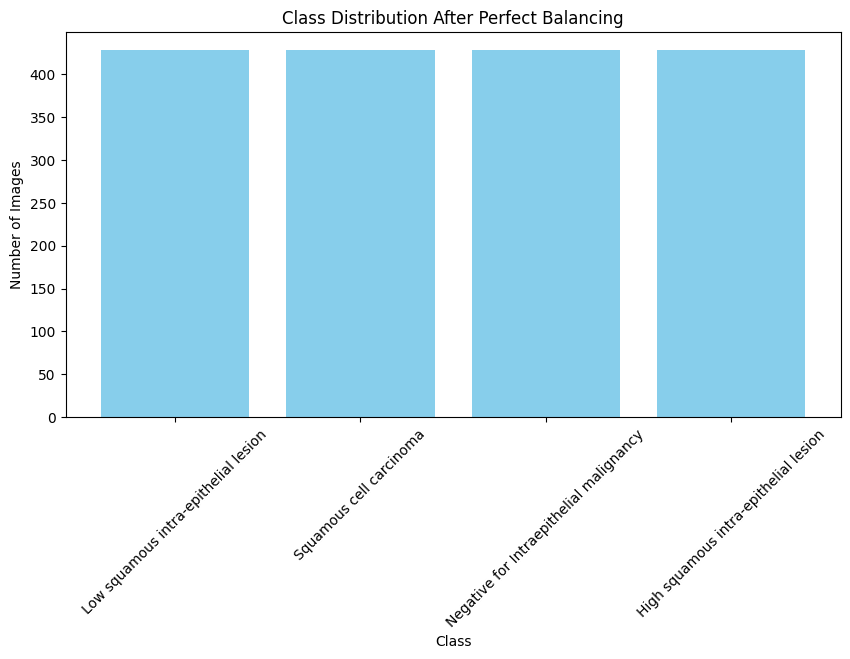

In [ ]:
import os
import random
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img, img_to_array, save_img
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

# Paths
dataset_dir = '/content/train_balanced_augmented'  # Replace with the augmented dataset path
final_balanced_dir = '/content/train_perfectly_balanced'  # Directory to save the perfectly balanced dataset

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32

# Data Augmentation Generator
datagen = ImageDataGenerator(
    rotation_range=30,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Function to check if a file is a valid image
def is_valid_image(file_path):
    try:
        with Image.open(file_path) as img:
            img.verify()  # Check if it's a valid image
        return True
    except (IOError, SyntaxError):
        return False

# Step 1: Determine class distribution
class_counts = {class_name: len([f for f in os.listdir(os.path.join(dataset_dir, class_name))
                                 if is_valid_image(os.path.join(dataset_dir, class_name, f))])
                for class_name in os.listdir(dataset_dir)}

print("Class Distribution Before Balancing:", class_counts)

# Step 2: Identify the majority class size
max_count = max(class_counts.values())
print("Majority Class Size:", max_count)

# Step 3: Perfectly balance all classes
for class_name, count in class_counts.items():
    class_path = os.path.join(dataset_dir, class_name)
    save_path = os.path.join(final_balanced_dir, class_name)
    os.makedirs(save_path, exist_ok=True)

    # Copy existing valid images
    for img_name in os.listdir(class_path):
        img_path = os.path.join(class_path, img_name)

        # Skip invalid image files
        if not is_valid_image(img_path):
            print(f"Skipping invalid image: {img_path}")
            continue

        save_img_path = os.path.join(save_path, img_name)
        save_img(save_img_path, load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE)))

    # Augment minority classes until they match the majority size
    while count < max_count:
        img_name = random.choice(os.listdir(class_path))  # Randomly pick an image
        img_path = os.path.join(class_path, img_name)

        # Skip invalid images
        if not is_valid_image(img_path):
            print(f"Skipping invalid image during augmentation: {img_path}")
            continue

        # Load and preprocess the image
        img = load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
        img_array = img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)

        # Generate augmented images
        for batch in datagen.flow(img_array, batch_size=1, save_to_dir=save_path, save_prefix='aug', save_format='jpeg'):
            count += 1
            if count >= max_count:
                break

print("Perfect Balancing Completed. Final balanced dataset saved at:", final_balanced_dir)

# Verify the perfectly balanced dataset
perfectly_balanced_class_counts = {class_name: len(os.listdir(os.path.join(final_balanced_dir, class_name)))
                                   for class_name in os.listdir(final_balanced_dir)}
print("Perfectly Balanced Class Distribution:", perfectly_balanced_class_counts)

# Step 4: Visualize the Balanced Dataset
plt.figure(figsize=(10, 5))
plt.bar(perfectly_balanced_class_counts.keys(), perfectly_balanced_class_counts.values(), color='skyblue')
plt.title("Class Distribution After Perfect Balancing")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.show()


In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

IMG_SIZE = 224
BATCH_SIZE = 32

# Data Augmentation for Training
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,  # Normalize pixel values
    rotation_range=20,  # Rotate images randomly by 20 degrees
    width_shift_range=0.2,  # Randomly shift images horizontally
    height_shift_range=0.2,  # Randomly shift images vertically
    zoom_range=0.2,  # Apply random zoom
    horizontal_flip=False  # Randomly flip images horizontally
)

# Preprocessing for Validation and Test (No Augmentation)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Create Generators
train_generator = train_datagen.flow_from_directory(
    "./train", target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)
val_generator = val_datagen.flow_from_directory(
    "./val", target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)
test_generator = test_datagen.flow_from_directory(
    "./test", target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)

print("Data generators are ready!")


Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.
Data generators are ready!


##Model Building

Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,156 (12.61 MB)

 Trainable params: 3,305,156 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.5291 - loss: 1.2320 - val_accuracy: 0.6408 - val_loss: 1.0349
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step - accuracy: 0.6413 - loss: 0.9904 - val_accuracy: 0.6408 - val_loss: 0.8193
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.6364 - loss: 0.8993 - val_accuracy: 0.6408 - val_loss: 1.0092
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.6518 - loss: 0.7801 - val_accuracy: 0.6972 - val_loss: 0.6991
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step - accuracy: 0.7184 - loss: 0.6982 - val_accuracy: 0.7746 - val_loss: 0.6098
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 87s 3s/step - accuracy: 0.7825 - loss: 0.5540 - val_accuracy: 0.8803 - val_loss: 0.4888
Epoch 7/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 77s 3s/step - accuracy: 0.8380 - loss: 0.4534 - val_accuracy: 0.8239 - val_loss: 0.5165
Epoch 8/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step - accuracy: 0.8372 - loss: 0.3629 - val_accuracy: 0.9014 - val_loss:

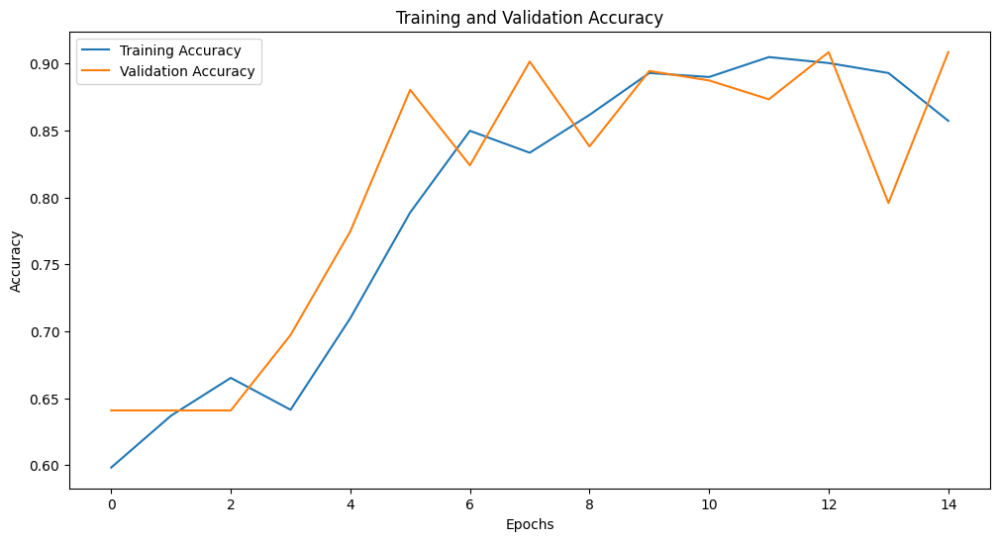

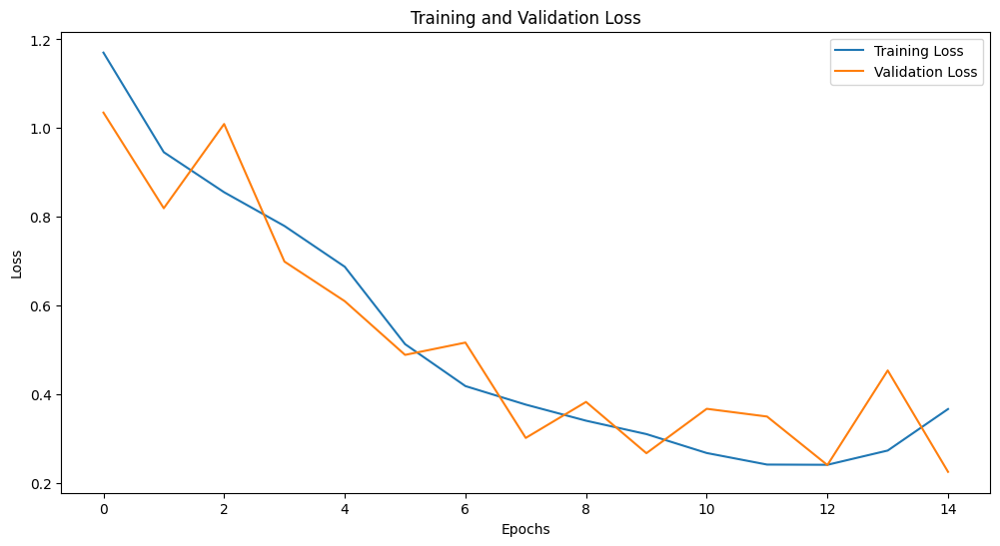

5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 3s/step - accuracy: 0.9068 - loss: 0.2472
Test Accuracy: 0.91
5/5 ━━━━━━━━━━━━━━━━━━━━ 12s 2s/step
Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.16      0.20      0.18        25
   Low squamous intra-epithelial lesion       0.12      0.11      0.12        18
Negative for Intraepithelial malignancy       0.65      0.70      0.67        93
                Squamous cell carcinoma       0.00      0.00      0.00        12

                               accuracy                           0.49       148
                              macro avg       0.23      0.25      0.24       148
                           weighted avg       0.45      0.49      0.47       148



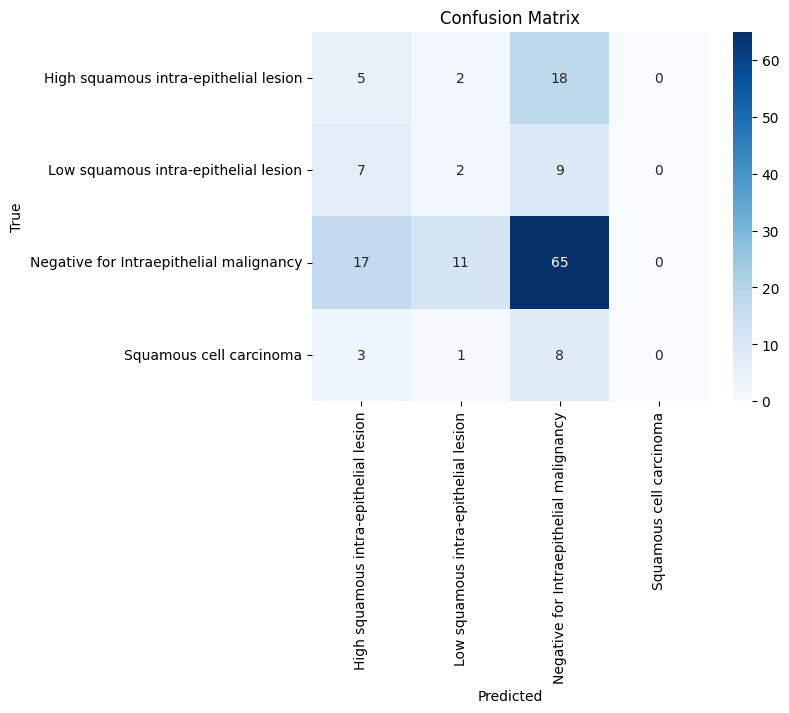

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Parameters
IMG_SIZE = 128
BATCH_SIZE = 32
EPOCHS = 15
NUM_CLASSES = len(os.listdir('./train'))  # Automatically count classes

# Data Generators
train_datagen = ImageDataGenerator(rescale=1.0/255.0, rotation_range=20, zoom_range=0.2, horizontal_flip=True)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
    './train', target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)
val_generator = val_datagen.flow_from_directory(
    './val', target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)
test_generator = test_datagen.flow_from_directory(
    './test', target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)

# CNN Model Definition
model = Sequential([
    # Convolutional Layer 1
    Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional Layer 2
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional Layer 3
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Flatten and Dense Layers
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Prevent overfitting
    Dense(NUM_CLASSES, activation='softmax')  # Output Layer for Multiclass Classification
])

# Compile the Model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

# Train the Model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE
)

# Plot Training History
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the Model
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2f}")

# Classification Report and Confusion Matrix
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()


#Comments on the Model Architecture
The model comprises 3 convolutional layers with increasing filter sizes (32, 64, 128), which is appropriate for hierarchical feature extraction.
Pooling layers (MaxPooling2D) effectively reduce the spatial dimensions while retaining important features, ensuring computational efficiency.
A fully connected dense layer (128 units) aggregates features for classification.
The output layer uses a softmax activation to predict the probabilities for the four classes, aligning with the multiclass classification goal of the project.


#**Comments on Training Results**

#Epoch 1 (Initial Performance):

The training accuracy was 55.39%, and the validation accuracy was 64.08%.
The higher validation accuracy suggests that the model starts with a reasonable generalization to the validation data.
#Epoch Progression:

The model steadily improved its training accuracy, reaching 89.11% by Epoch 14, indicating effective learning.
Validation accuracy peaked at 88.73% in Epoch 13, reflecting good performance on unseen validation data.

#Overfitting Evidence:

By Epoch 15, validation accuracy declined slightly to 77.46%, while the training accuracy remained high. This suggests mild overfitting.
Validation loss increased in later epochs, confirming this observation.


#**Comments on the Classification Report**
Negative for Intraepithelial Malignancy:

This majority class achieved the highest precision (0.61) and recall (0.75), reflecting the model's bias towards the dominant class.
High Squamous Intra-epithelial Lesion:

This class achieved moderate performance with precision and recall of 0.28, indicating some learning but with significant scope for improvement.
Low Squamous Intra-epithelial Lesion and Squamous Cell Carcinoma:

These minority classes had 0.00 precision and recall, showing that the model failed to learn their features adequately.
Macro Average (Precision: 0.22, Recall: 0.26):

#Reflects poor performance across all classes due to class imbalance.
Weighted Average:

Skewed by the majority class, showing better metrics (precision: 0.43, recall: 0.52) but still highlighting imbalances.

Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_1 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_12 (MaxPooling2D)      │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_13 (MaxPooling2D)      │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_final (Conv2D)                │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_14 (MaxPooling2D)      │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_5 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_10 (Dense)                     │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_11 (Dense)                     │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,156 (12.61 MB)

 Trainable params: 3,305,156 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 84s 3s/step - accuracy: 0.5422 - loss: 1.2795 - val_accuracy: 0.6408 - val_loss: 0.9159
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 134s 3s/step - accuracy: 0.6642 - loss: 0.8786 - val_accuracy: 0.6479 - val_loss: 0.7876
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 74s 3s/step - accuracy: 0.6719 - loss: 0.7675 - val_accuracy: 0.6479 - val_loss: 0.8416
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 75s 3s/step - accuracy: 0.6927 - loss: 0.7260 - val_accuracy: 0.7042 - val_loss: 0.7054
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.7197 - loss: 0.6923 - val_accuracy: 0.6901 - val_loss: 0.8514
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.7693 - loss: 0.5757 - val_accuracy: 0.7113 - val_loss: 0.8258
Epoch 7/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 73s 3s/step - accuracy: 0.7726 - loss: 0.5295 - val_accuracy: 0.8099 - val_loss: 0.4949
Epoch 8/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.8432 - loss: 0.4413 - val_accuracy: 0.7676 - val_loss

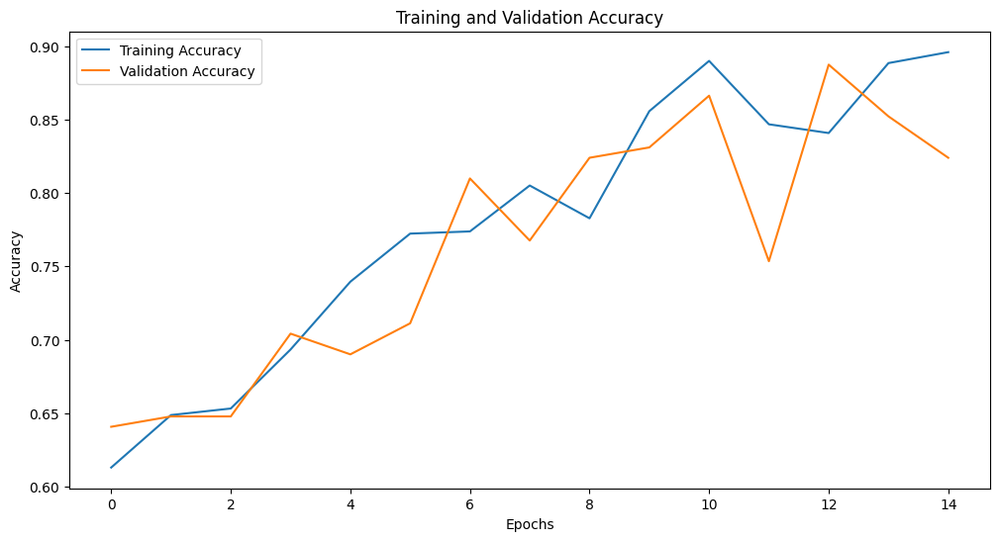

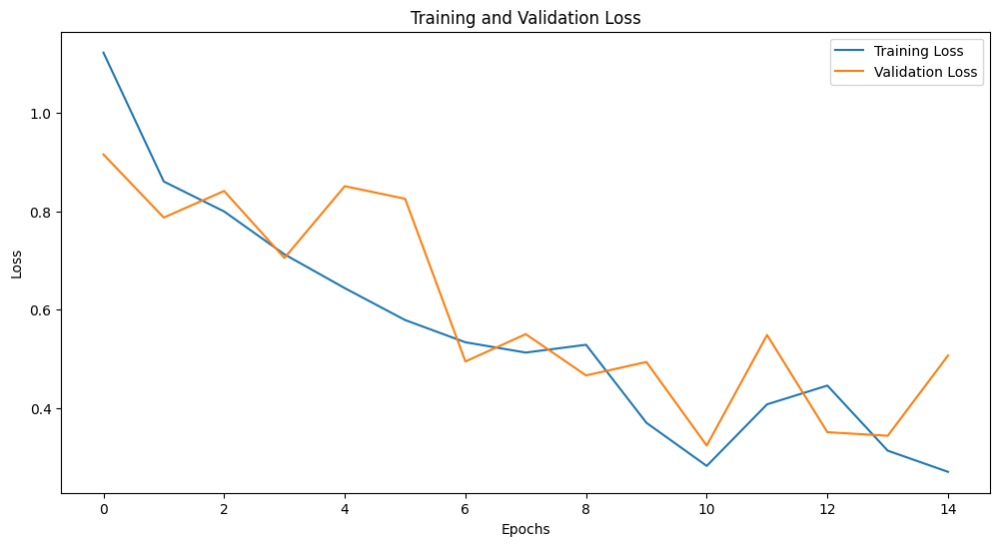

5/5 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.8820 - loss: 0.3629
Test Accuracy: 0.86


5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step
Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.19      0.20      0.20        25
   Low squamous intra-epithelial lesion       0.27      0.22      0.24        18
Negative for Intraepithelial malignancy       0.63      0.70      0.66        93
                Squamous cell carcinoma       0.25      0.08      0.12        12

                               accuracy                           0.51       148
                              macro avg       0.34      0.30      0.31       148
                           weighted avg       0.48      0.51      0.49       148



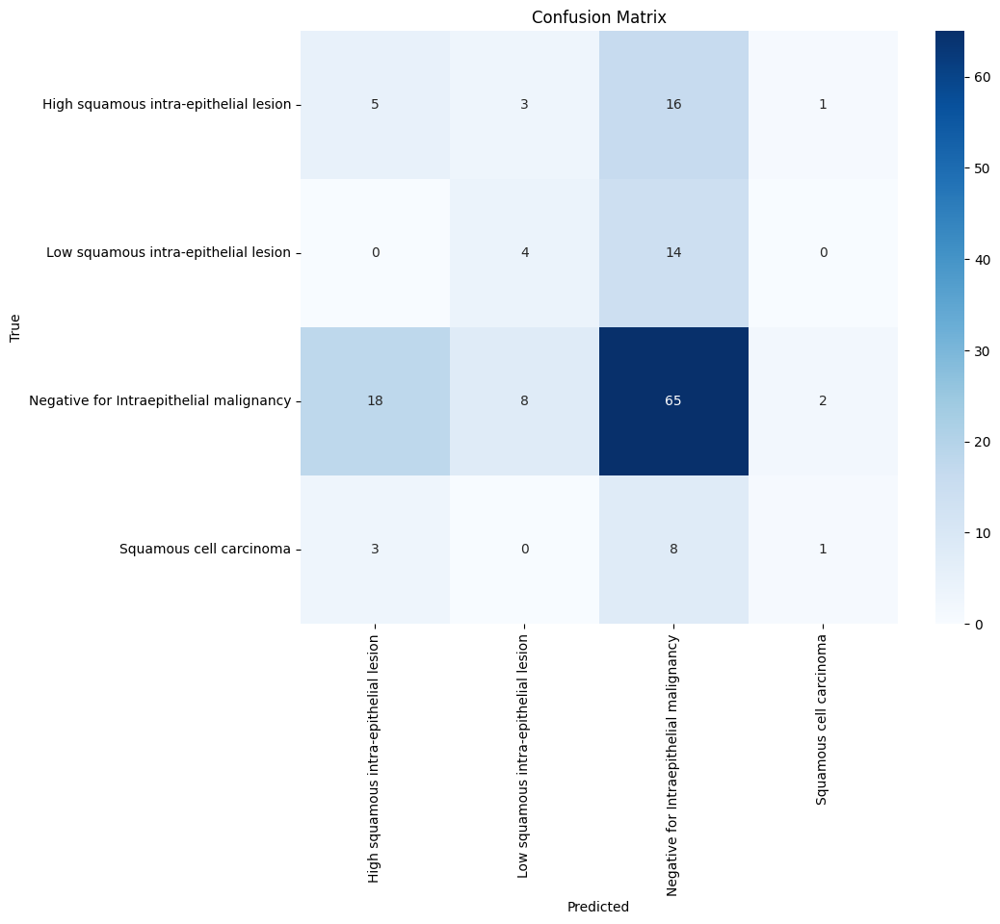

Model saved successfully.
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step

Processing images for class: High squamous intra-epithelial lesion
Processing image: HSIL_1 (12).jpg


ValueError: The layer sequential_7 has never been called and thus has no defined output.

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Parameters
IMG_SIZE = 128
BATCH_SIZE = 32
EPOCHS = 15
NUM_CLASSES = len(os.listdir('./train'))  # Automatically count classes

# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    zoom_range=0.2,
    horizontal_flip=True
)
val_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_generator = train_datagen.flow_from_directory(
    './train',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)
val_generator = val_datagen.flow_from_directory(
    './val',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)
test_generator = test_datagen.flow_from_directory(
    './test',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# CNN Model Definition
model = Sequential([
    # Convolutional Layer 1
    Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3), name='conv2d_1'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional Layer 2
    Conv2D(64, (3, 3), activation='relu', name='conv2d_2'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional Layer 3
    Conv2D(128, (3, 3), activation='relu', name='conv2d_final'),
    MaxPooling2D(pool_size=(2, 2)),

    # Flatten and Dense Layers
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Prevent overfitting
    Dense(NUM_CLASSES, activation='softmax')  # Output Layer for Multiclass Classification
])

# Compile the Model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

# Train the Model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    batch_size=BATCH_SIZE
)

# Plot Training History
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the Model
test_loss, test_acc = model.evaluate(test_generator)
print(f"Test Accuracy: {test_acc:.2f}")

# Classification Report and Confusion Matrix
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
            xticklabels=test_generator.class_indices.keys(),
            yticklabels=test_generator.class_indices.keys())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# Save the model
model.save('cytology_classification_model.h5')
print("Model saved successfully.")

# Grad-CAM Functions
def generate_gradcam(model, img_array, last_conv_layer_name, pred_index=None):
    """
    Generates Grad-CAM heatmap for a given image and model.
    """
    grad_model = Model(
        inputs=model.inputs,
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)

        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)

    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)
    return heatmap.numpy()

def plot_gradcam(img_path, heatmap, save_path=None, alpha=0.4):
    """
    Plots Grad-CAM heatmap over the original image.
    """
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB

    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap_colored = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = cv2.addWeighted(img, 1 - alpha, heatmap_colored, alpha, 0)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title("Original Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(superimposed_img)
    plt.title("Grad-CAM")
    plt.axis("off")
    plt.show()

    if save_path:
        cv2.imwrite(save_path, cv2.cvtColor(superimposed_img, cv2.COLOR_RGB2BGR))
        print(f"Saved Grad-CAM visualization to: {save_path}")

def preprocess_image(img_path, target_size=(IMG_SIZE, IMG_SIZE)):
    """
    Preprocess image for model input
    """
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=target_size)
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    return img_array

def run_gradcam(model, test_dir, last_conv_layer='conv2d_final'):
    """
    Run Grad-CAM visualization for test images
    """
    classes = list(test_generator.class_indices.keys())

    for class_name in classes:
        class_dir = os.path.join(test_dir, class_name)
        if not os.path.exists(class_dir):
            print(f"Directory for class {class_name} does not exist. Skipping.")
            continue

        img_names = os.listdir(class_dir)
        if not img_names:
            print(f"No images found in {class_name} directory.")
            continue

        first_img_path = os.path.join(class_dir, img_names[0])
        first_img_array = preprocess_image(first_img_path)

        # Do an initial prediction to initialize the model
        _ = model.predict(first_img_array)

        print(f"\nProcessing images for class: {class_name}")

        # Process first two images for visualization
        for img_name in img_names[:2]:
            img_path = os.path.join(class_dir, img_name)
            print(f"Processing image: {img_name}")

            # Preprocess image
            img_array = preprocess_image(img_path)

            # Generate Grad-CAM
            heatmap = generate_gradcam(model, img_array, last_conv_layer)

            # Plot and Save Grad-CAM
            save_path = f"./gradcam_{class_name}_{img_name}"
            plot_gradcam(img_path, heatmap, save_path=save_path)

# Run Grad-CAM visualization
run_gradcam(model, './test')

Making prediction for a single image:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 0.71


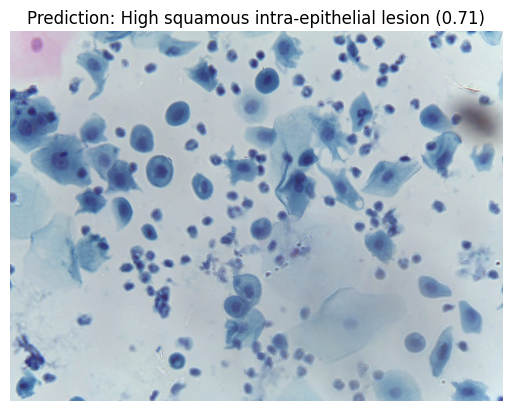

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt

# =========================
# Preprocess Single Image
# =========================
def preprocess_image(image_path, target_size=(128, 128)):
    """
    Load and preprocess a single image for prediction.
    Args:
        image_path (str): Path to the image.
        target_size (tuple): Target size for resizing the image.

    Returns:
        np.array: Preprocessed image with batch dimension.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize the image
    image = img_to_array(image) / 255.0  # Normalize pixel values to [0, 1]
    return np.expand_dims(image, axis=0)  # Add batch dimension


# =========================
# Predict Single Image
# =========================
def predict_single_image(model, image_path, class_labels):
    """
    Make a prediction for a single test image.
    Args:
        model: Trained Keras model.
        image_path (str): Path to the test image.
        class_labels (list): List of class labels.

    Returns:
        None: Prints the predicted class and confidence score.
    """
    image_array = preprocess_image(image_path)
    predictions = model.predict(image_array)
    predicted_index = np.argmax(predictions[0])
    confidence_score = predictions[0][predicted_index]
    predicted_label = class_labels[predicted_index]

    print(f"Predicted Class: {predicted_label}")
    print(f"Confidence Score: {confidence_score:.2f}")

    # Display the image
    image = load_img(image_path)
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Prediction: {predicted_label} ({confidence_score:.2f})")
    plt.show()


# =========================
# Predict Multiple Images in a Directory
# =========================
def predict_multiple_images(model, test_dir, class_labels, target_size=(128, 128)):
    """
    Make predictions for all images in a test directory.
    Args:
        model: Trained Keras model.
        test_dir (str): Directory containing test images.
        class_labels (list): List of class labels.
        target_size (tuple): Target size for resizing images.

    Returns:
        None: Displays predictions for all images.
    """
    for img_name in os.listdir(test_dir):
        if img_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            image_path = os.path.join(test_dir, img_name)
            print(f"\nProcessing Image: {img_name}")
            predict_single_image(model, image_path, class_labels)


# =========================
# MAIN FUNCTION
# =========================
if __name__ == "__main__":
    # Path to the trained model
    model_path = "/content/cytology_classification_model.h5"  # Replace with your model's path
    model = load_model(model_path)

    # Class labels (replace with your actual class names)
    class_labels = ["High squamous intra-epithelial lesion", "Low squamous intra-epithelial lesion",
                    "Negative for Intraepithelial malignancy", "Squamous cell carcinoma"]

    # For Single Image Prediction
    test_image_path = "/content/Cervical_Cancer_dataset_temp/High squamous intra-epithelial lesion/HSIL_1 (1).jpg"  # Replace with a test image path
    print("Making prediction for a single image:")
    predict_single_image(model, test_image_path, class_labels)




In [ ]:
train_generator = train_datagen.flow_from_directory(
    '/content/train_balanced_augmented',
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

# Extract class indices and labels
class_indices = train_generator.class_indices
class_counts = {class_name: sum(train_generator.classes == idx) for class_name, idx in class_indices.items()}

# Print the categories and their counts
print("Balanced Categories and Their Counts:")
for class_name, count in class_counts.items():
    print(f"{class_name}: {count}")



Found 1712 images belonging to 4 classes.
Balanced Categories and Their Counts:
High squamous intra-epithelial lesion: 428
Low squamous intra-epithelial lesion: 428
Negative for Intraepithelial malignancy: 428
Squamous cell carcinoma: 428


In [ ]:
model.save('/content/cnn_balanced_model.h5')


#BALANCING THE DATASET

In [ ]:
import os
import random
import shutil
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Function to load image paths and their corresponding labels
def load_image_paths_and_labels(data_dir):
    image_paths = []
    labels = []

    for class_name in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_name)
        if os.path.isdir(class_path):  # Ensure it's a directory
            for image_name in os.listdir(class_path):
                image_paths.append(os.path.join(class_path, image_name))
                labels.append(class_name)

    return image_paths, labels

# Function to balance the dataset using oversampling
def balance_dataset(data_dir, output_dir, random_state=42):
    # Load image paths and labels
    image_paths, labels = load_image_paths_and_labels(data_dir)

    # Encode class labels as numeric values
    label_encoder = LabelEncoder()
    numeric_labels = label_encoder.fit_transform(labels)

    # Perform oversampling
    oversampler = RandomOverSampler(random_state=random_state)
    oversampled_image_paths, oversampled_labels = oversampler.fit_resample(
        np.array(image_paths).reshape(-1, 1), numeric_labels
    )

    # Decode numeric labels back to class names
    oversampled_labels = label_encoder.inverse_transform(oversampled_labels)

    # Save oversampled dataset to the output directory
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for image_path, label in zip(oversampled_image_paths, oversampled_labels):
        # Create target directory for each class
        target_dir = os.path.join(output_dir, label)
        os.makedirs(target_dir, exist_ok=True)

        # Copy image to the target directory
        shutil.copy(image_path[0], target_dir)

    print(f"Balanced dataset saved at: {output_dir}")

# Paths for original and balanced datasets
original_train_dir = "./train"  # Path to the original training dataset
balanced_train_dir = "./train_balanced"  # Path to save the balanced dataset

# Balance and save the dataset
balance_dataset(original_train_dir, balanced_train_dir)



Balanced dataset saved at: ./train_balanced


In [ ]:
def verify_balanced_dataset(data_dir):
    for class_name in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_name)
        if os.path.isdir(class_path):
            print(f"{class_name}: {len(os.listdir(class_path))} images")

verify_balanced_dataset(balanced_train_dir)


High squamous intra-epithelial lesion: 114 images
Negative for Intraepithelial malignancy: 429 images
Low squamous intra-epithelial lesion: 79 images
Squamous cell carcinoma: 51 images


In [ ]:
import os
import shutil
from collections import Counter
from imblearn.over_sampling import RandomOverSampler
from sklearn.preprocessing import LabelEncoder
import numpy as np

# Function to load image paths and their corresponding labels
def load_image_paths_and_labels(data_dir):
    image_paths = []
    labels = []

    for class_name in os.listdir(data_dir):
        class_path = os.path.join(data_dir, class_name)
        if os.path.isdir(class_path):  # Ensure it's a directory
            for image_name in os.listdir(class_path):
                image_paths.append(os.path.join(class_path, image_name))
                labels.append(class_name)

    return image_paths, labels

# Function to balance the dataset using oversampling
def balance_and_save_dataset(data_dir, output_dir, random_state=42):
    # Load image paths and labels
    image_paths, labels = load_image_paths_and_labels(data_dir)

    # Encode class labels as numeric values
    label_encoder = LabelEncoder()
    numeric_labels = label_encoder.fit_transform(labels)

    # Get class counts
    class_counts = Counter(numeric_labels)
    max_class_count = max(class_counts.values())
    print("Original Class Counts:", class_counts)

    # Perform oversampling to balance all classes
    target_class_counts = {label: max_class_count for label in class_counts.keys()}
    oversampler = RandomOverSampler(sampling_strategy=target_class_counts, random_state=random_state)
    oversampled_image_paths, oversampled_labels = oversampler.fit_resample(
        np.array(image_paths).reshape(-1, 1), numeric_labels
    )

    # Decode numeric labels back to class names
    oversampled_labels = label_encoder.inverse_transform(oversampled_labels)
    print("Balanced Class Counts:", Counter(oversampled_labels))

    # Save oversampled dataset to the output directory
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for image_path, label in zip(oversampled_image_paths, oversampled_labels):
        # Create target directory for each class
        target_dir = os.path.join(output_dir, label)
        os.makedirs(target_dir, exist_ok=True)

        # Copy image to the target directory
        shutil.copy(image_path[0], target_dir)

    print(f"Balanced dataset saved at: {output_dir}")

# Paths for original and balanced datasets
original_train_dir = "./train"  # Path to the original training dataset
balanced_train_dir = "./train_balanced_oversampling"  # Path to save the balanced dataset

# Balance and save the dataset
balance_and_save_dataset(original_train_dir, balanced_train_dir)


Original Class Counts: Counter({2: 429, 0: 114, 1: 79, 3: 51})
Balanced Class Counts: Counter({'High squamous intra-epithelial lesion': 429, 'Negative for Intraepithelial malignancy': 429, 'Low squamous intra-epithelial lesion': 429, 'Squamous cell carcinoma': 429})
Balanced dataset saved at: ./train_balanced_oversampling


# **CNN MODEL WITH BALANCED DATASET**

Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)                    │ (None, 126, 126, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_6 (MaxPooling2D)       │ (None, 63, 63, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_7 (Conv2D)                    │ (None, 61, 61, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_7 (MaxPooling2D)       │ (None, 30, 30, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_8 (Conv2D)                    │ (None, 28, 28, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_8 (MaxPooling2D)       │ (None, 14, 14, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 128)                 │       3,211,392 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 4)                   │             516 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,305,156 (12.61 MB)

 Trainable params: 3,305,156 (12.61 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 85s 3s/step - accuracy: 0.5632 - loss: 1.1600 - val_accuracy: 0.6408 - val_loss: 0.9946
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 72s 3s/step - accuracy: 0.6132 - loss: 1.0334 - val_accuracy: 0.6408 - val_loss: 0.8260
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 86s 3s/step - accuracy: 0.6604 - loss: 0.7820 - val_accuracy: 0.6690 - val_loss: 0.7740
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 135s 3s/step - accuracy: 0.7137 - loss: 0.6729 - val_accuracy: 0.7535 - val_loss: 0.6129
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 73s 3s/step - accuracy: 0.7538 - loss: 0.5709 - val_accuracy: 0.7535 - val_loss: 0.5440
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 84s 3s/step - accuracy: 0.8292 - loss: 0.4781 - val_accuracy: 0.8028 - val_loss: 0.4118
Epoch 7/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 3s/step - accuracy: 0.8709 - loss: 0.3494 - val_accuracy: 0.7676 - val_loss: 0.4391
Epoch 8/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 83s 3s/step - accuracy: 0.8896 - loss: 0.3280 - val_accuracy: 0.8451 - val_loss

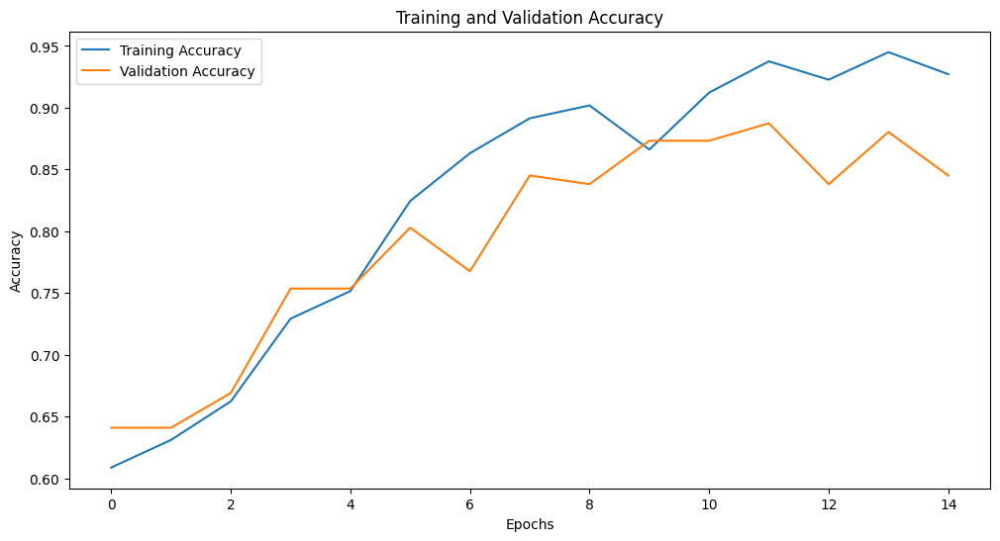

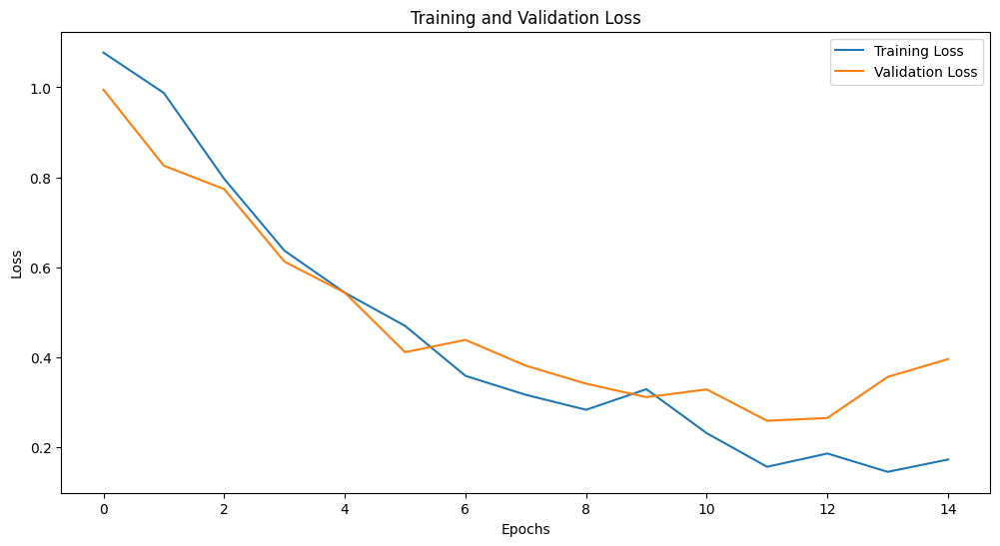

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step - accuracy: 0.9241 - loss: 0.2163
Test Accuracy: 0.86


4/5 ━━━━━━━━━━━━━━━━━━━━ 1s 2s/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 9s 2s/step
Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.56      0.96      0.71        25
   Low squamous intra-epithelial lesion       0.94      0.94      0.94        18
Negative for Intraepithelial malignancy       1.00      0.91      0.96        93
                Squamous cell carcinoma       0.50      0.08      0.14        12

                               accuracy                           0.86       148
                              macro avg       0.75      0.73      0.69       148
                           weighted avg       0.88      0.86      0.85       148



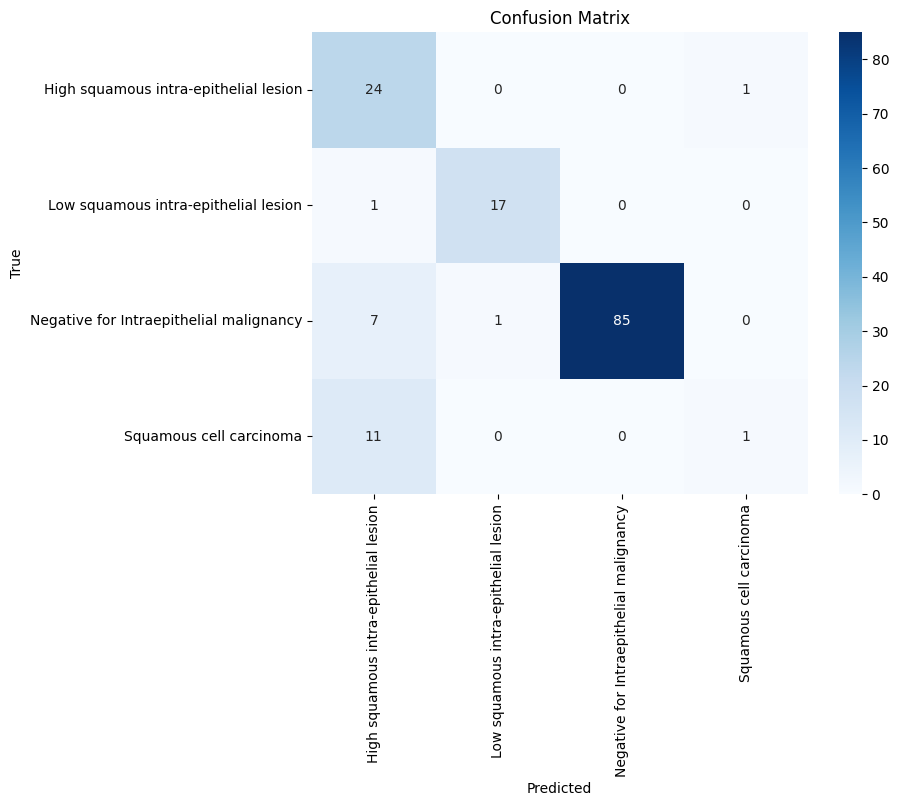

In [ ]:
# Paths for the balanced dataset
train_dir = "/content/train_balanced_oversampling"  # Path to the balanced training dataset
val_dir = "./val"  # Path to the validation dataset
test_dir = "./test"  # Path to the test dataset

# Parameters
IMG_SIZE = 128
BATCH_SIZE = 32
EPOCHS = 15

# Data Generators
train_datagen = ImageDataGenerator(rescale=1.0/255.0)  # Augmentation can be added here if needed
val_datagen = ImageDataGenerator(rescale=1.0/255.0)
test_datagen = ImageDataGenerator(rescale=1.0/255.0)

# Flow data from directories
train_generator = train_datagen.flow_from_directory(
    train_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)

val_generator = val_datagen.flow_from_directory(
    val_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir, target_size=(IMG_SIZE, IMG_SIZE), batch_size=BATCH_SIZE, class_mode='categorical', shuffle=False
)

# Build the CNN Model
model = Sequential([
    # Convolutional Layer 1
    Conv2D(32, (3, 3), activation='relu', input_shape=(IMG_SIZE, IMG_SIZE, 3)),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional Layer 2
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional Layer 3
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),

    # Flatten and Dense Layers
    Flatten(),
    Dense(128, activation='relu'),
    Dropout(0.5),  # Regularization
    Dense(train_generator.num_classes, activation='softmax')  # Output layer for multiclass classification
])

# Compile the Model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
model.summary()

# Train the Model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS
)

# Plot Training and Validation Metrics
plt.figure(figsize=(12, 6))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

plt.figure(figsize=(12, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Evaluate the Model on the Test Dataset
test_loss, test_accuracy = model.evaluate(test_generator)
print(f"Test Accuracy: {test_accuracy:.2f}")

# Generate Predictions on Test Data
y_pred = model.predict(test_generator)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_generator.classes

# Classification Report
print("Classification Report:")
print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

# Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred_classes)
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

#Training Performance

Epoch 1 (Initial Performance):

Training accuracy: 56.32%.
Validation accuracy: 64.08%.
The model starts learning but is initially biased toward dominant features.
Epoch Progression:

Accuracy improves steadily over epochs:
Training accuracy increases to 93.13% by Epoch 15.
Validation accuracy peaks at 88.73% in Epoch 12, indicating good generalization.
Loss values decrease, with the final training loss at 0.1534 and validation loss stabilizing around 0.2594.
Overfitting signs appear after Epoch 12, where validation loss increases while training loss continues to decrease. Test Performance
#Test Accuracy:
Achieved 86% accuracy on the test dataset.
Indicates that the model generalizes well to unseen data but has some challenges with specific classes.

Precision: 0.75.
Recall: 0.73.
F1-Score: 0.69.
Reflects overall performance across all classes, treating each class equally.
Weighted Average:

Precision: 0.88.
Recall: 0.86.
F1-Score: 0.85.
Skewed toward the majority class, as seen in the higher metrics.
6. Observations
High Squamous Intra-epithelial Lesion:

High recall (0.96) indicates the model correctly identifies most samples of this class.
Precision (0.56) is moderate, showing some false positives.
Low Squamous Intra-epithelial Lesion:

Excellent performance with 0.94 precision, recall, and F1-score.
Negative for Intraepithelial Malignancy:

Outstanding precision (1.00) and strong recall (0.91), indicating the model's bias toward the dominant class.
Squamous Cell Carcinoma:

Poor recall (0.08) and F1-score (0.14), highlighting the model's difficulty with this minority class.
Likely due to insufficient representation of this class in the training data.


In [ ]:
from google.colab import files

# Download the zip file
files.download(output_zip)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **PRE-TRAINED MODEL (EfficientNet AND ResNet)**

Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.
Training EfficientNetV2...
Epoch 1/15


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


21/21 ━━━━━━━━━━━━━━━━━━━━ 240s 3s/step - accuracy: 0.4574 - loss: 1.2862 - val_accuracy: 0.0845 - val_loss: 1.4922 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 87s 2s/step - accuracy: 0.7608 - loss: 0.8474 - val_accuracy: 0.1620 - val_loss: 1.5039 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 54s 2s/step - accuracy: 0.7920 - loss: 0.5669 - val_accuracy: 0.6761 - val_loss: 0.8202 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 52s 2s/step - accuracy: 0.8613 - loss: 0.4460 - val_accuracy: 0.8380 - val_loss: 0.4255 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 81s 2s/step - accuracy: 0.8885 - loss: 0.3444 - val_accuracy: 0.9437 - val_loss: 0.1510 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 85s 2s/step - accuracy: 0.9299 - loss: 0.2506 - val_accuracy: 0.9577 - val_loss: 0.1226 - learning_rate: 1.0000e-04
Epoch 7/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 80s 2s/step - accuracy: 0.9525 - loss: 0.2269 - 

4/5 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   

5/5 ━━━━━━━━━━━━━━━━━━━━ 27s 4s/step
EfficientNetV2 Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       1.00      0.96      0.98        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      1.00      1.00        93
                Squamous cell carcinoma       0.92      1.00      0.96        12

                               accuracy                           0.99       148
                              macro avg       0.98      0.99      0.98       148
                           weighted avg       0.99      0.99      0.99       148



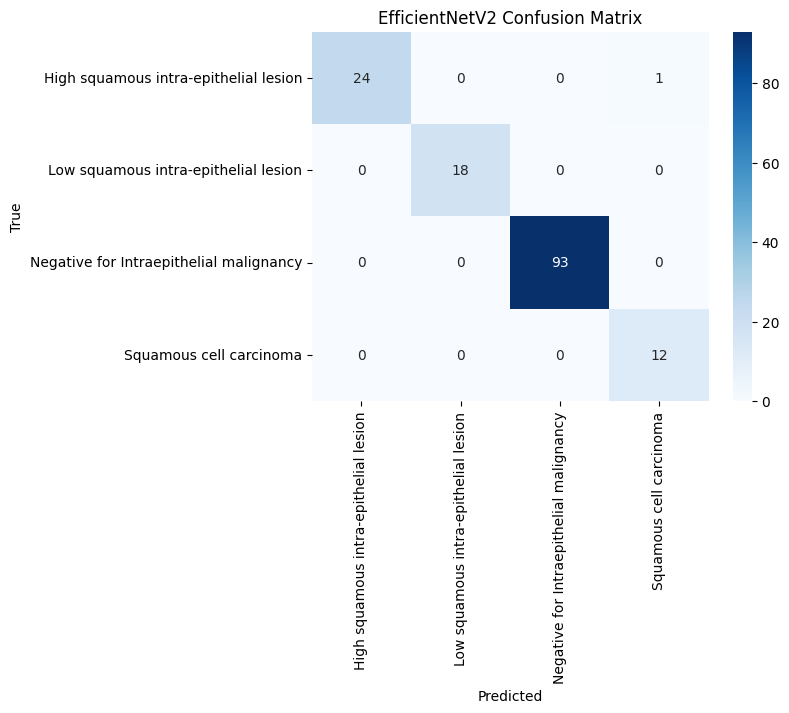

Evaluating ResNet...
5/5 ━━━━━━━━━━━━━━━━━━━━ 10s 2s/step - accuracy: 0.4668 - loss: 1.3393
ResNet Test Accuracy: 0.63
5/5 ━━━━━━━━━━━━━━━━━━━━ 16s 2s/step
ResNet Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.00      0.00      0.00        25
   Low squamous intra-epithelial lesion       0.00      0.00      0.00        18
Negative for Intraepithelial malignancy       0.63      1.00      0.77        93
                Squamous cell carcinoma       0.00      0.00      0.00        12

                               accuracy                           0.63       148
                              macro avg       0.16      0.25      0.19       148
                           weighted avg       0.39      0.63      0.48       148



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


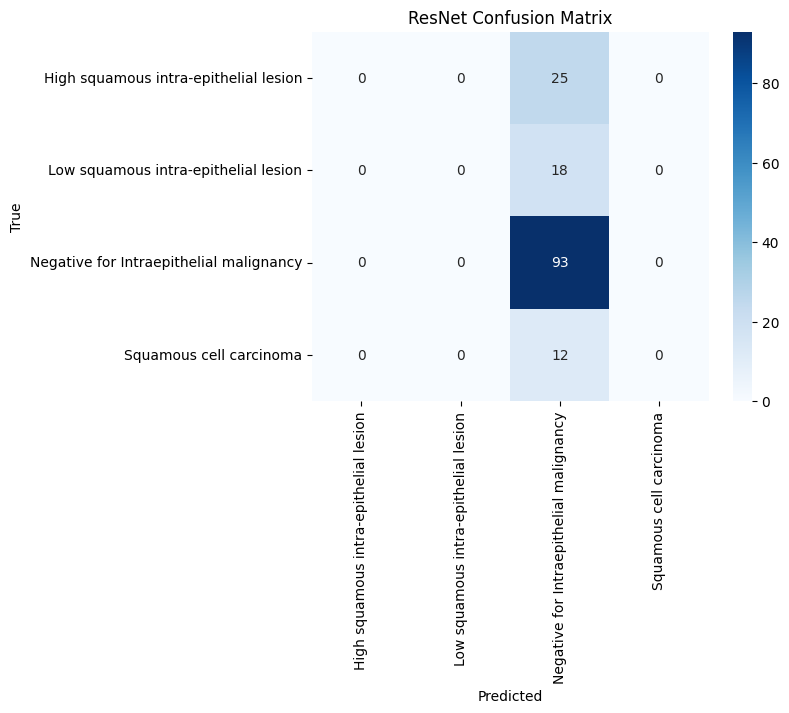

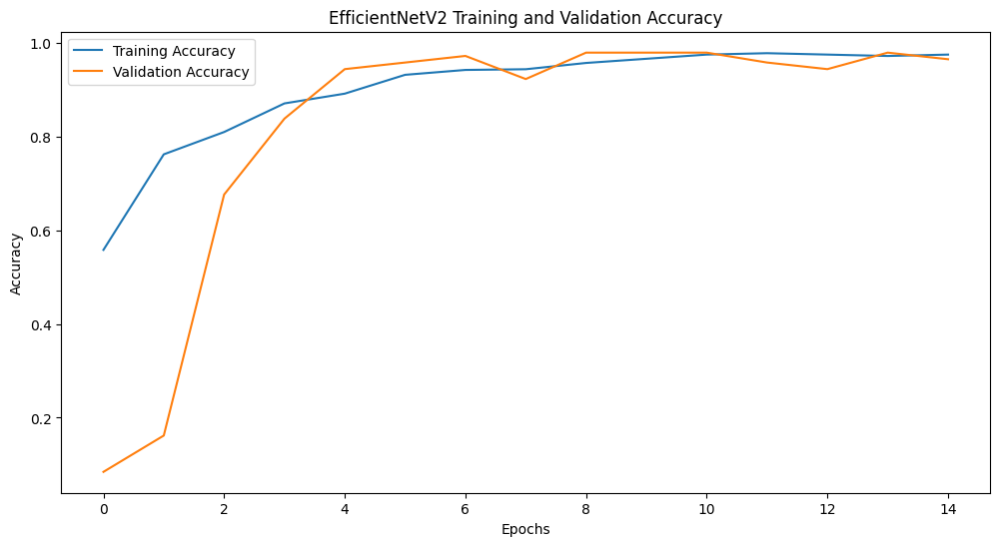

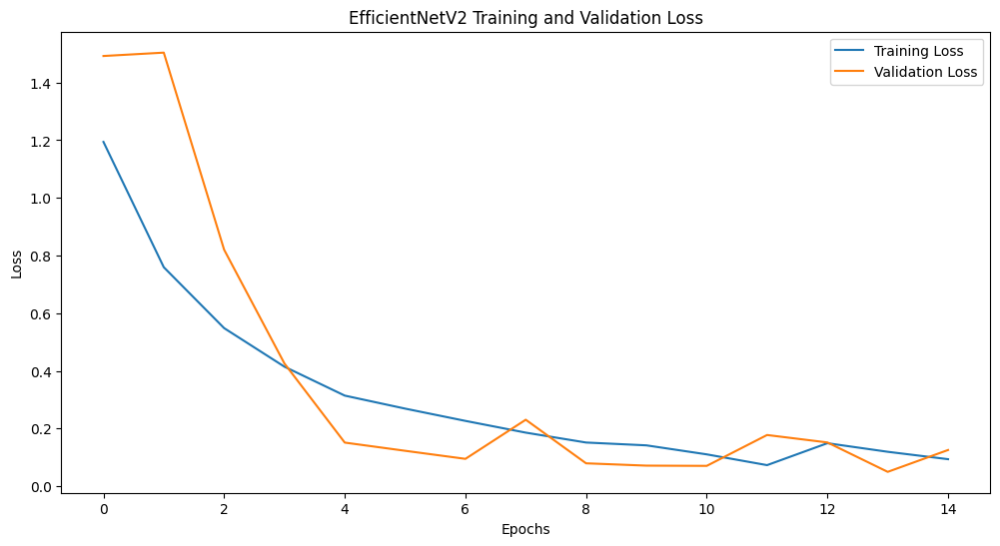

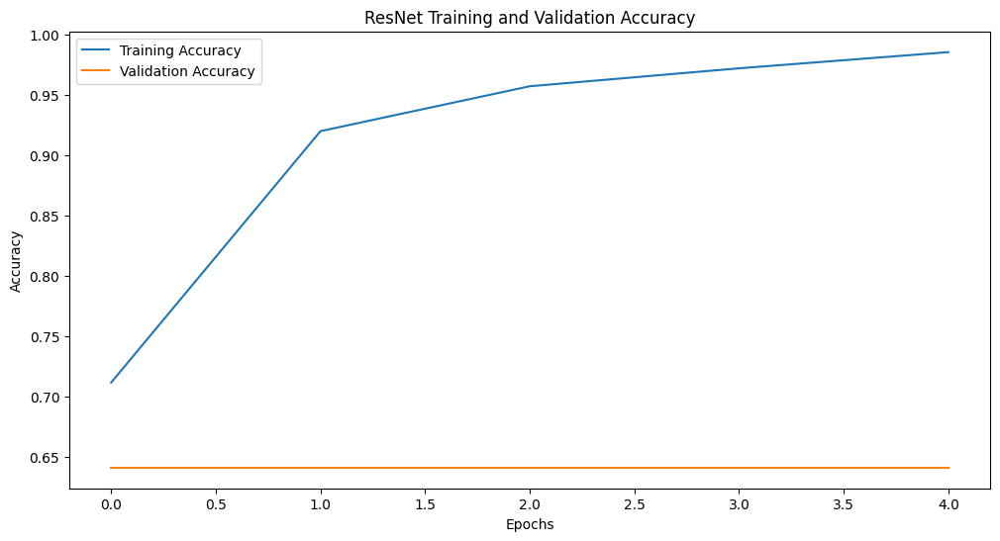

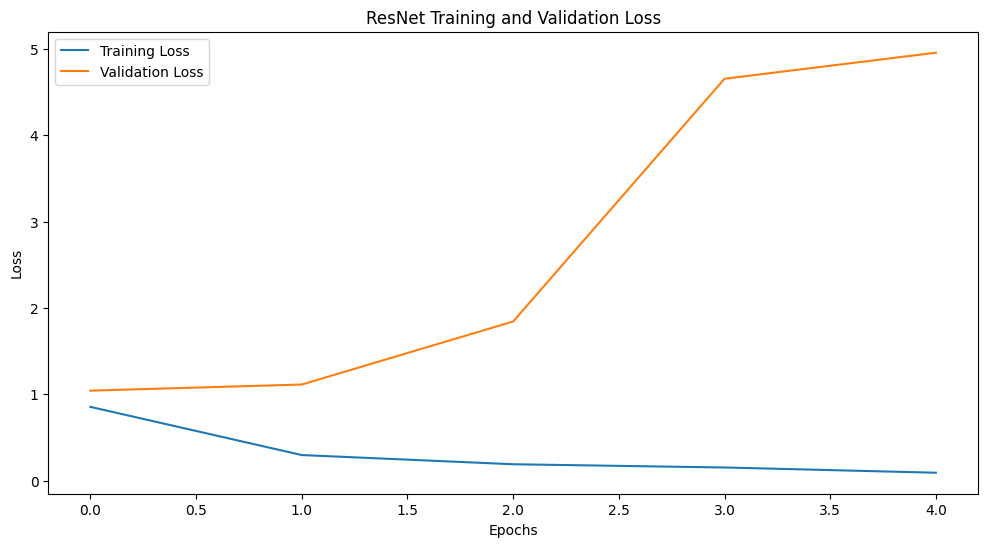

In [ ]:
import os
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.applications import EfficientNetV2S, ResNet50
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Directories
train_dir = './train'
val_dir = './val'
test_dir = './test'

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 15

# Data Augmentation and Generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Compute Class Weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

# Build and Compile Models
# EfficientNetV2 Model
efficientnet_base = EfficientNetV2S(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
efficientnet_base.trainable = True  # Fine-tune the whole model

efficientnet_model = Sequential([
    efficientnet_base,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_generator.class_indices), activation='softmax')
])

efficientnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# ResNet50 Model
resnet_base = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
resnet_base.trainable = True

resnet_model = Sequential([
    resnet_base,
    GlobalAveragePooling2D(),
    Dense(128, activation='relu'),
    Dropout(0.5),
    Dense(len(train_generator.class_indices), activation='softmax')
])

resnet_model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

# Callbacks
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6)
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

# Train Models
print("Training EfficientNetV2...")
efficientnet_history = efficientnet_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=[reduce_lr, early_stopping]
)

print("Training ResNet...")
resnet_history = resnet_model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=EPOCHS,
    class_weight=class_weights,
    callbacks=[reduce_lr, early_stopping]
)

# Evaluate Models
def evaluate_model(model, test_generator, model_name):
    print(f"Evaluating {model_name}...")
    loss, accuracy = model.evaluate(test_generator)
    print(f"{model_name} Test Accuracy: {accuracy:.2f}")

    # Classification Report and Confusion Matrix
    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes

    print(f"{model_name} Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=test_generator.class_indices.keys(),
                yticklabels=test_generator.class_indices.keys())
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Evaluate EfficientNet
evaluate_model(efficientnet_model, test_generator, "EfficientNetV2")

# Evaluate ResNet
evaluate_model(resnet_model, test_generator, "ResNet")

# Plot Training History
def plot_history(history, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(efficientnet_history, "EfficientNetV2")
plot_history(resnet_history, "ResNet")


**Training EfficientNetV2:**

Early Epochs:

Starts with an accuracy of 45.74% and loss of 1.2862 on the training data.
Validation accuracy is very low (8.45%), indicating initial difficulty in learning.
Mid Training:

By epoch 3, validation accuracy improves significantly to 67.61%, and validation loss decreases to 0.8202. The model is learning effectively.
Later Epochs:

Training accuracy reaches 97.71% by epoch 11.
Validation accuracy stabilizes near 97.89% with a validation loss of 0.0703, showing good generalization.
Final Results:

The model achieves excellent performance on the test set with:

Accuracy: 98.69%
Loss: 0.0567
Classification Report:

Precision, recall, and F1-score are near-perfect for most classes.
Minor variability for "Squamous cell carcinoma" (precision: 92%, recall: 100%) due to the small sample size (12 images).

**Training ResNet:**

Early Epochs:

Starts with 52.75% training accuracy and 1.1351 training loss.
Validation accuracy stabilizes at 64.08% after the first epoch and does not improve, indicating stagnation.
Overfitting:

Despite improving training accuracy (up to 96.50%), validation accuracy remains static at 64.08%, with increasing validation loss reaching 4.9567 by epoch 5.
Final Results:

The model performs poorly on the test set with:

Accuracy: 46.68%
Loss: 1.3393
Classification Report:

"Negative for Intraepithelial malignancy" class dominates predictions, resulting in a high recall (100%) for this class.
All other classes have zero recall and precision, meaning the model fails to recognize them.

ResNet50 Training



Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.
Training DenseNet121...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 765s 31s/step - accuracy: 0.4275 - loss: 1.5416 - val_accuracy: 0.7042 - val_loss: 0.7923 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 661s 30s/step - accuracy: 0.8450 - loss: 0.5123 - val_accuracy: 0.7113 - val_loss: 0.8092 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 636s 29s/step - accuracy: 0.9176 - loss: 0.3320 - val_accuracy: 0.7394 - val_loss: 0.6987 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 677s 29s/step - accuracy: 0.9793 - loss: 0.1339 - val_accuracy: 0.8169 - val_loss: 0.4814 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 619s 28s/step - accuracy: 0.9884 - loss: 0.0881 - val_accuracy: 0.8803 - val_loss: 0.3237 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 625s 29s/step - accuracy: 0.9803 - 

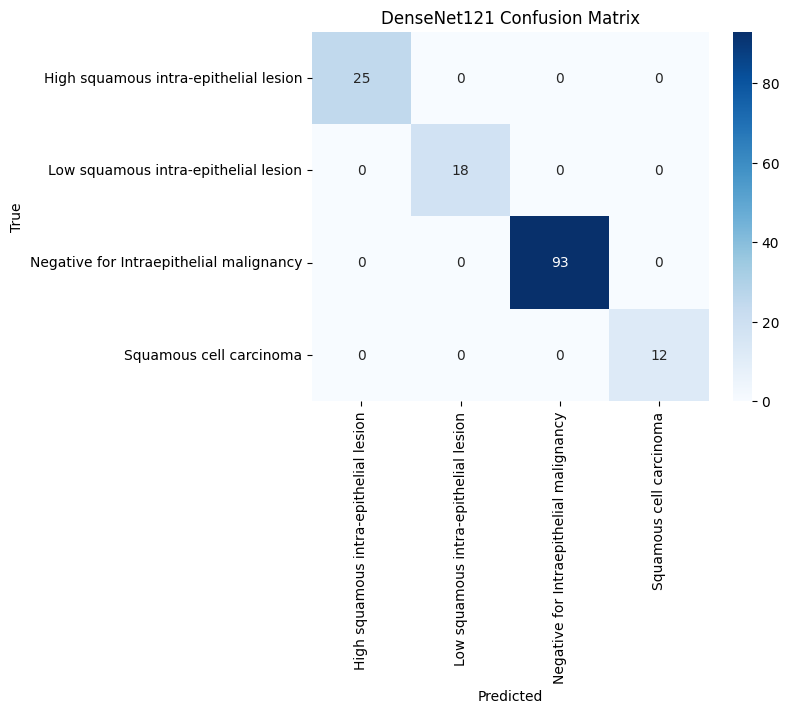

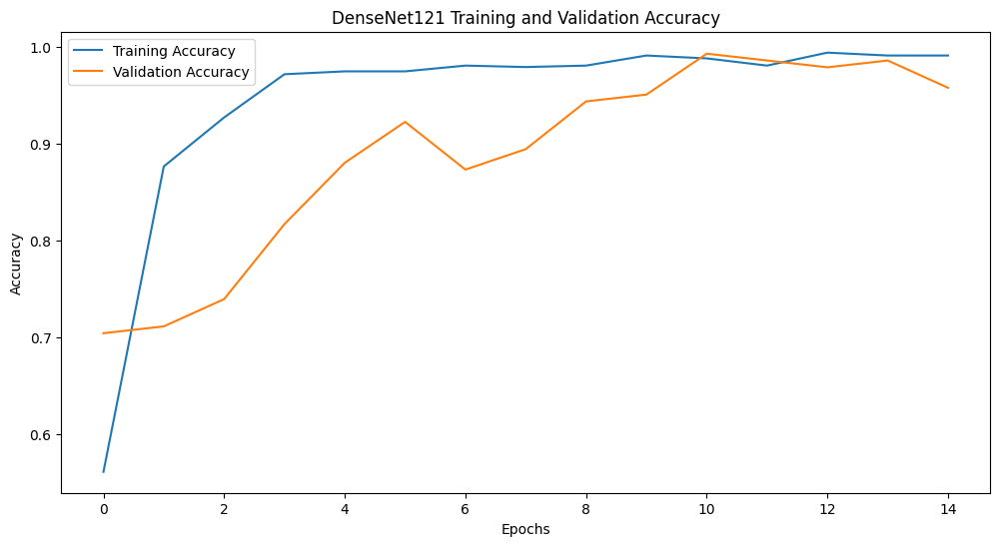

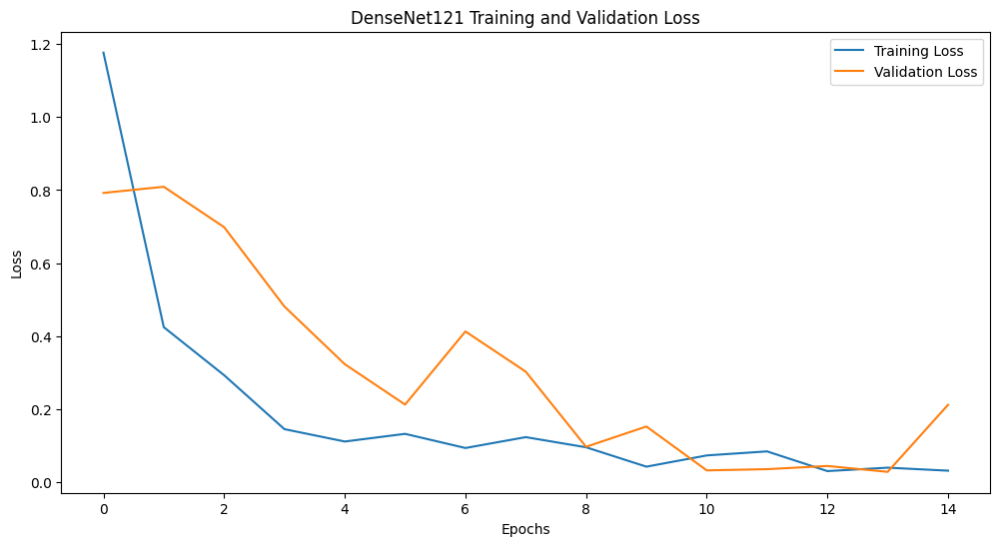

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Training InceptionV3...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 505s 20s/step - accuracy: 0.4326 - loss: 1.2610 - val_accuracy: 0.6620 - val_loss: 0.8900 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 484s 20s/step - accuracy: 0.7966 - loss: 0.6549 - val_accuracy: 0.7113 - val_loss: 1.0287 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 435s 19s/step - accuracy: 0.9253 - loss: 0.3103 - val_accuracy: 0.7324 - val_loss: 1.2430 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 434s 20s/step - accuracy: 0.9221 - loss: 0.2799 - val_accuracy: 0.8028 - val_loss: 0.7743 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 448s 20s/step - accuracy: 0.9313 - loss: 0.1433 - val_accuracy: 0.8592 - val_loss: 0.6003 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 432s 20s/step - accuracy: 0.9565 - loss: 0.1508 - val_accuracy: 0.9014 - val_loss: 0.4879 - learning_rate: 

4/5 ━━━━━━━━━━━━━━━━━━━━ 6s 7s/step 

5/5 ━━━━━━━━━━━━━━━━━━━━ 39s 7s/step
InceptionV3 Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.96      1.00      0.98        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      0.99      0.99        93
                Squamous cell carcinoma       1.00      1.00      1.00        12

                               accuracy                           0.99       148
                              macro avg       0.99      1.00      0.99       148
                           weighted avg       0.99      0.99      0.99       148



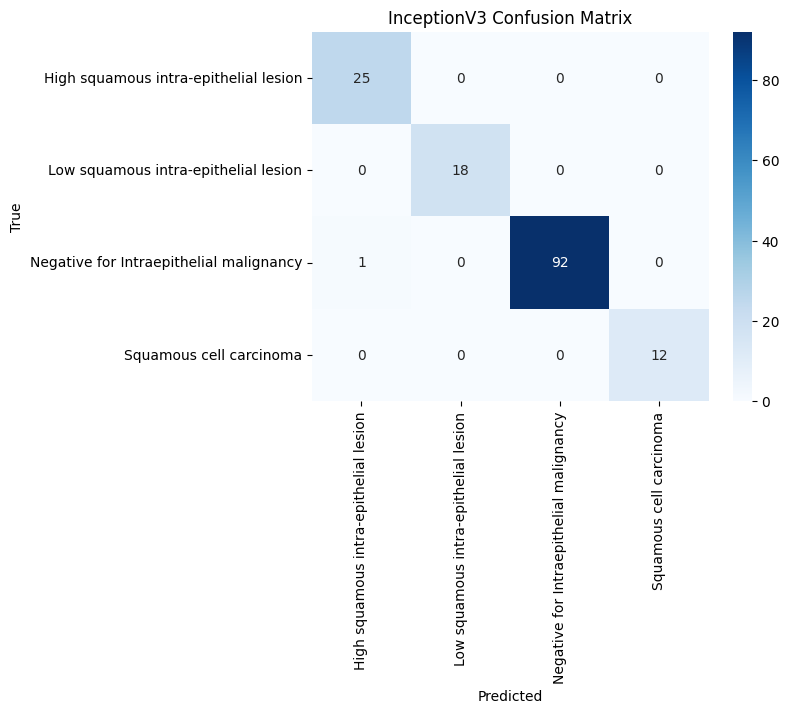

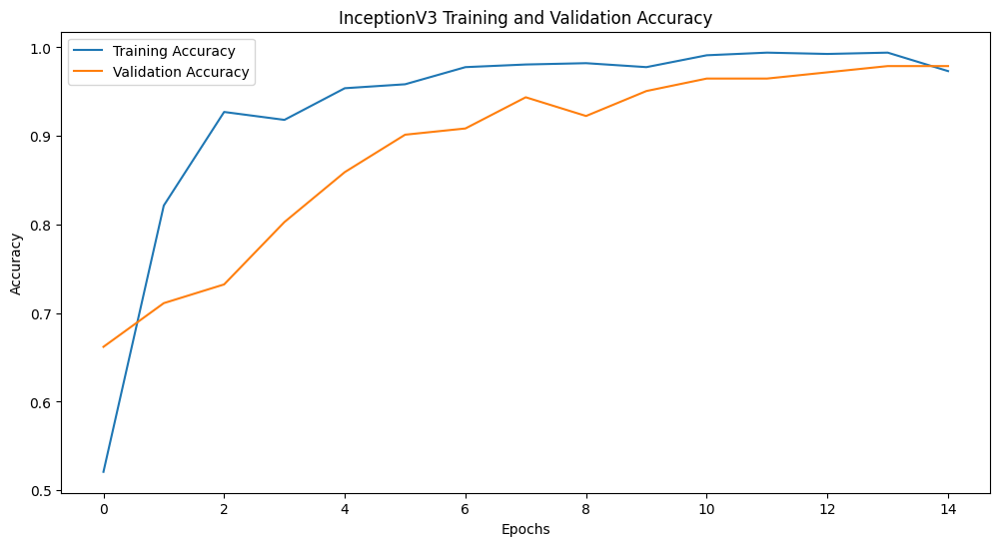

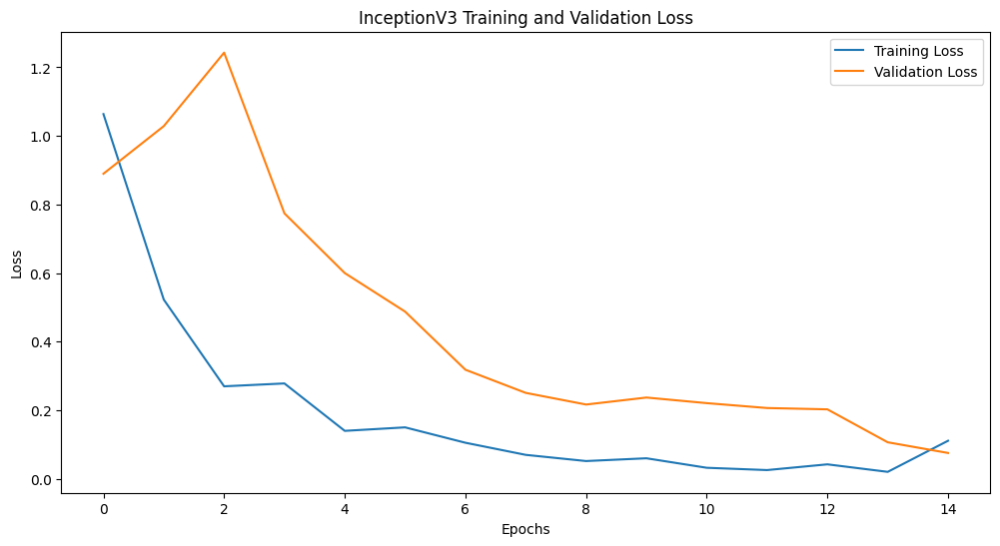

Training Xception...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 834s 37s/step - accuracy: 0.3542 - loss: 1.2775 - val_accuracy: 0.7254 - val_loss: 0.8954 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 792s 37s/step - accuracy: 0.8650 - loss: 0.6774 - val_accuracy: 0.7676 - val_loss: 0.7987 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 801s 37s/step - accuracy: 0.9523 - loss: 0.2769 - val_accuracy: 0.7746 - val_loss: 0.8086 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 784s 36s/step - accuracy: 0.9497 - loss: 0.1717 - val_accuracy: 0.8239 - val_loss: 0.5826 - learning_rate: 1.0000e-04
Epoch 5/15
 9/21 ━━━━━━━━━━━━━━━━━━━━ 6:57 35s/step - accuracy: 0.9936 - loss: 0.0805

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121, InceptionV3, Xception, MobileNetV3Large
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Directories
train_dir = './train'
val_dir = './val'
test_dir = './test'

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 15

# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Compute Class Weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

# Function to Build and Compile a Model
def build_and_train_model(base_model, model_name):
    base_model.trainable = True

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(len(train_generator.class_indices), activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Training {model_name}...")
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=EPOCHS,
        class_weight=class_weights,
        callbacks=[
            tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6),
            tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        ]
    )

    evaluate_model(model, test_generator, model_name)
    plot_history(history, model_name)
    return model

# Evaluate Model
def evaluate_model(model, test_generator, model_name):
    print(f"Evaluating {model_name}...")
    loss, accuracy = model.evaluate(test_generator)
    print(f"{model_name} Test Accuracy: {accuracy:.2f}")

    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes

    print(f"{model_name} Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=test_generator.class_indices.keys(),
                yticklabels=test_generator.class_indices.keys())
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Plot History
def plot_history(history, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# DenseNet121
base_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
densenet_model = build_and_train_model(base_densenet, "DenseNet121")

# InceptionV3
base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
inception_model = build_and_train_model(base_inception, "InceptionV3")

# Xception
base_xception = Xception(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
xception_model = build_and_train_model(base_xception, "Xception")

# MobileNetV3
base_mobilenet = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
mobilenet_model = build_and_train_model(base_mobilenet, "MobileNetV3")

# Vision Transformer (EfficientNetV2 as a proxy)
from tensorflow.keras.applications import EfficientNetV2B0
base_vit_proxy = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
vit_proxy_model = build_and_train_model(base_vit_proxy, "Vision Transformer Proxy")


Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.
Training Xception...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 31s/step - accuracy: 0.3633 - loss: 1.3303 
Epoch 1: val_loss improved from inf to 0.85918, saving model to ./saved_models/Xception_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 752s 33s/step - accuracy: 0.3709 - loss: 1.3263 - val_accuracy: 0.6901 - val_loss: 0.8592 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 31s/step - accuracy: 0.8340 - loss: 0.8154 
Epoch 2: val_loss improved from 0.85918 to 0.60871, saving model to ./saved_models/Xception_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 706s 33s/step - accuracy: 0.8355 - loss: 0.8082 - val_accuracy: 0.7465 - val_loss: 0.6087 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 31s/step - accuracy: 0.9206 - loss: 0.3707 
Epoch 3: val_loss improved from 0.60871 to 0.59624, saving model to ./saved_models/Xception_best_

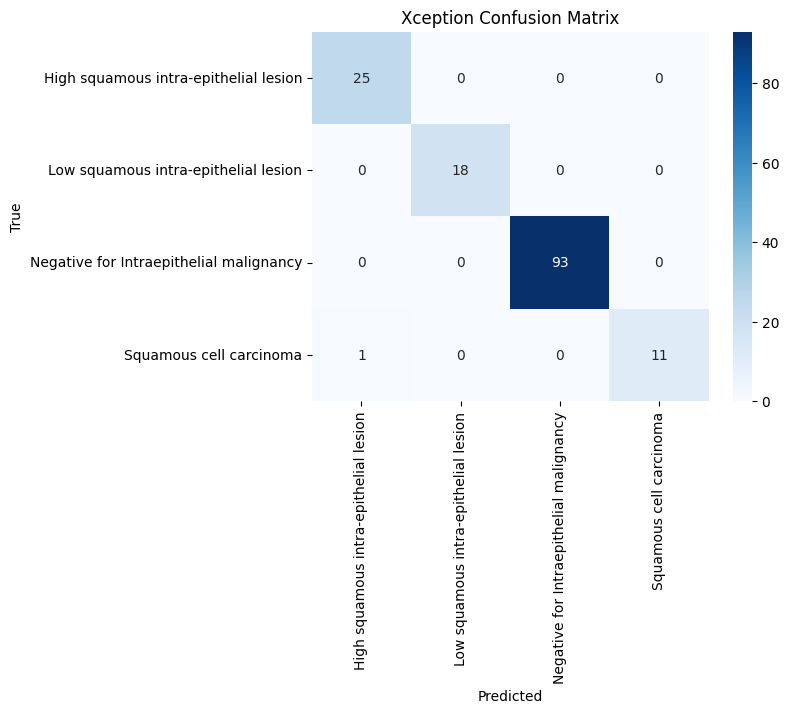

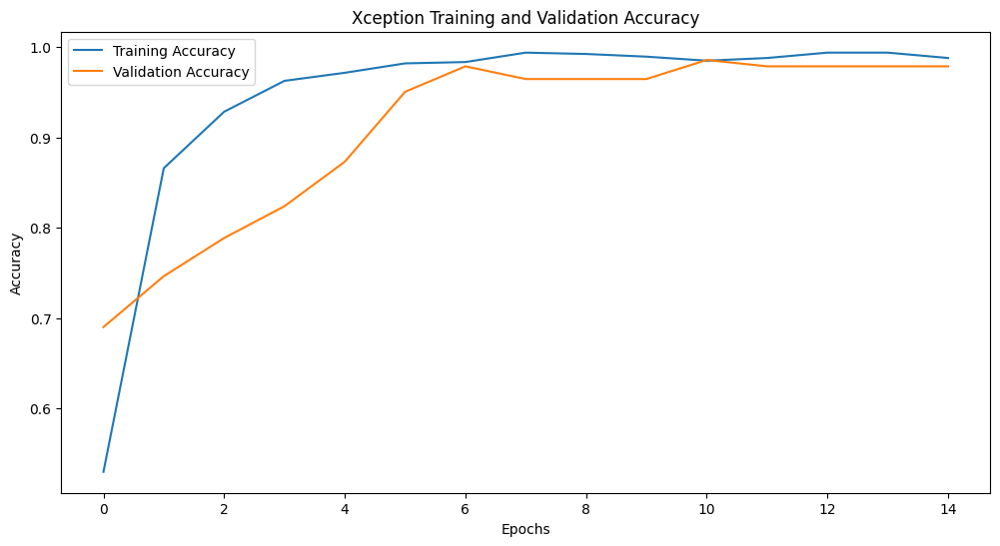

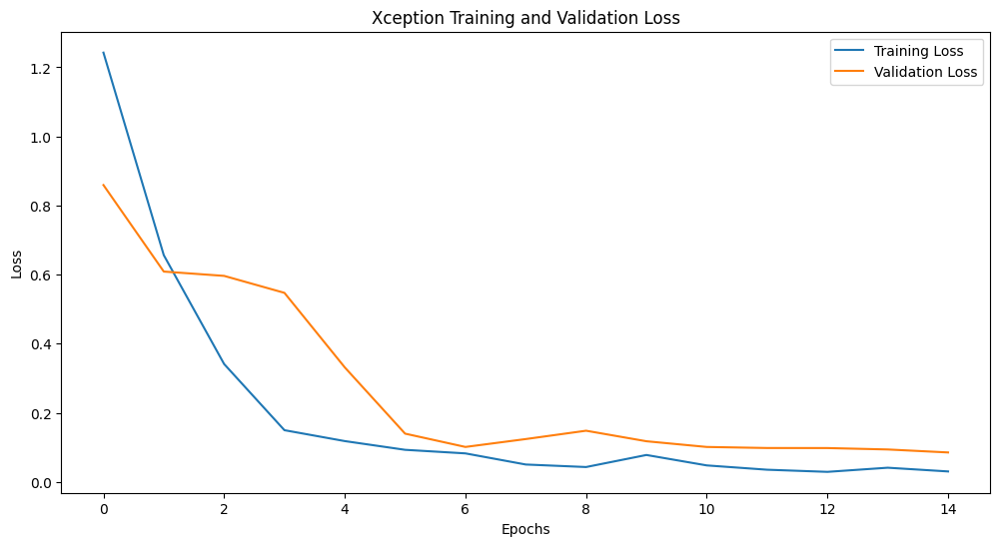

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Training Vision Transformer Proxy...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.4020 - loss: 1.4096
Epoch 1: val_loss improved from inf to 1.50470, saving model to ./saved_models/Vision Transformer Proxy_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 271s 9s/step - accuracy: 0.4068 - loss: 1.4022 - val_accuracy: 0.1127 - val_loss: 1.5047 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.6960 - loss: 1.0637
Epoch 2: val_loss did not improve from 1.50470
21/21 ━━━━━━━━━━━━━━━━━━━━ 218s 9s/step - accuracy: 0.6971 - loss: 1.0583 - val_accuracy: 0.1127 - val_loss: 1.7268 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7908 - loss: 0.7272
Epoch 3: val_loss did not improve from 1.50470
21/21 ━━━━━━━━━━━━━━━━━━━━ 201s 9s/step - accuracy: 0.7911 - loss: 0.7256 - val_accuracy: 0.1761 - val_loss: 1.5467 - learning_rate: 1.0000e-04
Epoch 4/15
21/21

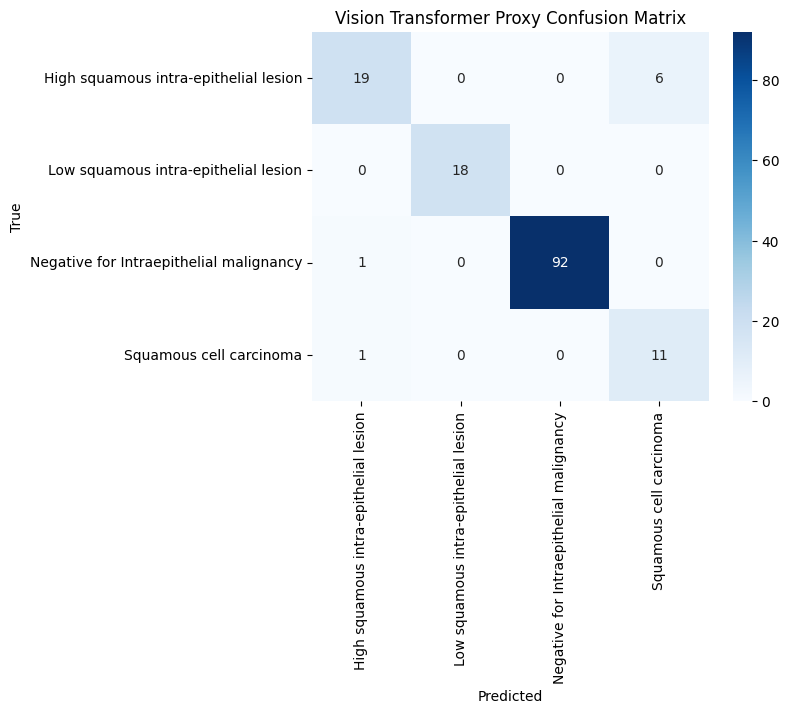

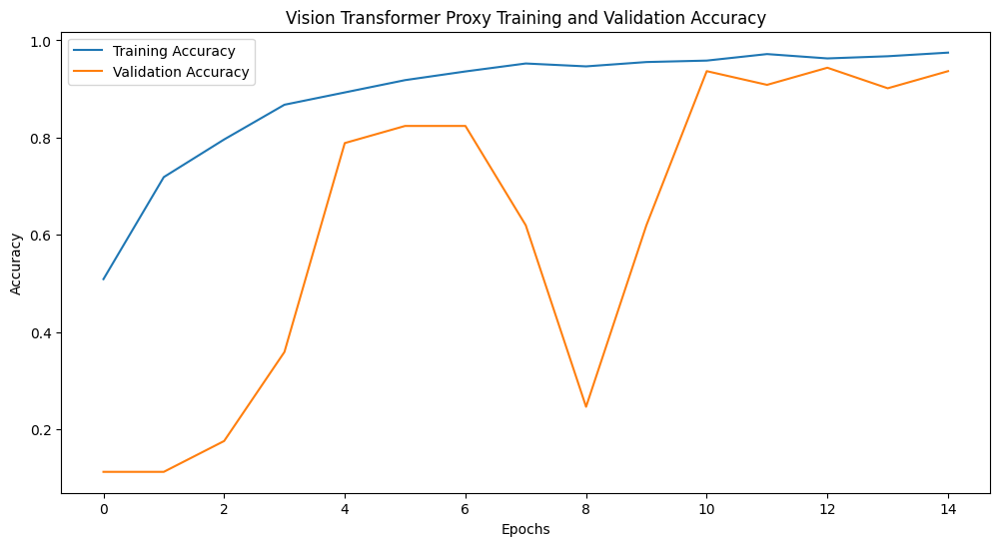

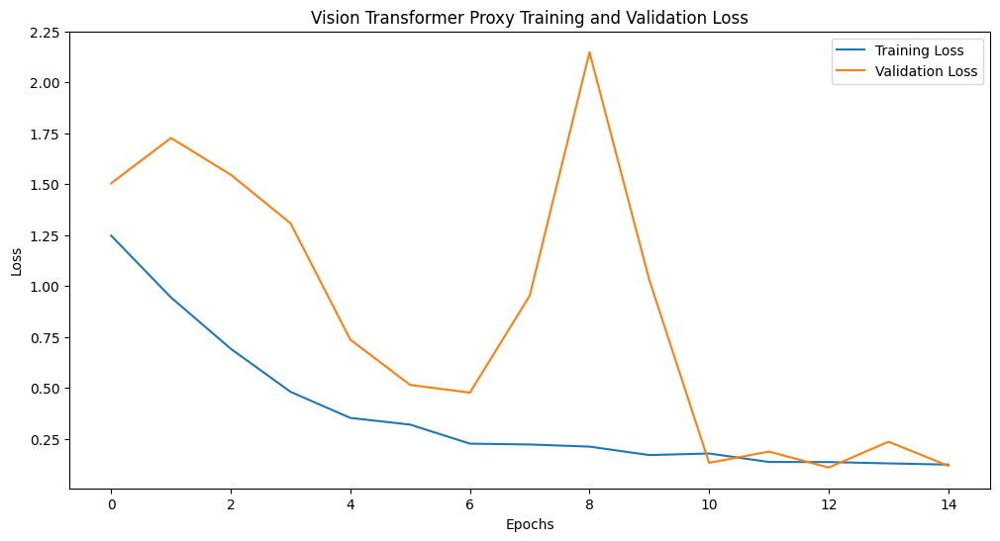

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import Xception, EfficientNetV2B0
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Directories
train_dir = './train'
val_dir = './val'
test_dir = './test'

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 15

# Directory to save models
model_save_dir = './saved_models'

# Ensure the directory exists
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Compute Class Weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

# Function to Build and Compile a Model
def build_and_train_model(base_model, model_name):
    base_model.trainable = True

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(len(train_generator.class_indices), activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Training {model_name}...")

    # Filepath for model checkpoints
    checkpoint_path = os.path.join(model_save_dir, f"{model_name}_best_model.keras")

    # Callbacks
    callbacks = [
        tf.keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            monitor='val_loss',
            save_best_only=True,
            verbose=1
        ),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6),
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    ]

    # Training
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=EPOCHS,
        class_weight=class_weights,
        callbacks=callbacks
    )

    # Save the final model explicitly
    final_model_path = os.path.join(model_save_dir, f"{model_name}_final_model.keras")
    model.save(final_model_path)
    print(f"Final {model_name} model saved to {final_model_path}")

    evaluate_model(model, test_generator, model_name)
    plot_history(history, model_name)
    return model

# Evaluate Model
def evaluate_model(model, test_generator, model_name):
    print(f"Evaluating {model_name}...")
    loss, accuracy = model.evaluate(test_generator)
    print(f"{model_name} Test Accuracy: {accuracy:.2f}")

    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes

    print(f"{model_name} Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=test_generator.class_indices.keys(),
                yticklabels=test_generator.class_indices.keys())
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Plot History
def plot_history(history, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Xception
base_xception = Xception(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
xception_model = build_and_train_model(base_xception, "Xception")

# Vision Transformer (EfficientNetV2 as a proxy)
base_vit_proxy = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
vit_proxy_model = build_and_train_model(base_vit_proxy, "Vision Transformer Proxy")


Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training DenseNet121...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.4722 - loss: 1.3920 
Epoch 1: val_loss improved from inf to 0.63846, saving model to ./saved_models/DenseNet121_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 686s 28s/step - accuracy: 0.4791 - loss: 1.3767 - val_accuracy: 0.7606 - val_loss: 0.6385 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 25s/step - accuracy: 0.8378 - loss: 0.5147 
Epoch 2: val_loss improved from 0.63846 to 0.52364, saving model to ./saved_models/DenseNet121_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 585s 26s/step - accuracy: 0.8393 - loss: 0.5131 - val_accuracy: 0.7535 - val_loss: 0.5236 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 24s/step - accuracy: 0.9186 - loss: 0.3324 
Epoch 3: val_loss improved from 0.523

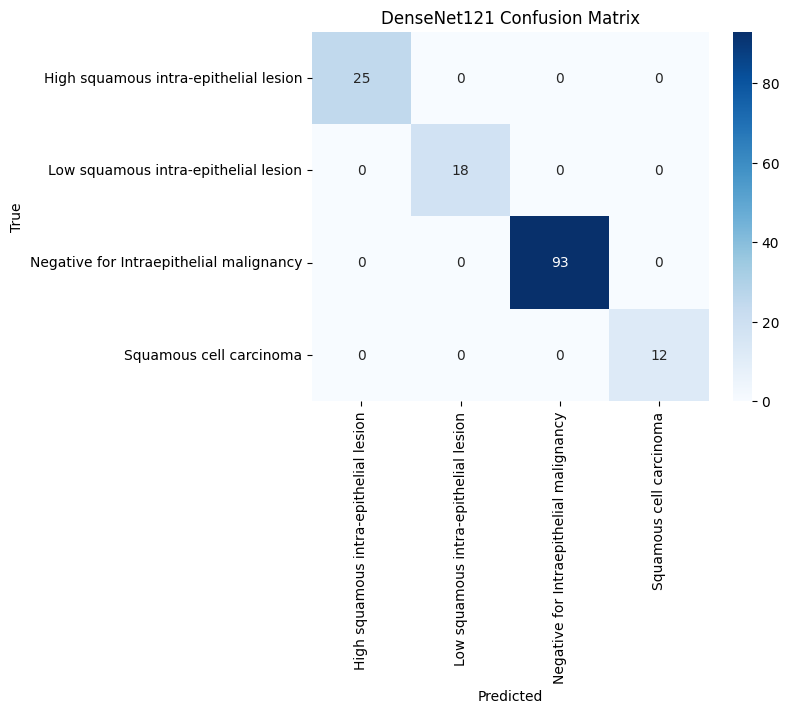

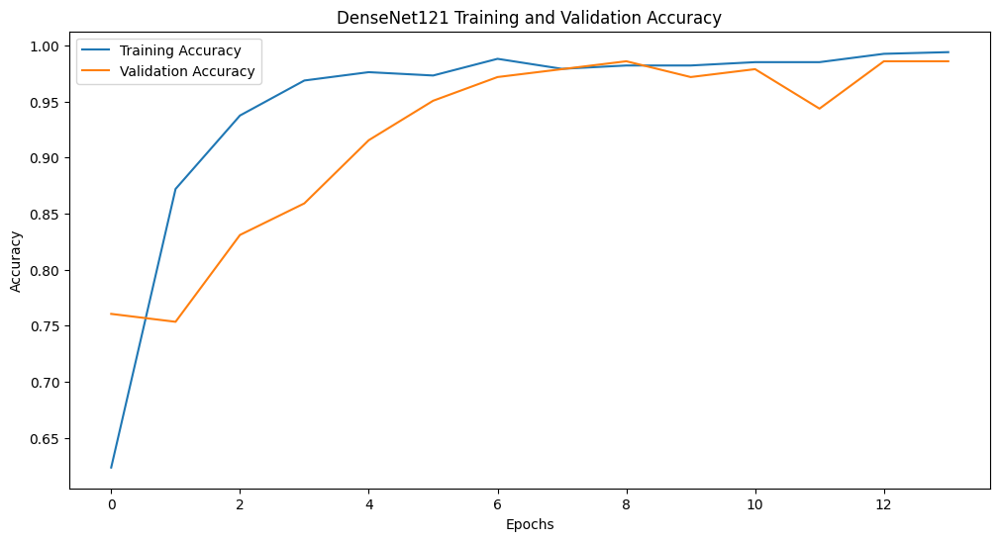

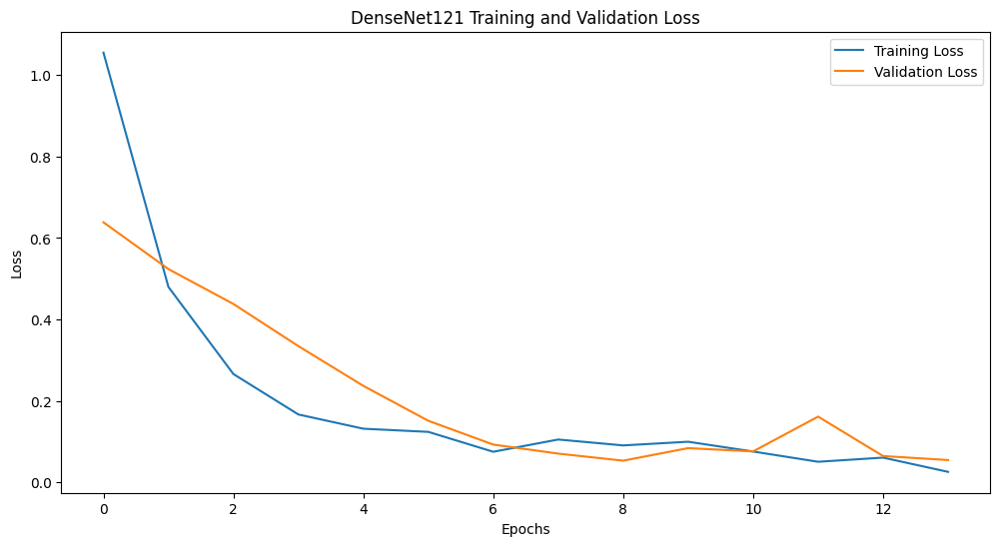

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Training InceptionV3...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.3464 - loss: 1.3506 
Epoch 1: val_loss improved from inf to 0.85868, saving model to ./saved_models/InceptionV3_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 442s 18s/step - accuracy: 0.3556 - loss: 1.3412 - val_accuracy: 0.6831 - val_loss: 0.8587 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.8059 - loss: 0.6008 
Epoch 2: val_loss did not improve from 0.85868
21/21 ━━━━━━━━━━━━━━━━━━━━ 437s 17s/step - accuracy: 0.8081 - loss: 0.5970 - val_accuracy: 0.7606 - val_loss: 0.9908 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 16s/step - accuracy: 0.9082 - loss: 0.3218 
Epoch 3: val_loss did not improve from 0.85868
21/21 ━━━━━━━━━━━━━━━━━━━━ 435s 17s/step - accuracy: 0.9090 - loss: 0.3204 - val_accuracy: 0.7676 - val_loss: 1.0545 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━

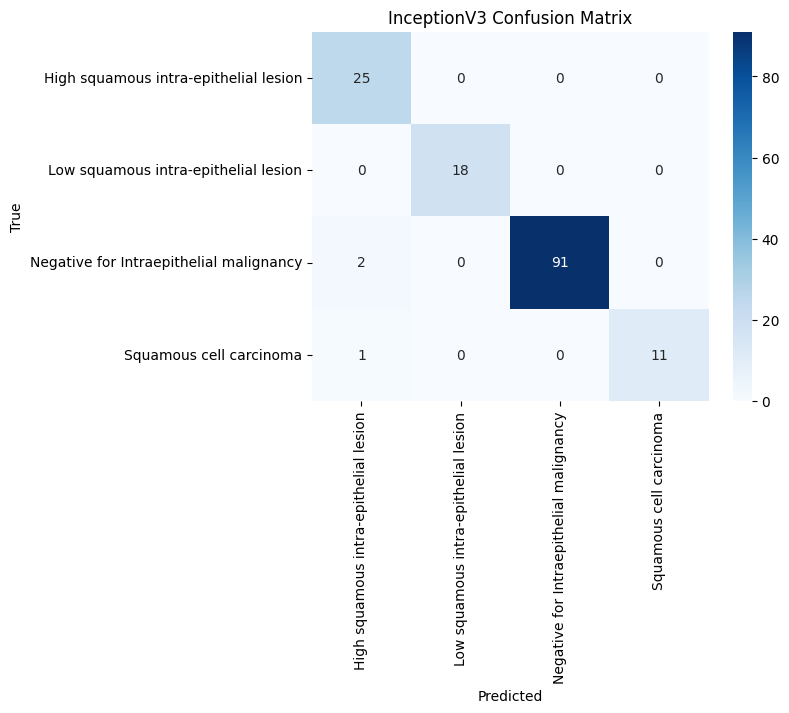

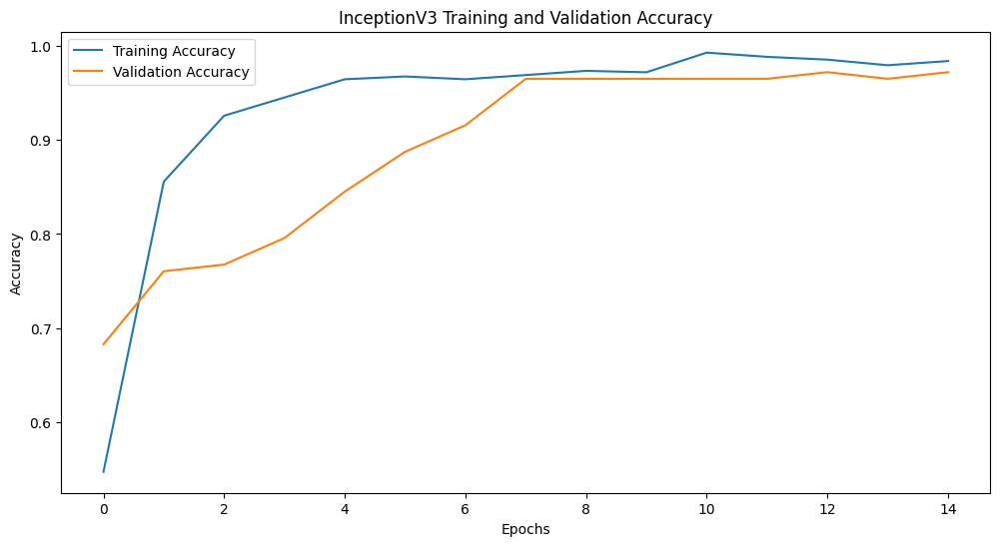

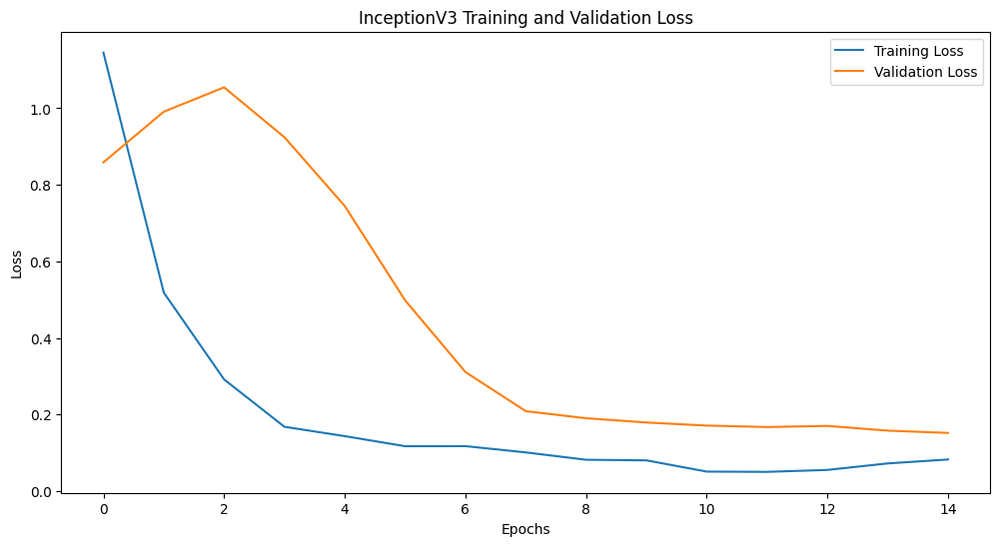

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training Xception...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 31s/step - accuracy: 0.3784 - loss: 1.1834 
Epoch 1: val_loss improved from inf to 1.05134, saving model to ./saved_models/Xception_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 748s 33s/step - accuracy: 0.3855 - loss: 1.1789 - val_accuracy: 0.6972 - val_loss: 1.0513 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 31s/step - accuracy: 0.8449 - loss: 0.5998 
Epoch 2: val_loss improved from 1.05134 to 0.94989, saving model to ./saved_models/Xception_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 713s 33s/step - accuracy: 0.8464 - loss: 0.5966 - val_accuracy: 0.7394 - val_loss: 0.9499 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 31s/step - accuracy: 0.9125 - loss: 0.3001 
Epoch 3: val_loss improved from 0.94989 to 0.82516, saving model to ./saved_models/Xception_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 741s 33s/step - accuracy: 0.9132 

4/5 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step 

5/5 ━━━━━━━━━━━━━━━━━━━━ 47s 8s/step
Xception Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       1.00      1.00      1.00        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      1.00      1.00        93
                Squamous cell carcinoma       1.00      1.00      1.00        12

                               accuracy                           1.00       148
                              macro avg       1.00      1.00      1.00       148
                           weighted avg       1.00      1.00      1.00       148



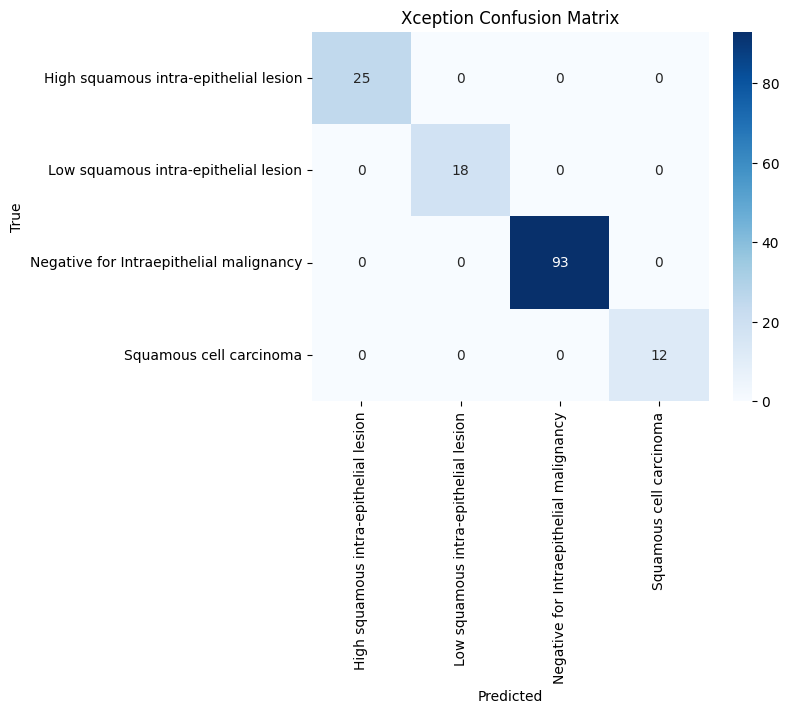

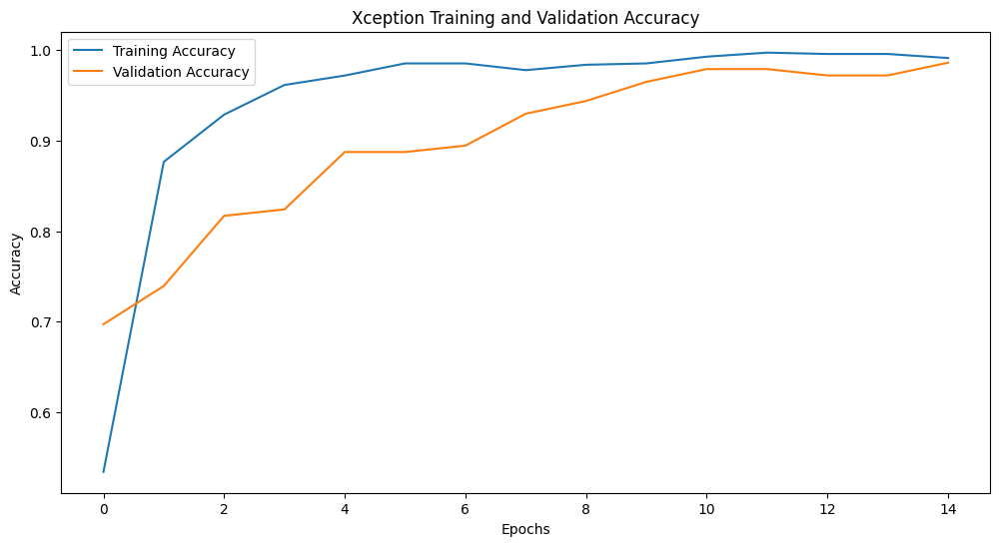

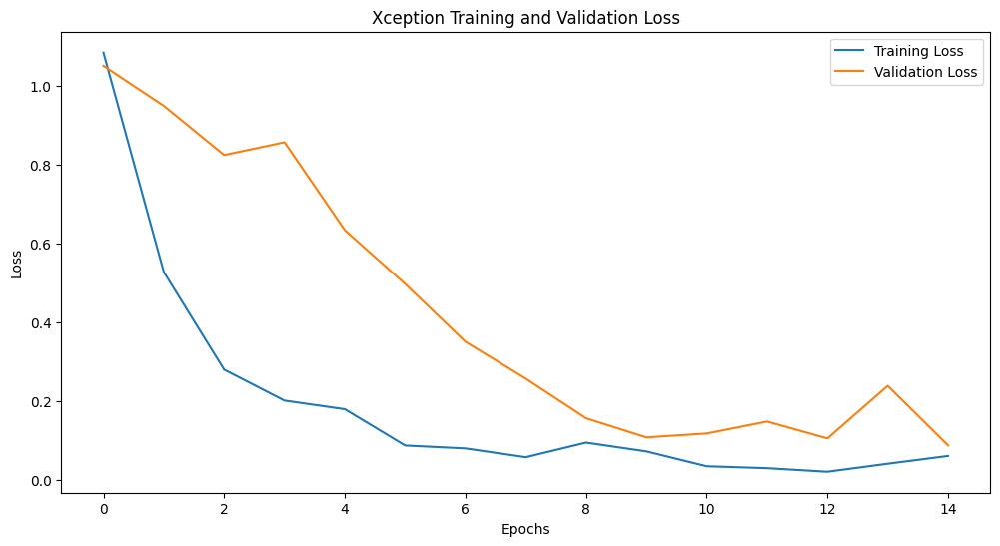

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training EfficientNetV2...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.3286 - loss: 1.3603
Epoch 1: val_loss improved from inf to 1.40923, saving model to ./saved_models/EfficientNetV2_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 282s 9s/step - accuracy: 0.3312 - loss: 1.3581 - val_accuracy: 0.0845 - val_loss: 1.4092 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.6373 - loss: 1.0288
Epoch 2: val_loss did not improve from 1.40923
21/21 ━━━━━━━━━━━━━━━━━━━━ 247s 9s/step - accuracy: 0.6391 - loss: 1.0252 - val_accuracy: 0.0845 - val_loss: 1.4995 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7874 - loss: 0.7470
Epoch 3: val_loss did not improve from 1.40923
21/21 ━━━━━━━━━━━━━━━━━━━━ 266s 9s/step - accuracy: 0.7874 - loss: 0.7439 - val_accuracy: 0.1197 - val_loss: 1.7798 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━

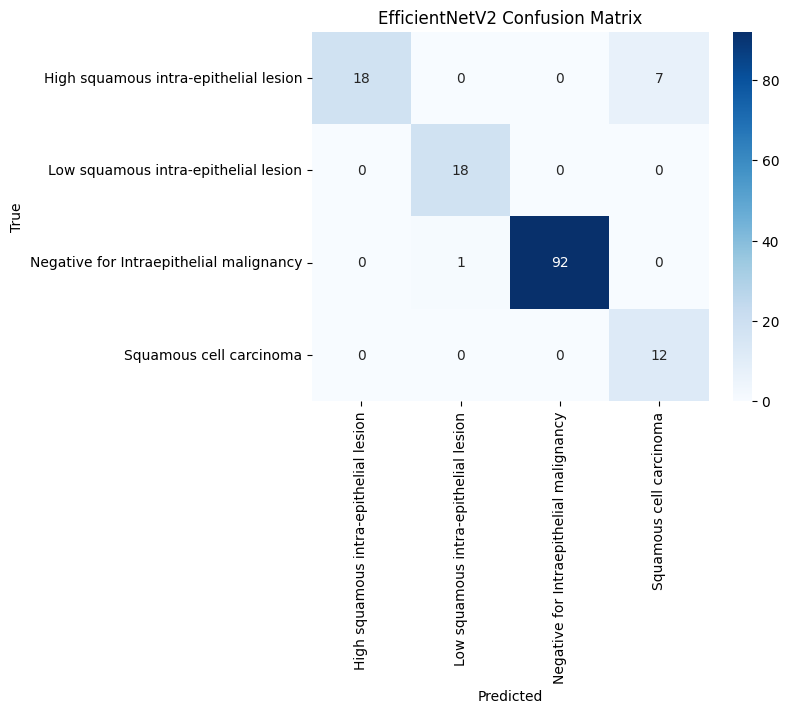

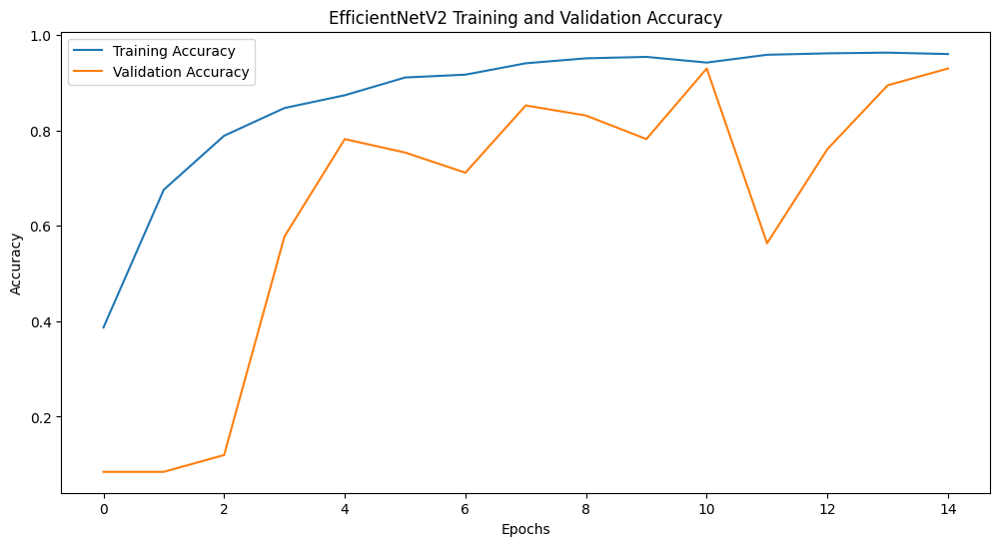

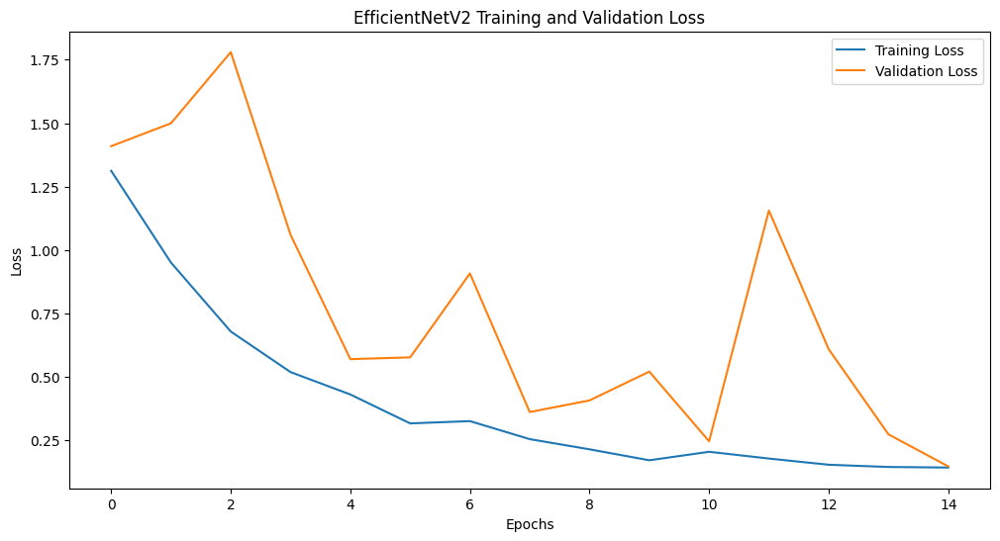

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Training ResNet...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 27s/step - accuracy: 0.5728 - loss: 1.2498 
Epoch 1: val_loss improved from inf to 1.11678, saving model to ./saved_models/ResNet_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 678s 29s/step - accuracy: 0.5804 - loss: 1.2305 - val_accuracy: 0.6408 - val_loss: 1.1168 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.9228 - loss: 0.3590 
Epoch 2: val_loss did not improve from 1.11678
21/21 ━━━━━━━━━━━━━━━━━━━━ 618s 28s/step - accuracy: 0.9231 - loss: 0.3562 - val_accuracy: 0.6408 - val_loss: 2.6031 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 26s/step - accuracy: 0.9611 - loss: 0.1387 
Epoch 3: val_loss did not improve from 1.11678
21/21 ━━━━━━━━━━━━━━━━━━━━ 615s 28s/step - accuracy: 0.9609 - loss: 0.1405 - val_accuracy: 0.6408 - val_loss: 3.2061 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 26

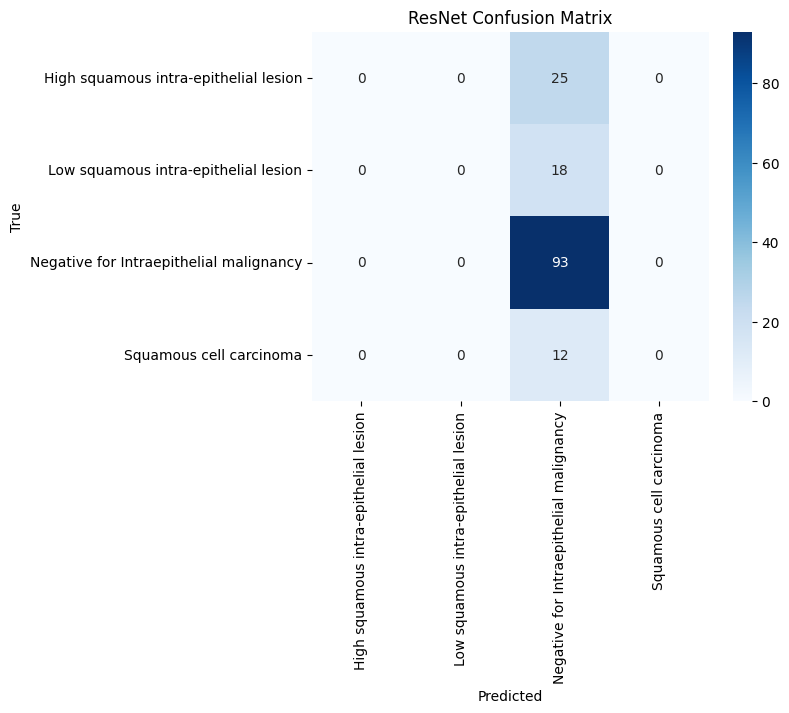

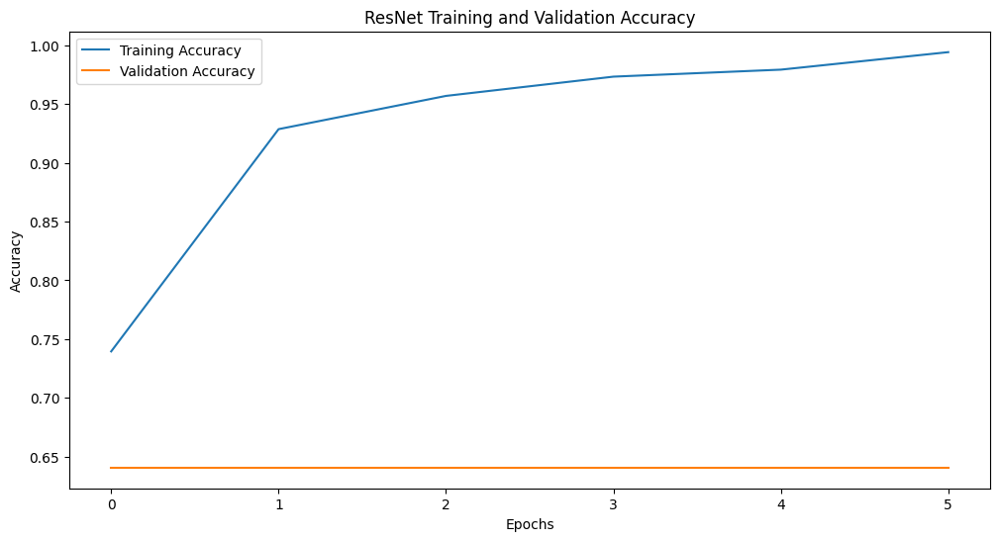

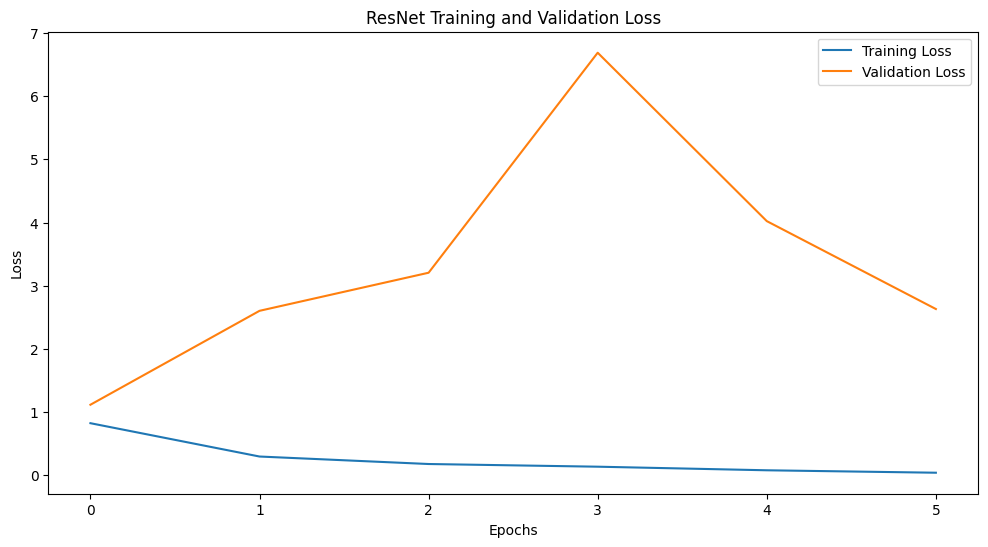

Training Vision Transformer Proxy...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.3217 - loss: 1.3954
Epoch 1: val_loss improved from inf to 1.46754, saving model to ./saved_models/Vision Transformer Proxy_best_model.keras
21/21 ━━━━━━━━━━━━━━━━━━━━ 285s 10s/step - accuracy: 0.3268 - loss: 1.3904 - val_accuracy: 0.1197 - val_loss: 1.4675 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.6881 - loss: 0.9804
Epoch 2: val_loss did not improve from 1.46754
21/21 ━━━━━━━━━━━━━━━━━━━━ 213s 9s/step - accuracy: 0.6887 - loss: 0.9784 - val_accuracy: 0.1268 - val_loss: 1.5116 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.7709 - loss: 0.7412
Epoch 3: val_loss did not improve from 1.46754
21/21 ━━━━━━━━━━━━━━━━━━━━ 261s 9s/step - accuracy: 0.7720 - loss: 0.7404 - val_accuracy: 0.1127 - val_loss: 1.7151 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.832

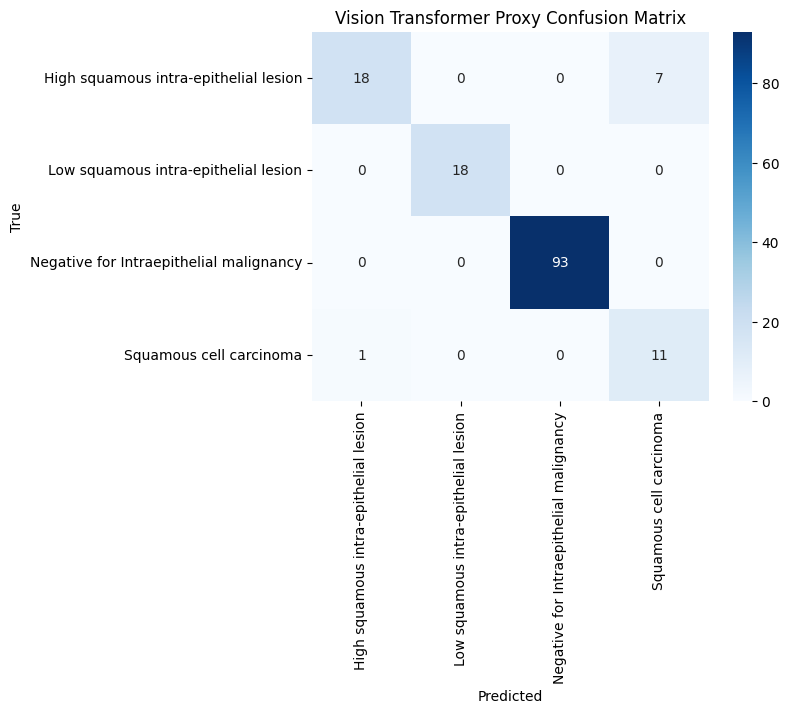

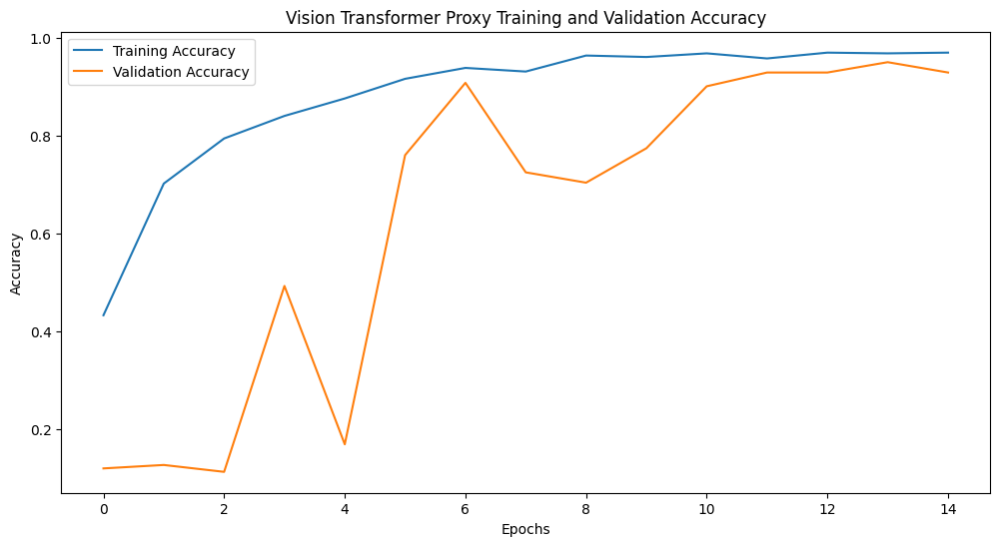

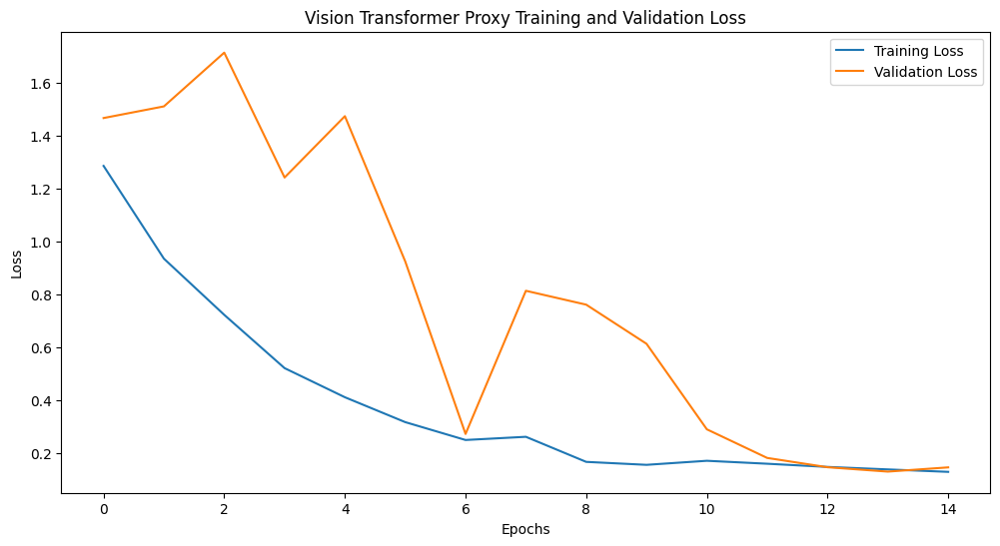

Evaluating DenseNet121...
5/5 ━━━━━━━━━━━━━━━━━━━━ 31s 5s/step - accuracy: 1.0000 - loss: 0.0316
DenseNet121 Test Accuracy: 1.00
5/5 ━━━━━━━━━━━━━━━━━━━━ 30s 5s/step
DenseNet121 Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       1.00      1.00      1.00        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      1.00      1.00        93
                Squamous cell carcinoma       1.00      1.00      1.00        12

                               accuracy                           1.00       148
                              macro avg       1.00      1.00      1.00       148
                           weighted avg       1.00      1.00      1.00       148



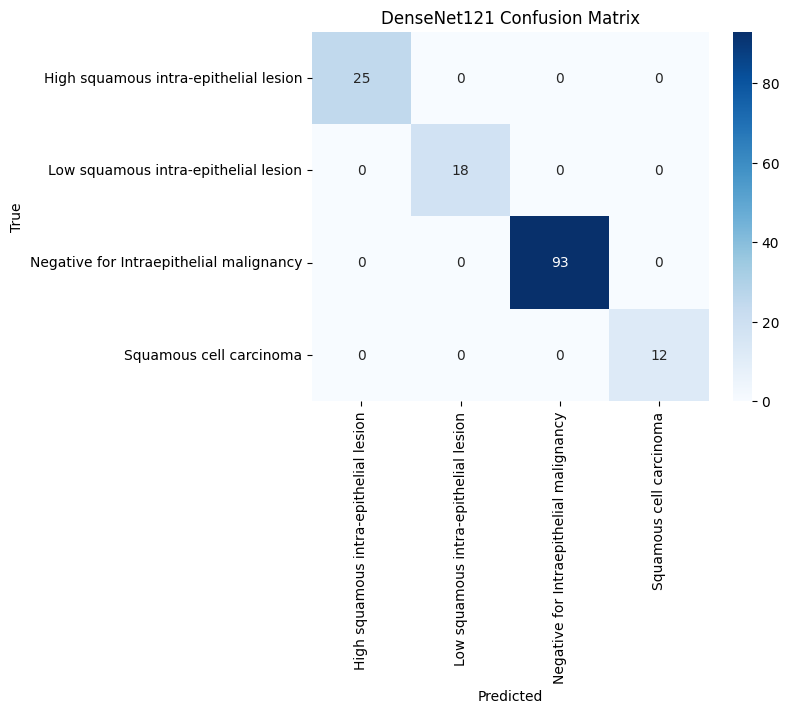

Evaluating InceptionV3...
5/5 ━━━━━━━━━━━━━━━━━━━━ 24s 4s/step - accuracy: 0.9906 - loss: 0.0154
InceptionV3 Test Accuracy: 0.98
5/5 ━━━━━━━━━━━━━━━━━━━━ 26s 4s/step
InceptionV3 Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.89      1.00      0.94        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      0.98      0.99        93
                Squamous cell carcinoma       1.00      0.92      0.96        12

                               accuracy                           0.98       148
                              macro avg       0.97      0.97      0.97       148
                           weighted avg       0.98      0.98      0.98       148



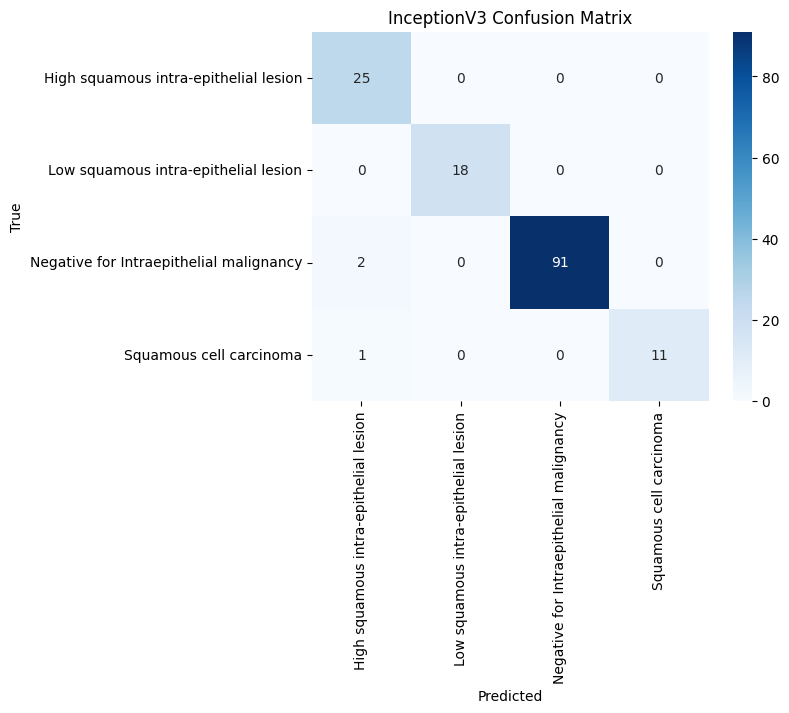

Evaluating Xception...
5/5 ━━━━━━━━━━━━━━━━━━━━ 40s 7s/step - accuracy: 1.0000 - loss: 0.0030
Xception Test Accuracy: 1.00
5/5 ━━━━━━━━━━━━━━━━━━━━ 38s 7s/step
Xception Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       1.00      1.00      1.00        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      1.00      1.00        93
                Squamous cell carcinoma       1.00      1.00      1.00        12

                               accuracy                           1.00       148
                              macro avg       1.00      1.00      1.00       148
                           weighted avg       1.00      1.00      1.00       148



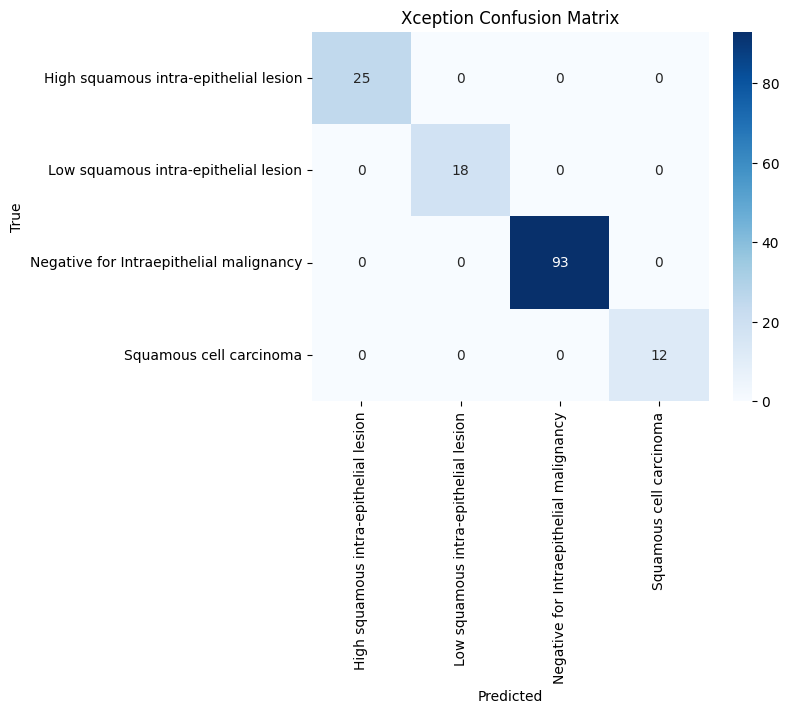

Evaluating EfficientNetV2...
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step - accuracy: 0.9060 - loss: 0.1890
EfficientNetV2 Test Accuracy: 0.95
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step
EfficientNetV2 Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       1.00      0.72      0.84        25
   Low squamous intra-epithelial lesion       0.95      1.00      0.97        18
Negative for Intraepithelial malignancy       1.00      0.99      0.99        93
                Squamous cell carcinoma       0.63      1.00      0.77        12

                               accuracy                           0.95       148
                              macro avg       0.89      0.93      0.89       148
                           weighted avg       0.96      0.95      0.95       148



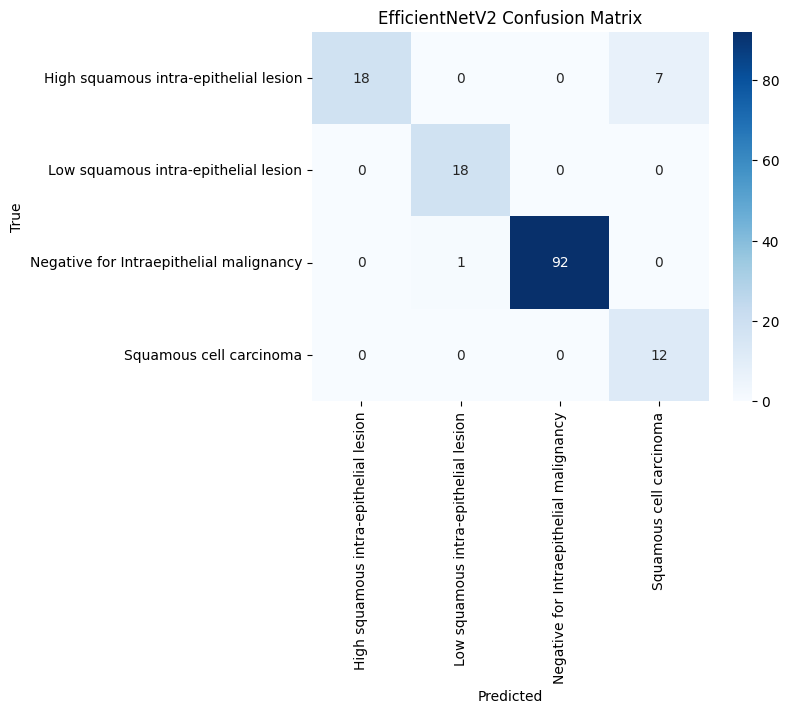

Evaluating ResNet...
5/5 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step - accuracy: 0.4668 - loss: 1.3326
ResNet Test Accuracy: 0.63
5/5 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step
ResNet Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.00      0.00      0.00        25
   Low squamous intra-epithelial lesion       0.00      0.00      0.00        18
Negative for Intraepithelial malignancy       0.63      1.00      0.77        93
                Squamous cell carcinoma       0.00      0.00      0.00        12

                               accuracy                           0.63       148
                              macro avg       0.16      0.25      0.19       148
                           weighted avg       0.39      0.63      0.48       148



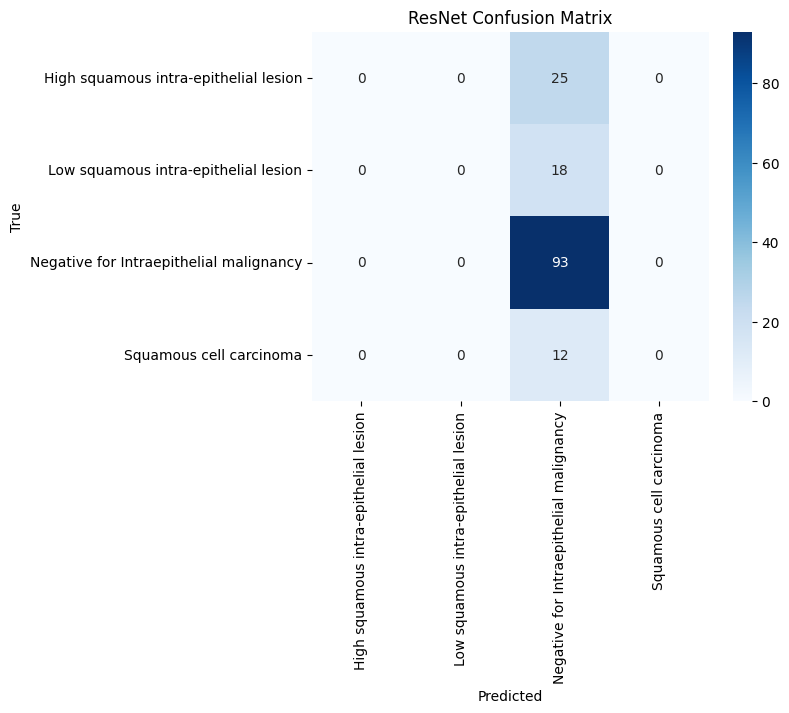

Evaluating Vision Transformer Proxy...
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 2s/step - accuracy: 0.9060 - loss: 0.1847
Vision Transformer Proxy Test Accuracy: 0.95
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step
Vision Transformer Proxy Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.95      0.72      0.82        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      1.00      1.00        93
                Squamous cell carcinoma       0.61      0.92      0.73        12

                               accuracy                           0.95       148
                              macro avg       0.89      0.91      0.89       148
                           weighted avg       0.96      0.95      0.95       148



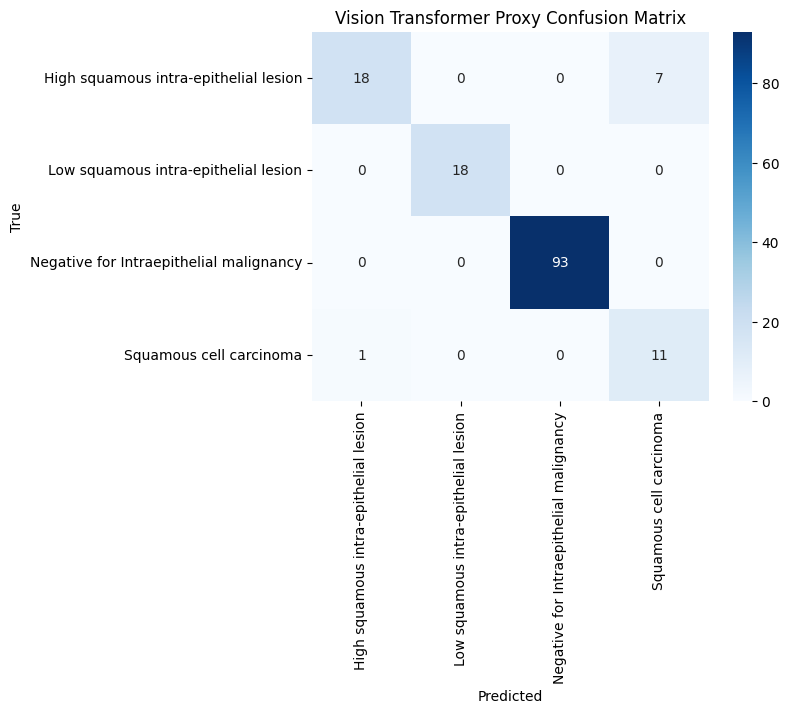

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121, InceptionV3, Xception, EfficientNetV2B0, ResNet50
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Directories
train_dir = './train'
val_dir = './val'
test_dir = './test'

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 15

# Directory to save models
model_save_dir = './saved_models'

# Ensure the directory exists
if not os.path.exists(model_save_dir):
    os.makedirs(model_save_dir)

# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Compute Class Weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

# Function to Build and Compile a Model
def build_and_train_model(base_model, model_name):
    base_model.trainable = True

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(len(train_generator.class_indices), activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Training {model_name}...")

    # Filepath for model checkpoints
    checkpoint_path = os.path.join(model_save_dir, f"{model_name}_best_model.keras")

    # Callbacks
    callbacks = [
        tf.keras.callbacks.ModelCheckpoint(
            filepath=checkpoint_path,
            monitor='val_loss',
            save_best_only=True,
            verbose=1
        ),
        tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6),
        tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
    ]

    # Training
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=EPOCHS,
        class_weight=class_weights,
        callbacks=callbacks
    )

    # Save the final model explicitly
    final_model_path = os.path.join(model_save_dir, f"{model_name}_final_model.keras")
    model.save(final_model_path)
    print(f"Final {model_name} model saved to {final_model_path}")

    evaluate_model(model, test_generator, model_name)
    plot_history(history, model_name)
    return model

# Evaluate Model
def evaluate_model(model, test_generator, model_name):
    print(f"Evaluating {model_name}...")
    loss, accuracy = model.evaluate(test_generator)
    print(f"{model_name} Test Accuracy: {accuracy:.2f}")

    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes

    print(f"{model_name} Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=test_generator.class_indices.keys(),
                yticklabels=test_generator.class_indices.keys())
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Plot History
def plot_history(history, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# Grad-CAM for Explainability
def generate_gradcam(model, img_array, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]
    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(tf.multiply(pooled_grads, conv_outputs), axis=-1)
    heatmap = np.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def plot_gradcam(img, heatmap):
    plt.imshow(img)
    plt.imshow(heatmap, cmap='jet', alpha=0.4)  # Overlay heatmap
    plt.colorbar()
    plt.show()

# Attention Rollout for Vision Transformers
def attention_rollout(attention_matrices, discard_ratio=0.9):
    result = np.eye(attention_matrices[0].shape[1])
    for attention in attention_matrices:
        attention_heads_fused = attention.mean(axis=0)
        attention_heads_fused = attention_heads_fused / attention_heads_fused.sum(axis=-1, keepdims=True)
        result = result + np.matmul(result, attention_heads_fused)
    return result

def visualize_attention_rollout(model, img_array, layer_name="top_conv"):
    intermediate_layer_model = tf.keras.models.Model(inputs=model.input,
                                                      outputs=model.get_layer(layer_name).output)
    attention = intermediate_layer_model.predict(img_array)
    attention_rollout_result = attention_rollout(attention)
    return attention_rollout_result

# Models
base_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
densenet_model = build_and_train_model(base_densenet, "DenseNet121")

base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
inception_model = build_and_train_model(base_inception, "InceptionV3")

base_xception = Xception(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
xception_model = build_and_train_model(base_xception, "Xception")

base_efficientnet = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
efficientnet_model = build_and_train_model(base_efficientnet, "EfficientNetV2")

base_resnet = ResNet50(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
resnet_model = build_and_train_model(base_resnet, "ResNet")

# Vision Transformer Proxy
base_vit_proxy = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
vit_proxy_model = build_and_train_model(base_vit_proxy, "Vision Transformer Proxy")

# Evaluate Models
evaluate_model(densenet_model, test_generator, "DenseNet121")
evaluate_model(inception_model, test_generator, "InceptionV3")
evaluate_model(xception_model, test_generator, "Xception")
evaluate_model(efficientnet_model, test_generator, "EfficientNetV2")
evaluate_model(resnet_model, test_generator, "ResNet")
evaluate_model(vit_proxy_model, test_generator, "Vision Transformer Proxy")


Evaluating DenseNet121...
5/5 ━━━━━━━━━━━━━━━━━━━━ 30s 6s/step
Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1-Score: 1.0000
Evaluating InceptionV3...
5/5 ━━━━━━━━━━━━━━━━━━━━ 23s 4s/step
Accuracy: 0.9797, Precision: 0.9732, Recall: 0.9738, F1-Score: 0.9723
Evaluating Xception...
5/5 ━━━━━━━━━━━━━━━━━━━━ 40s 7s/step
Accuracy: 1.0000, Precision: 1.0000, Recall: 1.0000, F1-Score: 1.0000
Evaluating EfficientNetV2...
5/5 ━━━━━━━━━━━━━━━━━━━━ 15s 3s/step
Accuracy: 0.9459, Precision: 0.8947, Recall: 0.9273, F1-Score: 0.8947
Evaluating ResNet...
5/5 ━━━━━━━━━━━━━━━━━━━━ 32s 6s/step
Accuracy: 0.6284, Precision: 0.1571, Recall: 0.2500, F1-Score: 0.1929
Evaluating Vision Transformer Proxy...
5/5 ━━━━━━━━━━━━━━━━━━━━ 19s 4s/step
Accuracy: 0.9459, Precision: 0.8896, Recall: 0.9092, F1-Score: 0.8879
Model Metrics Comparison:
                      Model  Accuracy  Precision    Recall  F1-Score
0               DenseNet121  1.000000   1.000000  1.000000  1.000000
1               InceptionV3  0

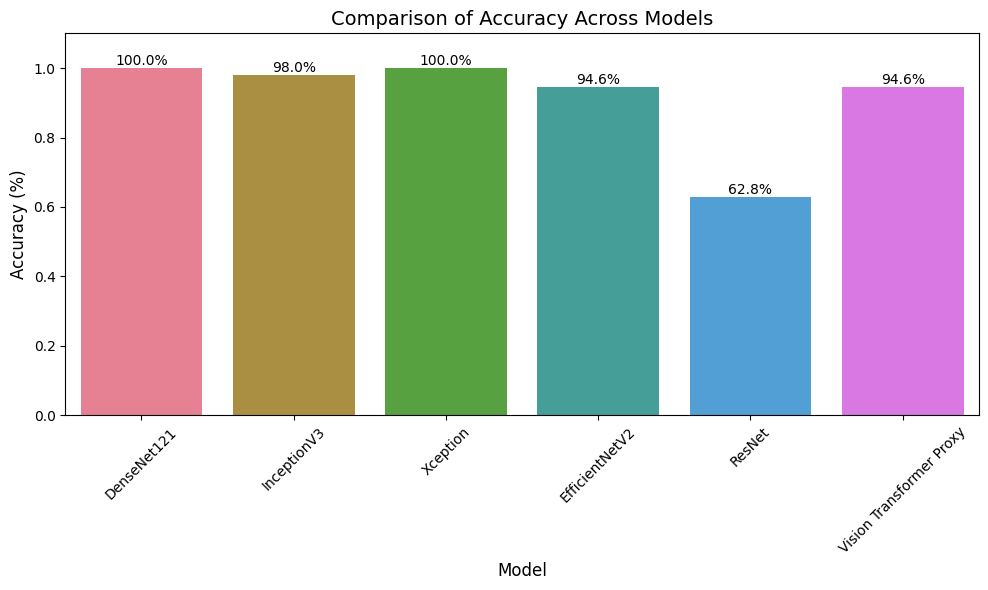

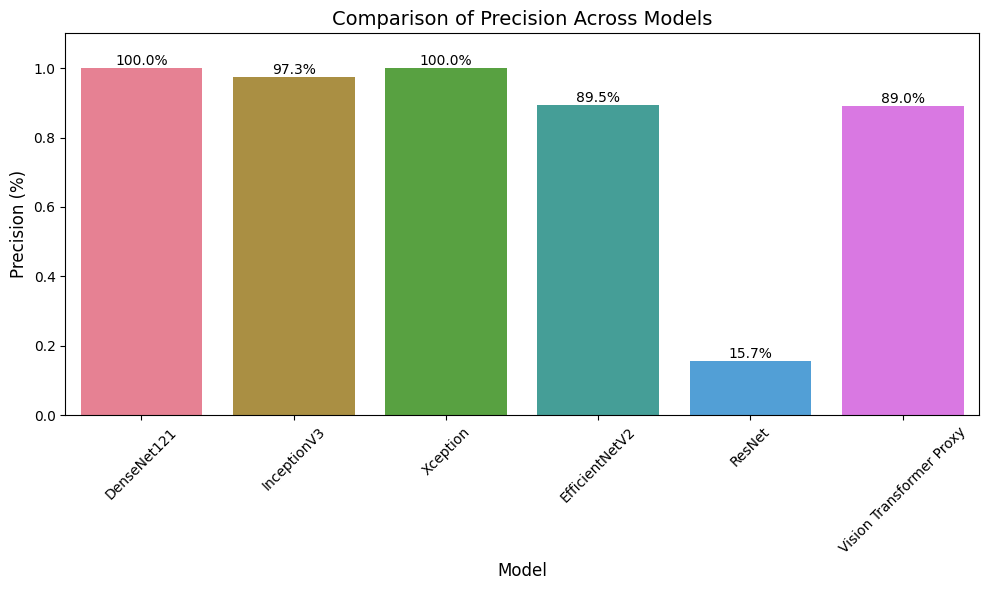

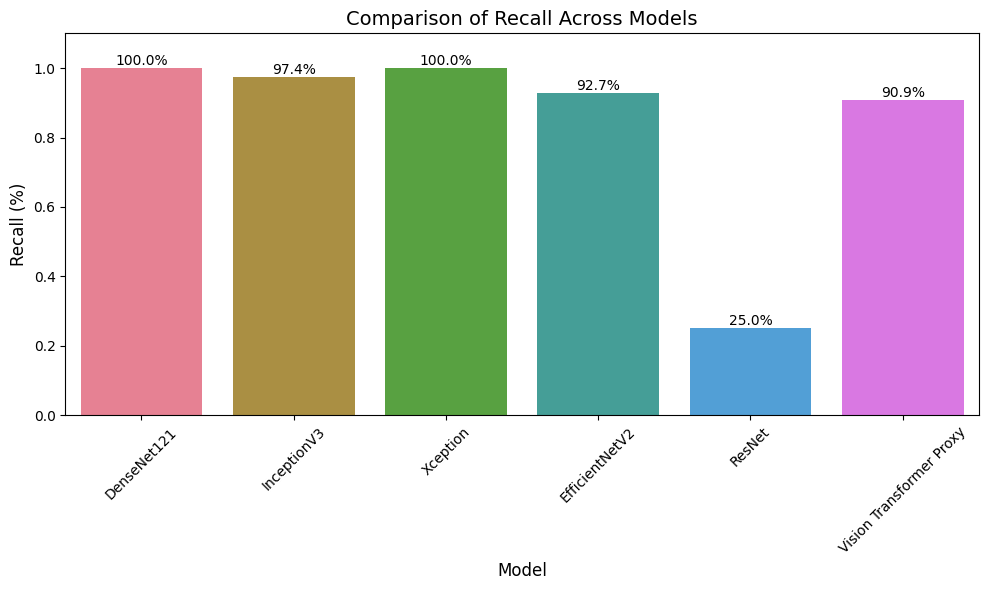

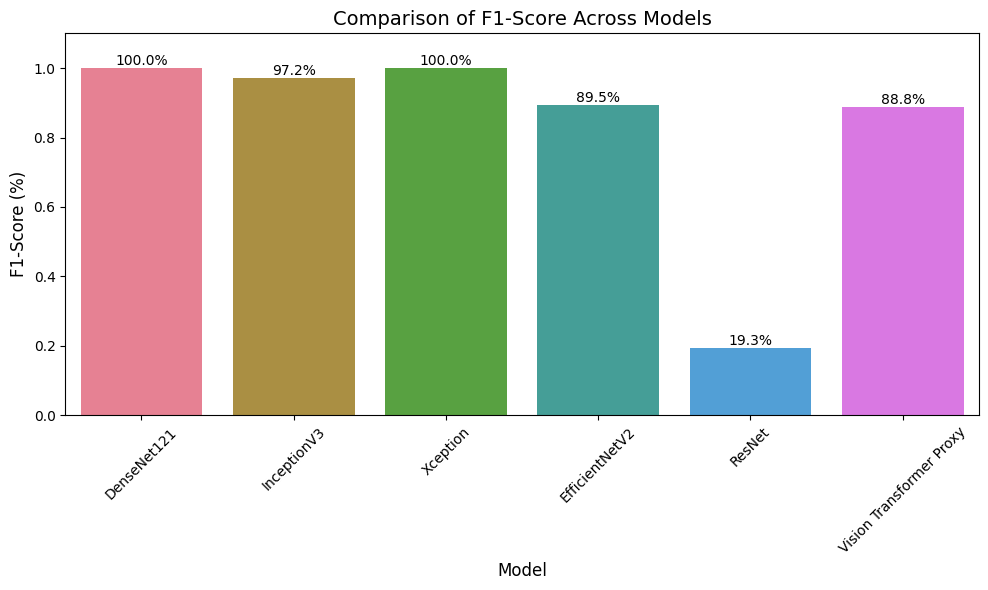

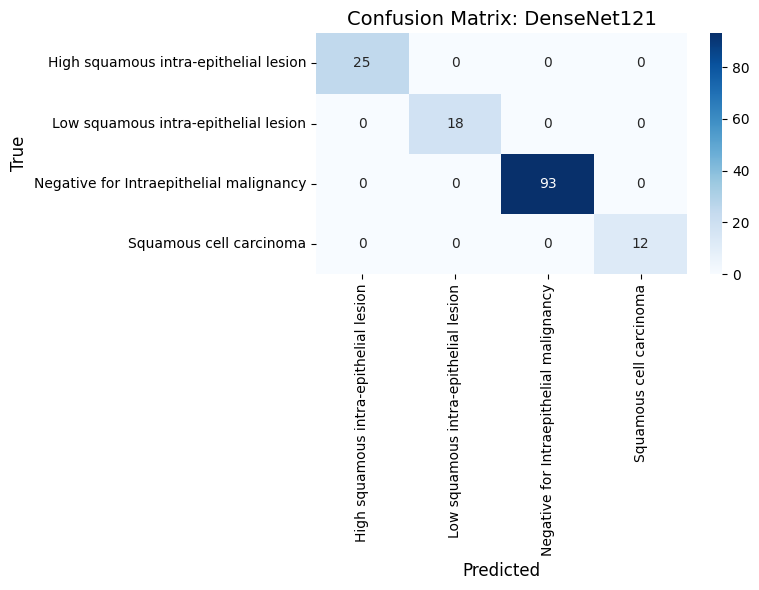

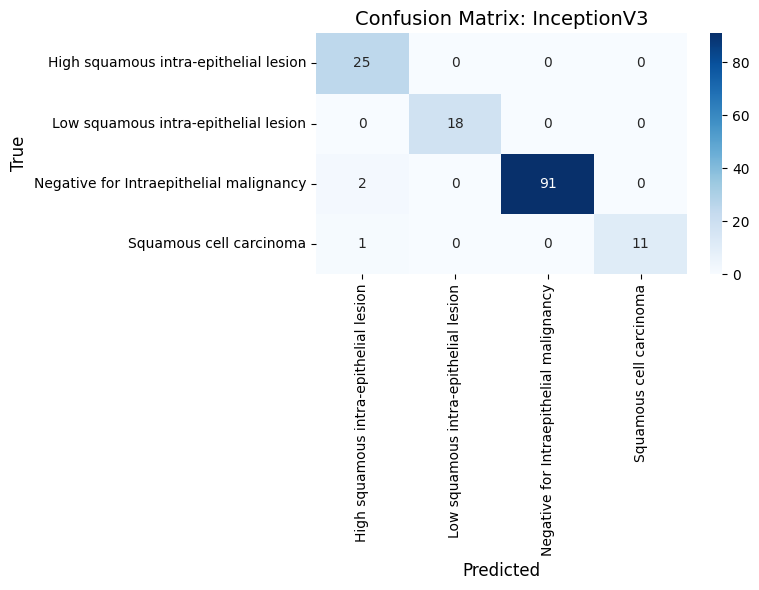

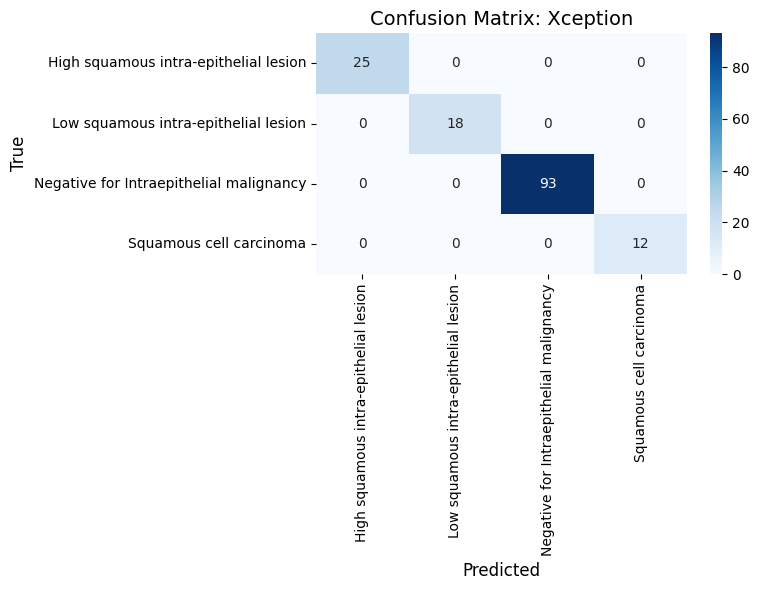

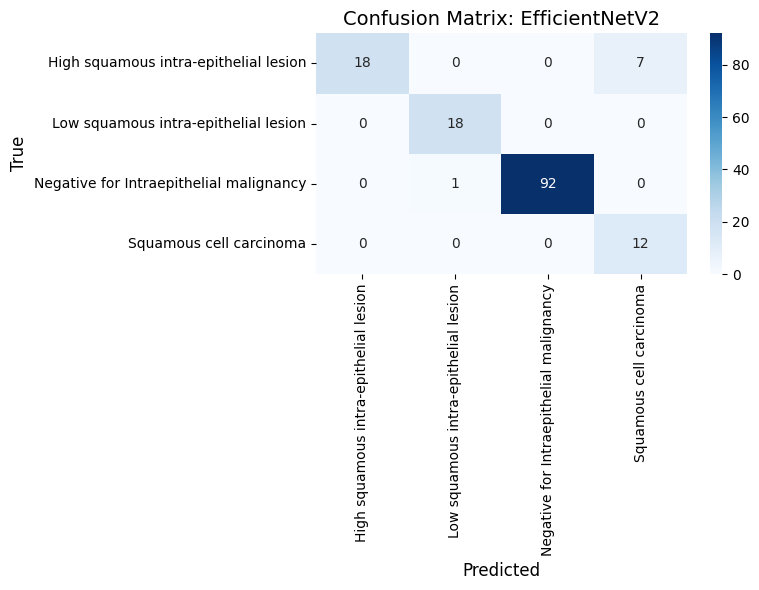

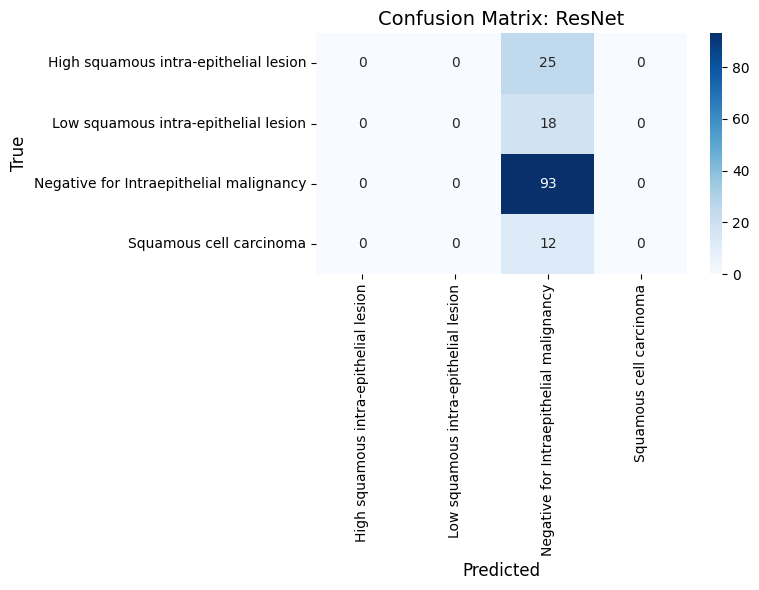

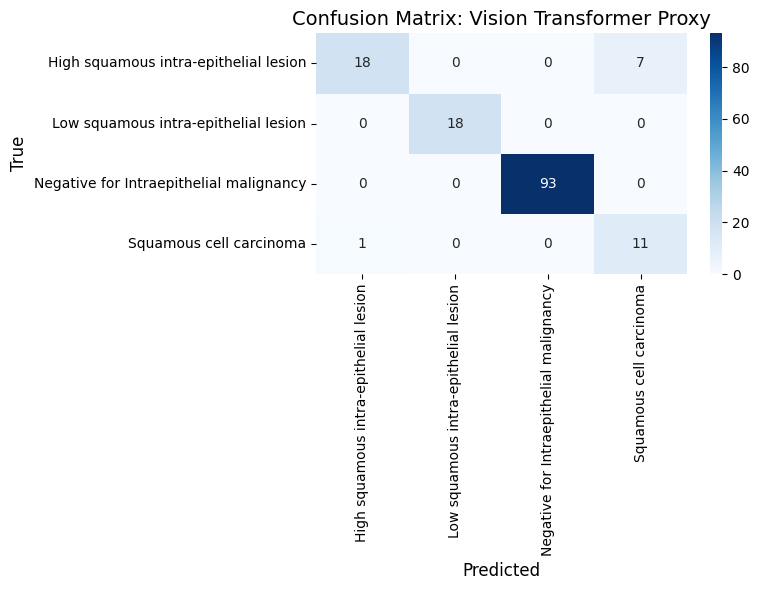

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Initialize metrics dictionary without confusion matrix for DataFrame creation
metrics_dict = {
    "Model": [],
    "Accuracy": [],
    "Precision": [],
    "Recall": [],
    "F1-Score": []
}

confusion_matrices = {}  # Store confusion matrices separately

# Function to evaluate and collect metrics for a model
def evaluate_and_collect_metrics(model, model_name, test_generator, metrics_dict, confusion_matrices):
    print(f"Evaluating {model_name}...")
    loss, accuracy = model.evaluate(test_generator, verbose=0)
    metrics_dict["Model"].append(model_name)
    metrics_dict["Accuracy"].append(accuracy)

    # Predictions and true labels
    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes

    # Classification Report
    report = classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys(), output_dict=True)

    # Add precision, recall, and F1-score (macro avg)
    metrics_dict["Precision"].append(report['macro avg']['precision'])
    metrics_dict["Recall"].append(report['macro avg']['recall'])
    metrics_dict["F1-Score"].append(report['macro avg']['f1-score'])

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    confusion_matrices[model_name] = conf_matrix

    print(f"Accuracy: {accuracy:.4f}, Precision: {report['macro avg']['precision']:.4f}, Recall: {report['macro avg']['recall']:.4f}, F1-Score: {report['macro avg']['f1-score']:.4f}")

# Evaluate all models and collect metrics
evaluate_and_collect_metrics(densenet_model, "DenseNet121", test_generator, metrics_dict, confusion_matrices)
evaluate_and_collect_metrics(inception_model, "InceptionV3", test_generator, metrics_dict, confusion_matrices)
evaluate_and_collect_metrics(xception_model, "Xception", test_generator, metrics_dict, confusion_matrices)
evaluate_and_collect_metrics(efficientnet_model, "EfficientNetV2", test_generator, metrics_dict, confusion_matrices)
evaluate_and_collect_metrics(resnet_model, "ResNet", test_generator, metrics_dict, confusion_matrices)
evaluate_and_collect_metrics(vit_proxy_model, "Vision Transformer Proxy", test_generator, metrics_dict, confusion_matrices)

# Create a DataFrame for metrics
metrics_df = pd.DataFrame(metrics_dict)

# Display the metrics DataFrame
print("Model Metrics Comparison:")
print(metrics_df)

# Optionally save the DataFrame to a CSV file
metrics_df.to_csv("model_metrics_comparison.csv", index=False)
print("Metrics saved to 'model_metrics_comparison.csv'.")

# Plot metrics comparison
def plot_metrics_comparison(metrics_df):
    """
    Plot bar plots comparing metrics across models with multicolored bars and percentages.
    """
    metrics_to_plot = ["Accuracy", "Precision", "Recall", "F1-Score"]

    for metric in metrics_to_plot:
        plt.figure(figsize=(10, 6))

        # Use a consistent color palette for different models
        colors = sns.color_palette("husl", len(metrics_df["Model"]))

        # Create the bar plot
        bar_plot = sns.barplot(data=metrics_df, x="Model", y=metric, palette=colors, ci=None)

        # Add percentage labels above the bars
        for bar in bar_plot.patches:
            bar_height = bar.get_height()
            bar_plot.annotate(
                f"{bar_height * 100:.1f}%",  # Format as a percentage
                (bar.get_x() + bar.get_width() / 2, bar_height),
                ha="center", va="bottom", fontsize=10, color="black"
            )

        # Customize plot aesthetics
        plt.title(f"Comparison of {metric} Across Models", fontsize=14)
        plt.ylabel(f"{metric} (%)", fontsize=12)
        plt.xlabel("Model", fontsize=12)
        plt.xticks(rotation=45, fontsize=10)
        plt.ylim(0, 1.1)  # Adjust y-axis to leave room for annotations
        plt.tight_layout()
        plt.show()

plot_metrics_comparison(metrics_df)

# Confusion Matrix Visualization
def plot_confusion_matrices(conf_matrices, class_labels):
    """
    Plot heatmaps for confusion matrices of different models.
    """
    for model_name, conf_matrix in conf_matrices.items():
        plt.figure(figsize=(8, 6))
        sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_labels, yticklabels=class_labels)
        plt.title(f"Confusion Matrix: {model_name}", fontsize=14)
        plt.xlabel("Predicted", fontsize=12)
        plt.ylabel("True", fontsize=12)
        plt.tight_layout()
        plt.show()

plot_confusion_matrices(confusion_matrices, list(test_generator.class_indices.keys()))


In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

def preprocess_image(image_path, target_size):
    """
    Preprocess the image to make it compatible with the model input.

    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image (e.g., (224, 224)).

    Returns:
        np.array: Preprocessed image ready for prediction.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def make_predictions(models, model_names, image_path, class_labels, target_size=(224, 224)):
    """
    Make predictions using multiple models on a single test image.

    Args:
        models (list): List of trained models.
        model_names (list): List of corresponding model names.
        image_path (str): Path to the test image.
        class_labels (list): List of class labels.
        target_size (tuple): Target size for resizing the image.

    Returns:
        None: Prints predictions for each model.
    """
    # Preprocess the image
    image = preprocess_image(image_path, target_size)

    for model, model_name in zip(models, model_names):
        print(f"Making prediction with {model_name}...")

        # Predict the class probabilities
        predictions = model.predict(image)

        # Get the predicted class index and confidence score
        predicted_index = np.argmax(predictions, axis=1)[0]
        confidence_score = predictions[0][predicted_index]

        # Get the predicted class label
        predicted_label = class_labels[predicted_index]

        # Print results
        print(f"Model: {model_name}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence Score: {confidence_score:.2f}")
        print("-" * 40)

# Define models and their names
models = [densenet_model, inception_model, xception_model, efficientnet_model, resnet_model, vit_proxy_model]
model_names = ["DenseNet121", "InceptionV3", "Xception", "EfficientNetV2", "ResNet", "Vision Transformer Proxy"]

# Define class labels (based on test_generator.class_indices)
class_labels = list(test_generator.class_indices.keys())

# Path to the test image
test_image_path = "/content/Cervical_Cancer_dataset_temp/High squamous intra-epithelial lesion/HSIL_1 (1).jpg"  # Replace with the path to your test image

# Make predictions
make_predictions(models, model_names, test_image_path, class_labels, target_size=(224, 224))


Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Model: DenseNet121
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Model: InceptionV3
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Model: Xception
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with EfficientNetV2...
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
Model: EfficientNetV2
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 0.69
----------------------------------------
Making prediction with ResNet...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Model: ResNet
Predicted Class: Negative for Intraepithelial malignancy
Confidence S

Displaying the test image:


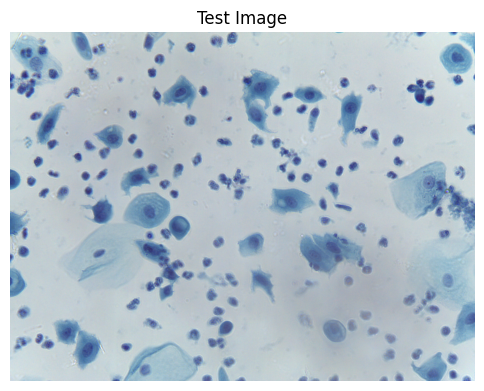

Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step
Model: DenseNet121
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 0.89
----------------------------------------
Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 279ms/step
Model: InceptionV3
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step
Model: Xception
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with EfficientNetV2...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 258ms/step
Model: EfficientNetV2
Predicted Class: High squamous intra-epithelial lesion
Confidence Score: 0.78
----------------------------------------
Making prediction with ResNet...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step
Model: ResNet
Predicted Class: Negative for Intraepithelial malignan

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import numpy as np

def preprocess_image(image_path, target_size):
    """
    Preprocess the image to make it compatible with the model input.

    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image (e.g., (224, 224)).

    Returns:
        np.array: Preprocessed image ready for prediction.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def display_test_image(image_path):
    """
    Display the test image.

    Args:
        image_path (str): Path to the test image.

    Returns:
        None: Displays the test image.
    """
    plt.figure(figsize=(6, 6))
    img = load_img(image_path)  # Load the original image
    plt.imshow(img)
    plt.axis('off')
    plt.title("Test Image")
    plt.show()

def make_predictions(models, model_names, image_path, class_labels, target_size=(224, 224)):
    """
    Make predictions using multiple models on a single test image.

    Args:
        models (list): List of trained models.
        model_names (list): List of corresponding model names.
        image_path (str): Path to the test image.
        class_labels (list): List of class labels.
        target_size (tuple): Target size for resizing the image.

    Returns:
        None: Prints predictions for each model.
    """
    # Display the test image
    print("Displaying the test image:")
    display_test_image(image_path)

    # Preprocess the image
    image = preprocess_image(image_path, target_size)

    for model, model_name in zip(models, model_names):
        print(f"Making prediction with {model_name}...")

        # Predict the class probabilities
        predictions = model.predict(image)

        # Get the predicted class index and confidence score
        predicted_index = np.argmax(predictions, axis=1)[0]
        confidence_score = predictions[0][predicted_index]

        # Get the predicted class label
        predicted_label = class_labels[predicted_index]

        # Print results
        print(f"Model: {model_name}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence Score: {confidence_score:.2f}")
        print("-" * 40)

# Define models and their names
models = [densenet_model, inception_model, xception_model, efficientnet_model, resnet_model, vit_proxy_model]
model_names = ["DenseNet121", "InceptionV3", "Xception", "EfficientNetV2", "ResNet", "Vision Transformer Proxy"]

# Define class labels (based on test_generator.class_indices)
class_labels = list(test_generator.class_indices.keys())

# Path to the test image
test_image_path = "/content/Cervical_Cancer_dataset_temp/High squamous intra-epithelial lesion/HSIL_1 (10).jpg"  # Replace with the path to your test image

# Make predictions
make_predictions(models, model_names, test_image_path, class_labels, target_size=(224, 224))


Low squamous intra-epithelial lesion prediction


Displaying the test image:


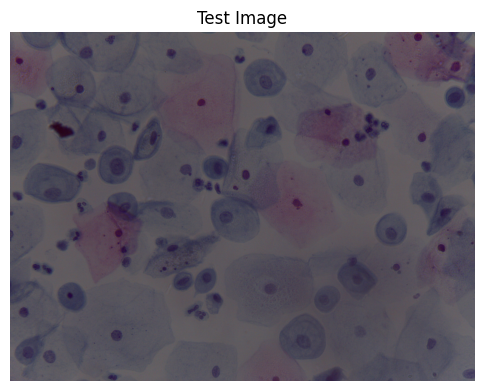

Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step
Model: DenseNet121
Predicted Class: Low squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step
Model: InceptionV3
Predicted Class: Low squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 212ms/step
Model: Xception
Predicted Class: Low squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with EfficientNetV2...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
Model: EfficientNetV2
Predicted Class: Low squamous intra-epithelial lesion
Confidence Score: 1.00
----------------------------------------
Making prediction with ResNet...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 196ms/step
Model: ResNet
Predicted Class: Negative for Intraepithelial malignancy
Co

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import numpy as np

def preprocess_image(image_path, target_size):
    """
    Preprocess the image to make it compatible with the model input.

    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image (e.g., (224, 224)).

    Returns:
        np.array: Preprocessed image ready for prediction.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def display_test_image(image_path):
    """
    Display the test image.

    Args:
        image_path (str): Path to the test image.

    Returns:
        None: Displays the test image.
    """
    plt.figure(figsize=(6, 6))
    img = load_img(image_path)  # Load the original image
    plt.imshow(img)
    plt.axis('off')
    plt.title("Test Image")
    plt.show()

def make_predictions(models, model_names, image_path, class_labels, target_size=(224, 224)):
    """
    Make predictions using multiple models on a single test image.

    Args:
        models (list): List of trained models.
        model_names (list): List of corresponding model names.
        image_path (str): Path to the test image.
        class_labels (list): List of class labels.
        target_size (tuple): Target size for resizing the image.

    Returns:
        None: Prints predictions for each model.
    """
    # Display the test image
    print("Displaying the test image:")
    display_test_image(image_path)

    # Preprocess the image
    image = preprocess_image(image_path, target_size)

    for model, model_name in zip(models, model_names):
        print(f"Making prediction with {model_name}...")

        # Predict the class probabilities
        predictions = model.predict(image)

        # Get the predicted class index and confidence score
        predicted_index = np.argmax(predictions, axis=1)[0]
        confidence_score = predictions[0][predicted_index]

        # Get the predicted class label
        predicted_label = class_labels[predicted_index]

        # Print results
        print(f"Model: {model_name}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence Score: {confidence_score:.2f}")
        print("-" * 40)

# Define models and their names
models = [densenet_model, inception_model, xception_model, efficientnet_model, resnet_model, vit_proxy_model]
model_names = ["DenseNet121", "InceptionV3", "Xception", "EfficientNetV2", "ResNet", "Vision Transformer Proxy"]

# Define class labels (based on test_generator.class_indices)
class_labels = list(test_generator.class_indices.keys())

# Path to the test image
test_image_path = "/content/Cervical_Cancer_dataset_temp/Low squamous intra-epithelial lesion/LSIL_1 (13).jpg"  # Replace with the path to your test image

# Make predictions
make_predictions(models, model_names, test_image_path, class_labels, target_size=(224, 224))


Displaying the test image:


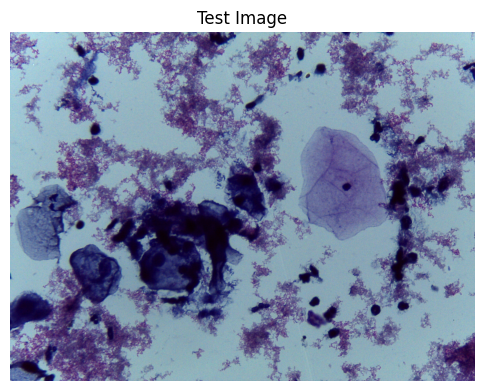

Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 319ms/step
Model: DenseNet121
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 1.00
----------------------------------------
Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
Model: InceptionV3
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 1.00
----------------------------------------
Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
Model: Xception
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 1.00
----------------------------------------
Making prediction with EfficientNetV2...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step
Model: EfficientNetV2
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 0.99
----------------------------------------
Making prediction with ResNet...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
Model: ResNet
Predicted Class: Negative for Intraepithelial 

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import numpy as np

def preprocess_image(image_path, target_size):
    """
    Preprocess the image to make it compatible with the model input.

    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image (e.g., (224, 224)).

    Returns:
        np.array: Preprocessed image ready for prediction.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def display_test_image(image_path):
    """
    Display the test image.

    Args:
        image_path (str): Path to the test image.

    Returns:
        None: Displays the test image.
    """
    plt.figure(figsize=(6, 6))
    img = load_img(image_path)  # Load the original image
    plt.imshow(img)
    plt.axis('off')
    plt.title("Test Image")
    plt.show()

def make_predictions(models, model_names, image_path, class_labels, target_size=(224, 224)):
    """
    Make predictions using multiple models on a single test image.

    Args:
        models (list): List of trained models.
        model_names (list): List of corresponding model names.
        image_path (str): Path to the test image.
        class_labels (list): List of class labels.
        target_size (tuple): Target size for resizing the image.

    Returns:
        None: Prints predictions for each model.
    """
    # Display the test image
    print("Displaying the test image:")
    display_test_image(image_path)

    # Preprocess the image
    image = preprocess_image(image_path, target_size)

    for model, model_name in zip(models, model_names):
        print(f"Making prediction with {model_name}...")

        # Predict the class probabilities
        predictions = model.predict(image)

        # Get the predicted class index and confidence score
        predicted_index = np.argmax(predictions, axis=1)[0]
        confidence_score = predictions[0][predicted_index]

        # Get the predicted class label
        predicted_label = class_labels[predicted_index]

        # Print results
        print(f"Model: {model_name}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence Score: {confidence_score:.2f}")
        print("-" * 40)

# Define models and their names
models = [densenet_model, inception_model, xception_model, efficientnet_model, resnet_model, vit_proxy_model]
model_names = ["DenseNet121", "InceptionV3", "Xception", "EfficientNetV2", "ResNet", "Vision Transformer Proxy"]

# Define class labels (based on test_generator.class_indices)
class_labels = list(test_generator.class_indices.keys())

# Path to the test image
test_image_path = "/content/Cervical_Cancer_dataset_temp/Negative for Intraepithelial malignancy/NL_10_ (12).jpg"  # Replace with the path to your test image

# Make predictions
make_predictions(models, model_names, test_image_path, class_labels, target_size=(224, 224))


Displaying the test image:


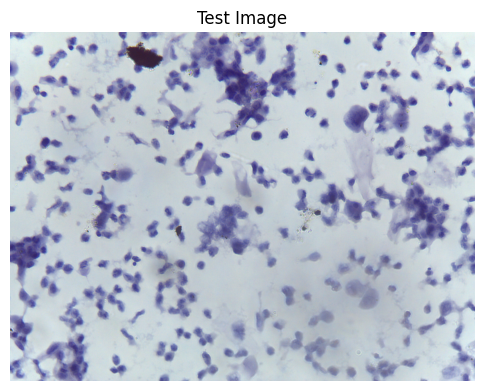

Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 449ms/step
Model: DenseNet121
Predicted Class: Squamous cell carcinoma
Confidence Score: 0.93
----------------------------------------
Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
Model: InceptionV3
Predicted Class: Squamous cell carcinoma
Confidence Score: 0.99
----------------------------------------
Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 423ms/step
Model: Xception
Predicted Class: Squamous cell carcinoma
Confidence Score: 0.99
----------------------------------------
Making prediction with EfficientNetV2...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 231ms/step
Model: EfficientNetV2
Predicted Class: Squamous cell carcinoma
Confidence Score: 0.84
----------------------------------------
Making prediction with ResNet...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
Model: ResNet
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 0.54
------------------------------

In [ ]:
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import matplotlib.pyplot as plt
import numpy as np

def preprocess_image(image_path, target_size):
    """
    Preprocess the image to make it compatible with the model input.

    Args:
        image_path (str): Path to the image file.
        target_size (tuple): Target size for resizing the image (e.g., (224, 224)).

    Returns:
        np.array: Preprocessed image ready for prediction.
    """
    image = load_img(image_path, target_size=target_size)  # Load and resize image
    image = img_to_array(image)  # Convert to array
    image = image / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def display_test_image(image_path):
    """
    Display the test image.

    Args:
        image_path (str): Path to the test image.

    Returns:
        None: Displays the test image.
    """
    plt.figure(figsize=(6, 6))
    img = load_img(image_path)  # Load the original image
    plt.imshow(img)
    plt.axis('off')
    plt.title("Test Image")
    plt.show()

def make_predictions(models, model_names, image_path, class_labels, target_size=(224, 224)):
    """
    Make predictions using multiple models on a single test image.

    Args:
        models (list): List of trained models.
        model_names (list): List of corresponding model names.
        image_path (str): Path to the test image.
        class_labels (list): List of class labels.
        target_size (tuple): Target size for resizing the image.

    Returns:
        None: Prints predictions for each model.
    """
    # Display the test image
    print("Displaying the test image:")
    display_test_image(image_path)

    # Preprocess the image
    image = preprocess_image(image_path, target_size)

    for model, model_name in zip(models, model_names):
        print(f"Making prediction with {model_name}...")

        # Predict the class probabilities
        predictions = model.predict(image)

        # Get the predicted class index and confidence score
        predicted_index = np.argmax(predictions, axis=1)[0]
        confidence_score = predictions[0][predicted_index]

        # Get the predicted class label
        predicted_label = class_labels[predicted_index]

        # Print results
        print(f"Model: {model_name}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence Score: {confidence_score:.2f}")
        print("-" * 40)

# Define models and their names
models = [densenet_model, inception_model, xception_model, efficientnet_model, resnet_model, vit_proxy_model]
model_names = ["DenseNet121", "InceptionV3", "Xception", "EfficientNetV2", "ResNet", "Vision Transformer Proxy"]

# Define class labels (based on test_generator.class_indices)
class_labels = list(test_generator.class_indices.keys())

# Path to the test image
test_image_path = "/content/Cervical_Cancer_dataset_temp/Squamous cell carcinoma/SCC_3 (2).jpg"  # Replace with the path to your test image

# Make predictions
make_predictions(models, model_names, test_image_path, class_labels, target_size=(224, 224))


**Observations**
Consensus Prediction: Most models (DenseNet121, InceptionV3, Xception, EfficientNetV2, and Vision Transformer) classified the input as "Squamous cell carcinoma" with high confidence scores, demonstrating consistency across architectures.
Outlier: ResNet predicted "Negative for Intraepithelial malignancy" with a lower confidence score of 0.54, deviating from the consensus.
Performance Variability: While most models achieved high confidence, the disparity with ResNet highlights potential sensitivity to input features or architectural limitations.


## **Explainable AI**




```



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 333ms/step
Predicted Class: Negative for Intraepithelial malignancy
Confidence: 1.00


  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 760ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 807ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 817ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 831ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 531ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 486ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 484ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 453ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 485ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

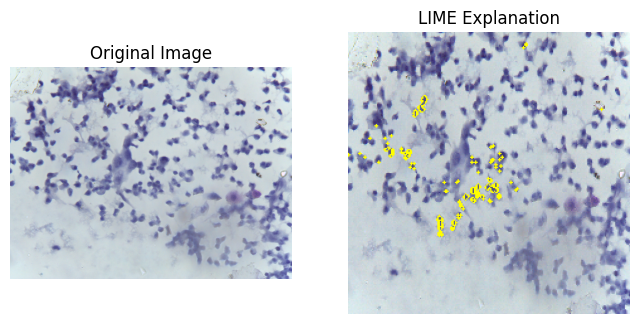

In [ ]:
# Load the trained model
model_path = "/content/saved_models/EfficientNetV2_best_model.keras"
vit_proxy_model = tf.keras.models.load_model(model_path)
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.efficientnet_v2 import preprocess_input
import numpy as np

# Function to preprocess the input image
def preprocess_image(image_path, target_size=(224, 224)):
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = preprocess_input(img_array)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return img_array

from lime import lime_image
from skimage.segmentation import mark_boundaries
import matplotlib.pyplot as plt

# Path to the test image
image_path = "/content/Cervical_Cancer_dataset_temp/Squamous cell carcinoma/SCC_3 (11).jpg"  # Replace with the path to your test image

# Preprocess the image
input_image = preprocess_image(image_path)

# Make prediction
predictions = efficientnet_model.predict(input_image)
predicted_class_index = np.argmax(predictions)
predicted_class_confidence = predictions[0][predicted_class_index]

# Map the class index to the actual class label
class_labels = ['High squamous intra-epithelial lesion',
                'Low squamous intra-epithelial lesion',
                'Negative for Intraepithelial malignancy',
                'Squamous cell carcinoma']
predicted_class_label = class_labels[predicted_class_index]

print(f"Predicted Class: {predicted_class_label}")
print(f"Confidence: {predicted_class_confidence:.2f}")

# Create a LIME explainer
explainer = lime_image.LimeImageExplainer()

# Explain the model's prediction
explanation = explainer.explain_instance(
    input_image[0],  # Input image without batch dimension
    vit_proxy_model.predict,  # Prediction function
    top_labels=1,  # Number of top labels to explain
    hide_color=0,  # Pixel value for hiding
    num_samples=1000  # Number of perturbed samples to generate
)

# Get the image explanation
temp, mask = explanation.get_image_and_mask(
    predicted_class_index,
    positive_only=True,
    num_features=5,
    hide_rest=False
)

# Visualize the explanation
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(load_img(image_path))
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title("LIME Explanation")
plt.imshow(mark_boundaries(temp / 255.0, mask))
plt.axis('off')
plt.show()


Found 672 images belonging to 4 classes.
Found 142 images belonging to 4 classes.
Found 148 images belonging to 4 classes.
29084464/29084464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training DenseNet121...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 799s 32s/step - accuracy: 0.3713 - loss: 1.4828 - val_accuracy: 0.7324 - val_loss: 0.8139 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 637s 29s/step - accuracy: 0.8500 - loss: 0.4605 - val_accuracy: 0.7817 - val_loss: 0.5449 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 688s 30s/step - accuracy: 0.9122 - loss: 0.3191 - val_accuracy: 0.8310 - val_loss: 0.4019 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 664s 29s/step - accuracy: 0.9542 - loss: 0.2156 - val_accuracy: 0.8521 - val_loss: 0.3708 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 691s 29s/step - accuracy: 0.9569 - loss: 0.1428 - val_accuracy: 0.9225 - val_loss: 0.2449 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━

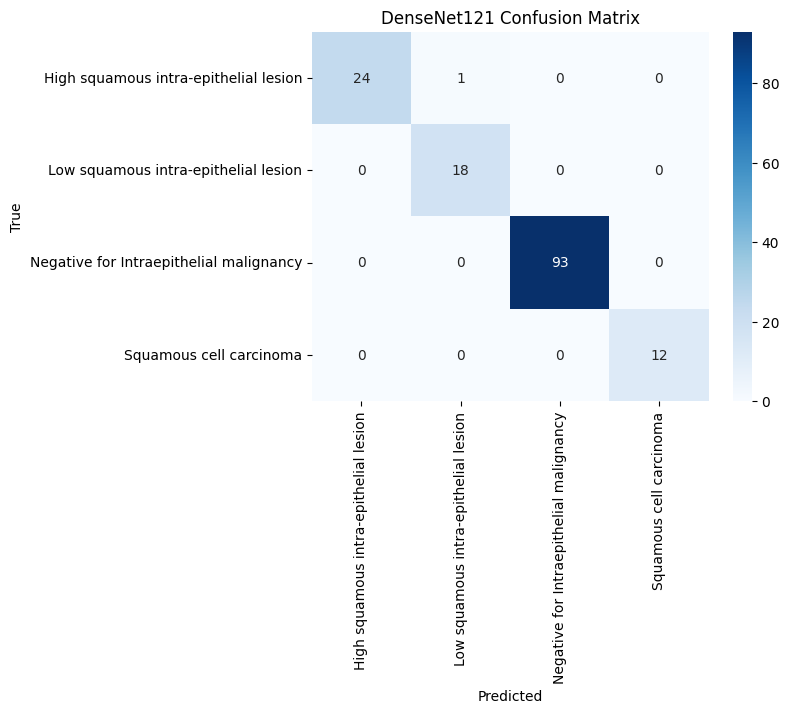

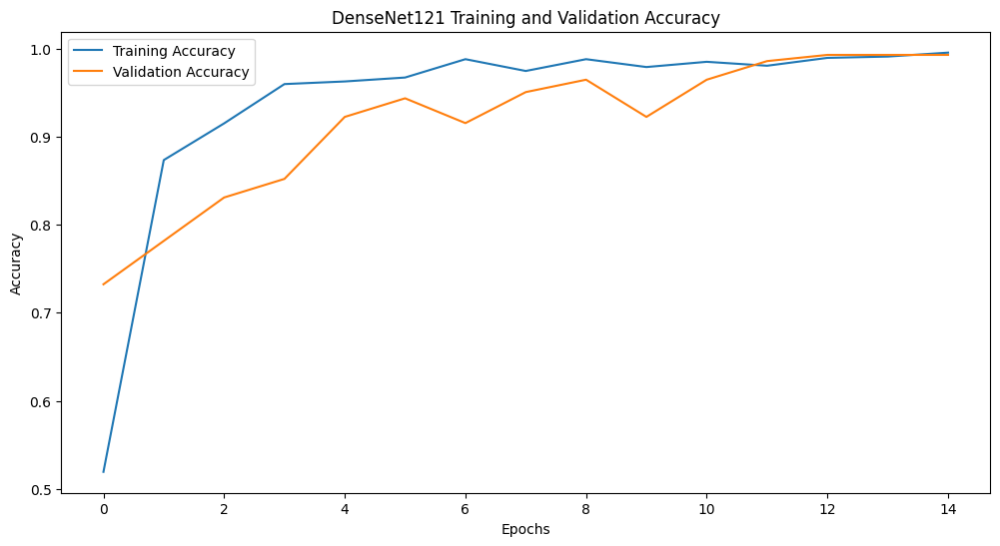

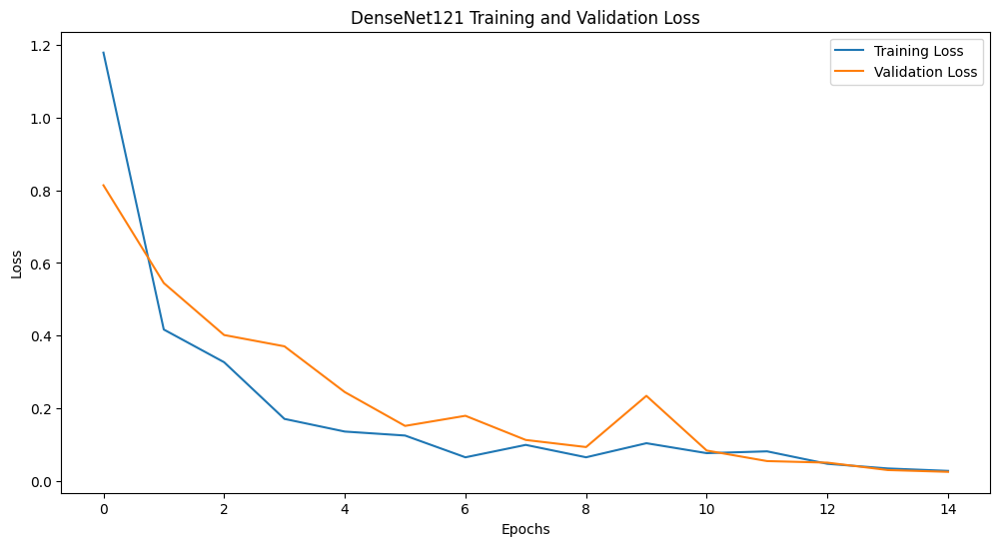

87910968/87910968 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Training InceptionV3...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 502s 20s/step - accuracy: 0.3938 - loss: 1.4498 - val_accuracy: 0.6479 - val_loss: 0.8481 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 413s 19s/step - accuracy: 0.7850 - loss: 0.6410 - val_accuracy: 0.6690 - val_loss: 1.0336 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 404s 18s/step - accuracy: 0.8790 - loss: 0.3603 - val_accuracy: 0.7465 - val_loss: 1.0711 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 443s 18s/step - accuracy: 0.9511 - loss: 0.2719 - val_accuracy: 0.7746 - val_loss: 0.9384 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 446s 19s/step - accuracy: 0.9501 - loss: 0.1747 - val_accuracy: 0.8521 - val_loss: 0.6707 - learning_rate: 2.0000e-05
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 426s 19s/step - accuracy: 0.9649 - loss: 0.1759 - val_accuracy: 0.8944 - val_loss: 0.4255 - learning_rate: 

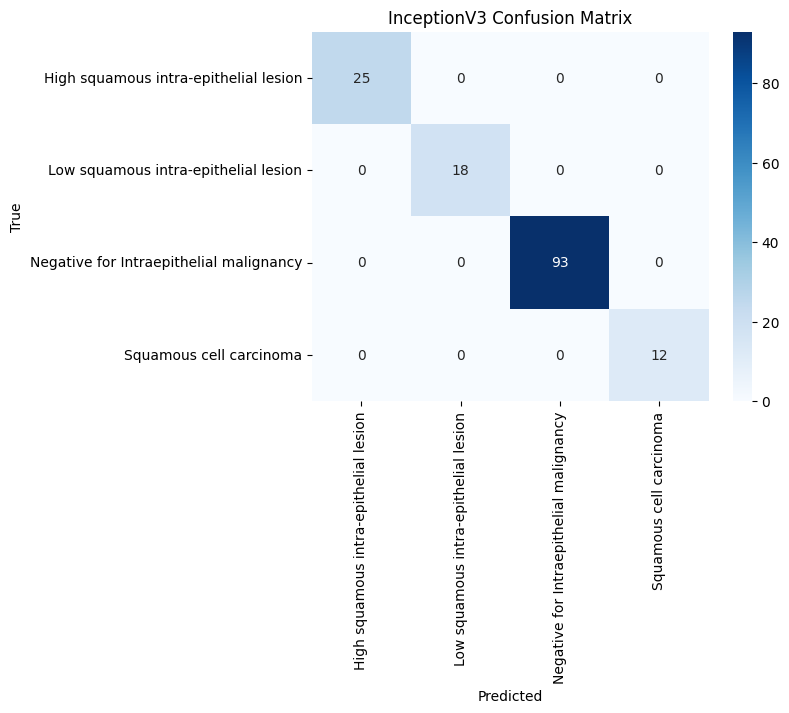

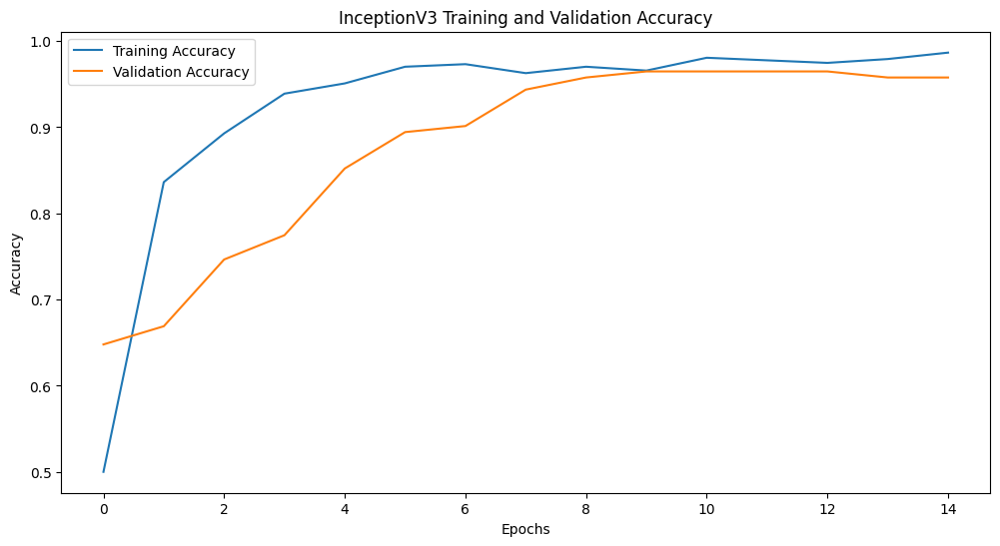

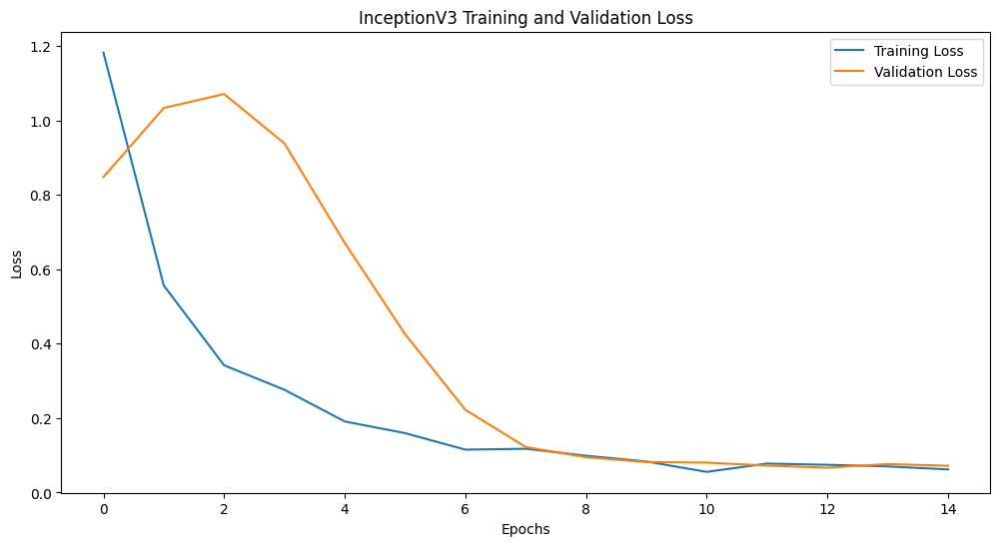

83683744/83683744 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step
Training Xception...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 802s 35s/step - accuracy: 0.2939 - loss: 1.2905 - val_accuracy: 0.7606 - val_loss: 0.8982 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 797s 35s/step - accuracy: 0.8276 - loss: 0.6648 - val_accuracy: 0.7817 - val_loss: 0.6286 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 794s 35s/step - accuracy: 0.9423 - loss: 0.2735 - val_accuracy: 0.8028 - val_loss: 0.7844 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 800s 35s/step - accuracy: 0.9489 - loss: 0.1972 - val_accuracy: 0.8099 - val_loss: 0.7622 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 808s 35s/step - accuracy: 0.9796 - loss: 0.1424 - val_accuracy: 0.8239 - val_loss: 0.7444 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 804s 37s/step - accuracy: 0.9814 - loss: 0.0835 - val_accuracy: 0.8732 - val_loss: 0.5226 - learning_rate: 2.0

4/5 ━━━━━━━━━━━━━━━━━━━━ 8s 9s/step 

5/5 ━━━━━━━━━━━━━━━━━━━━ 44s 8s/step
Xception Classification Report:
                                         precision    recall  f1-score   support

  High squamous intra-epithelial lesion       0.96      1.00      0.98        25
   Low squamous intra-epithelial lesion       1.00      1.00      1.00        18
Negative for Intraepithelial malignancy       1.00      0.99      0.99        93
                Squamous cell carcinoma       1.00      1.00      1.00        12

                               accuracy                           0.99       148
                              macro avg       0.99      1.00      0.99       148
                           weighted avg       0.99      0.99      0.99       148



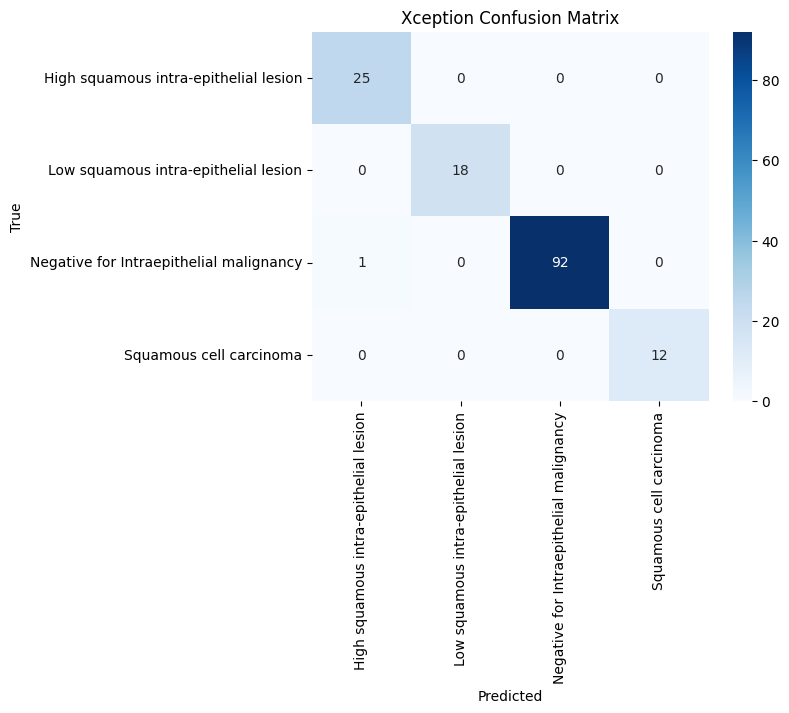

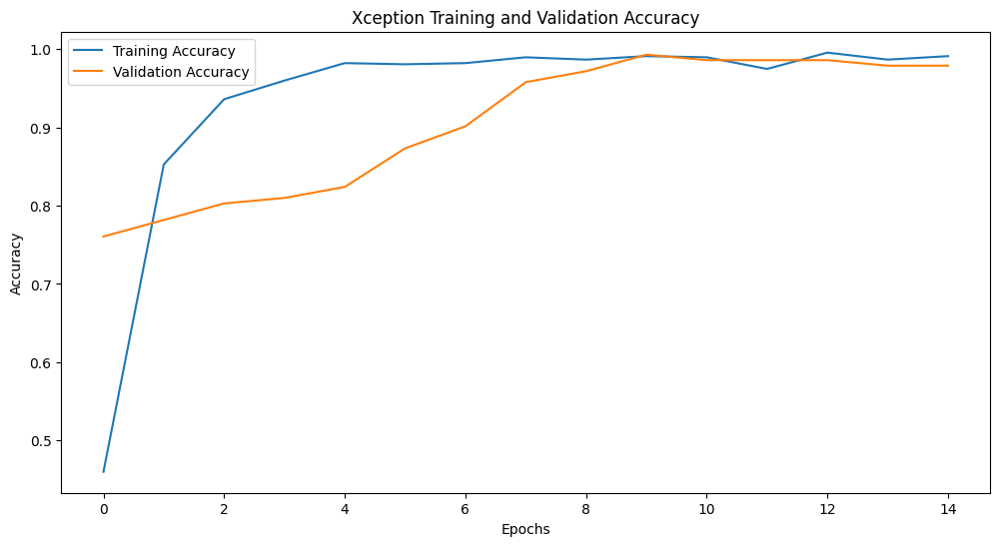

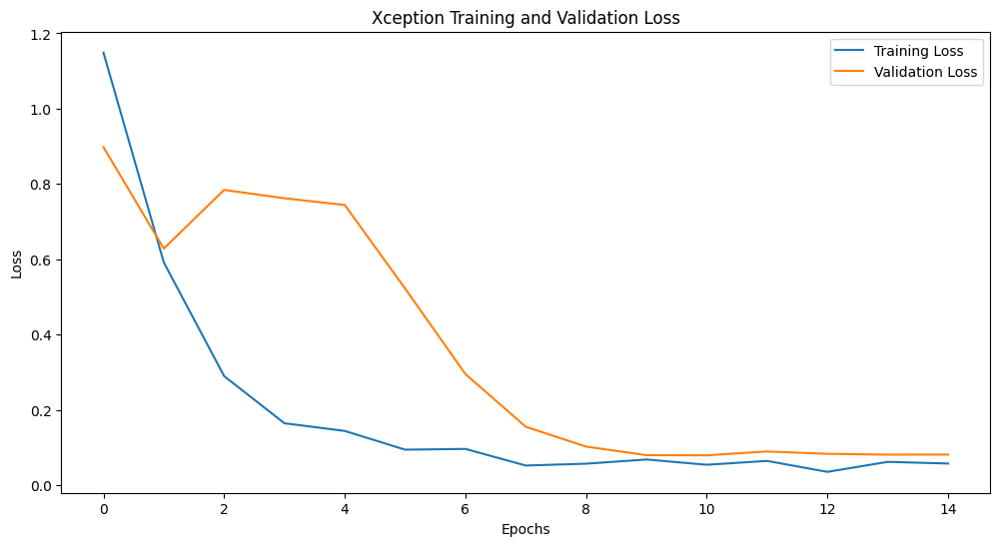

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training MobileNetV3...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 227s 7s/step - accuracy: 0.3120 - loss: 1.6134 - val_accuracy: 0.1338 - val_loss: 1.3746 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 161s 7s/step - accuracy: 0.6933 - loss: 0.9039 - val_accuracy: 0.1901 - val_loss: 1.3490 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 161s 7s/step - accuracy: 0.8124 - loss: 0.5230 - val_accuracy: 0.4085 - val_loss: 1.3210 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 171s 7s/step - accuracy: 0.8656 - loss: 0.4159 - val_accuracy: 0.6338 - val_loss: 1.2982 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 192s 7s/step - accuracy: 0.8997 - loss: 0.3212 - val_accuracy: 0.6408 - val_loss: 1.2774 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 202s 7s/step - accuracy: 0.9205 - loss: 0.3014 - val_accuracy: 0.6408 - val_loss: 1.2726 - learning_rate: 1.0000

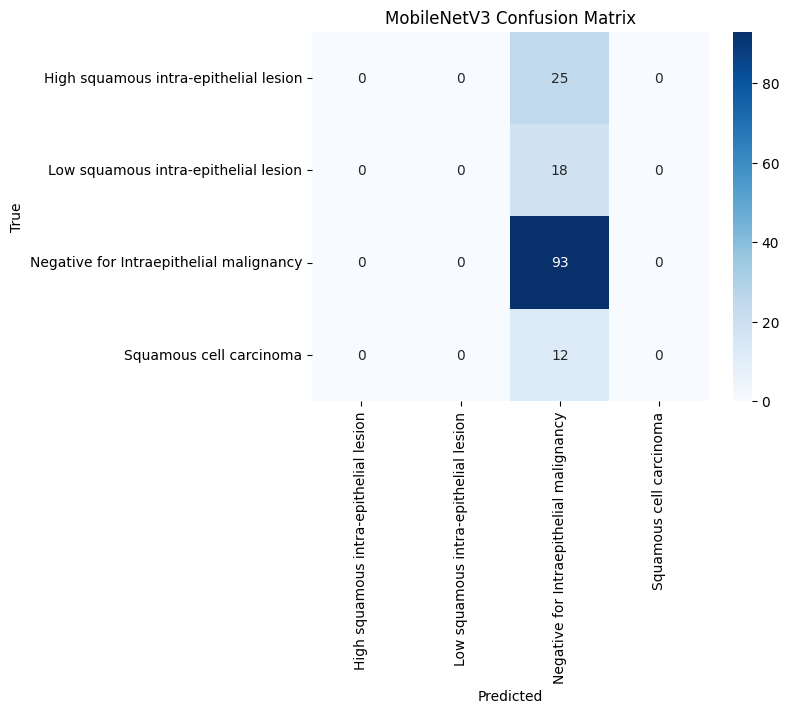

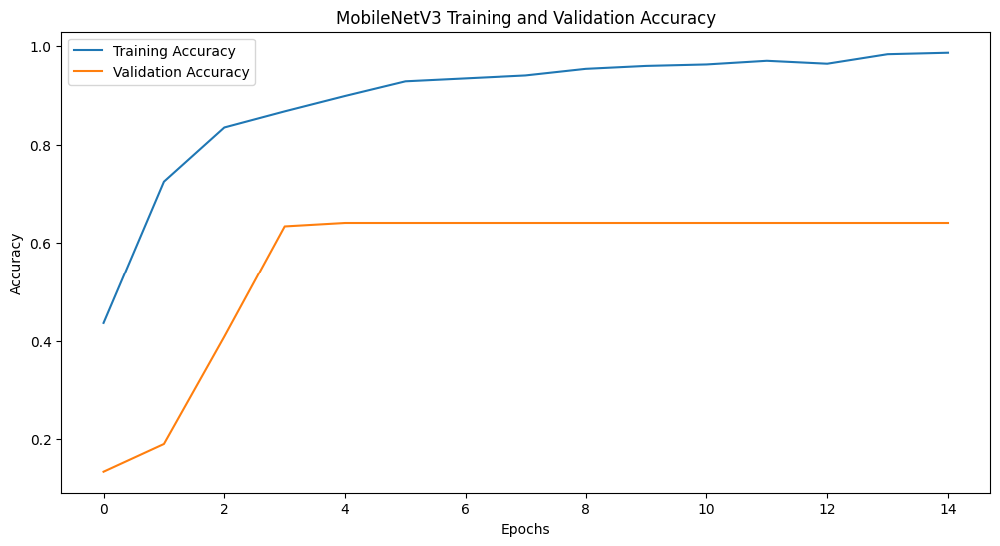

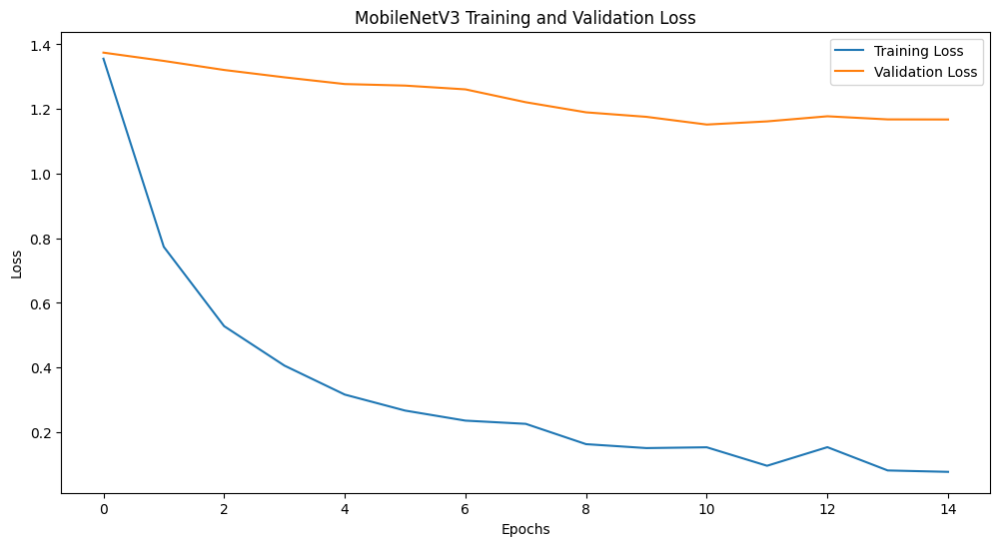

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
Training Vision Transformer Proxy...
Epoch 1/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 309s 10s/step - accuracy: 0.4398 - loss: 1.3280 - val_accuracy: 0.1127 - val_loss: 1.4196 - learning_rate: 1.0000e-04
Epoch 2/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 255s 10s/step - accuracy: 0.7121 - loss: 0.9686 - val_accuracy: 0.1127 - val_loss: 1.7267 - learning_rate: 1.0000e-04
Epoch 3/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 215s 9s/step - accuracy: 0.8123 - loss: 0.7120 - val_accuracy: 0.1338 - val_loss: 1.6442 - learning_rate: 1.0000e-04
Epoch 4/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 276s 10s/step - accuracy: 0.8264 - loss: 0.5369 - val_accuracy: 0.5352 - val_loss: 1.1701 - learning_rate: 1.0000e-04
Epoch 5/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 252s 10s/step - accuracy: 0.8898 - loss: 0.3932 - val_accuracy: 0.6197 - val_loss: 1.0033 - learning_rate: 1.0000e-04
Epoch 6/15
21/21 ━━━━━━━━━━━━━━━━━━━━ 226s 10s/step - accuracy: 0.9104 - loss: 0.3729 - val_accuracy: 0.9014 - val_loss: 0.3556 - lea

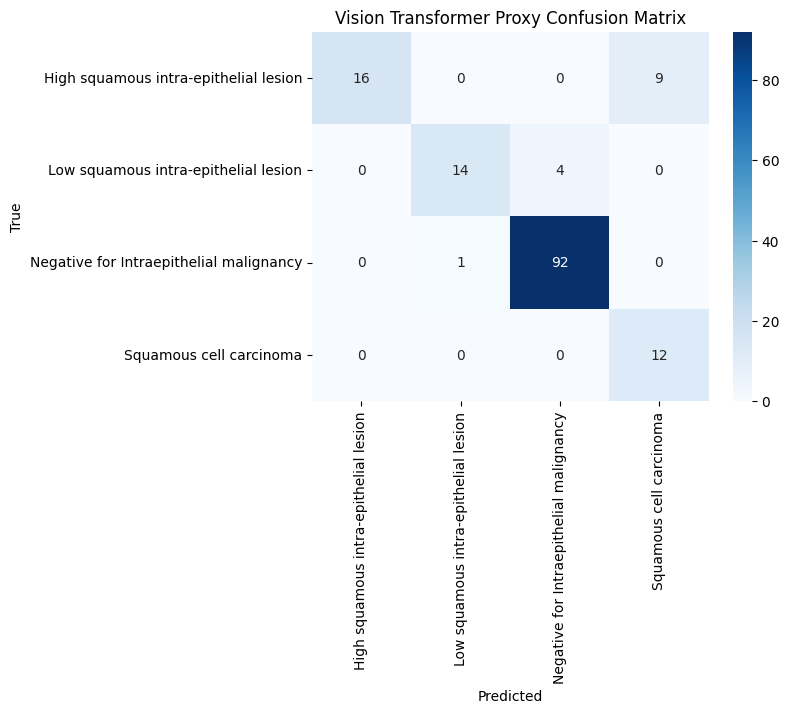

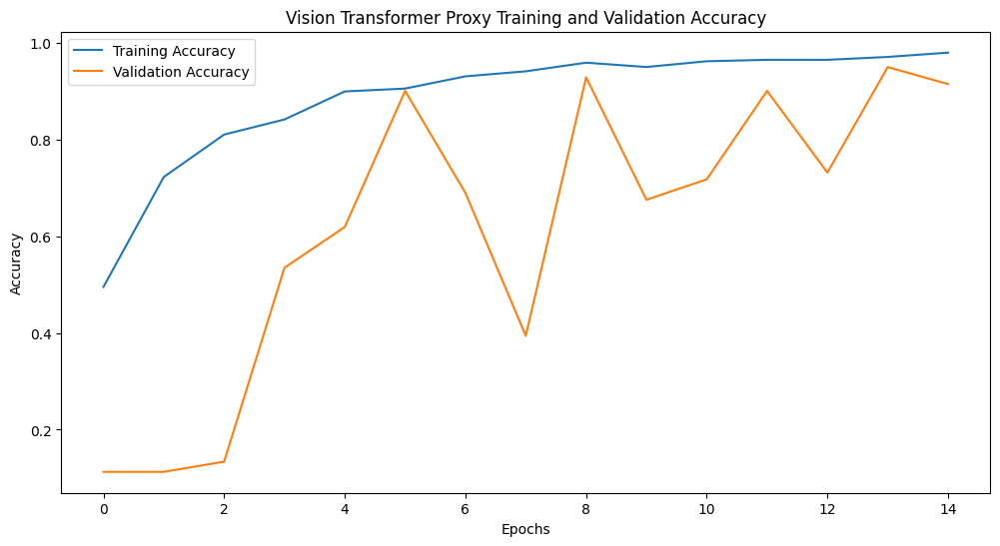

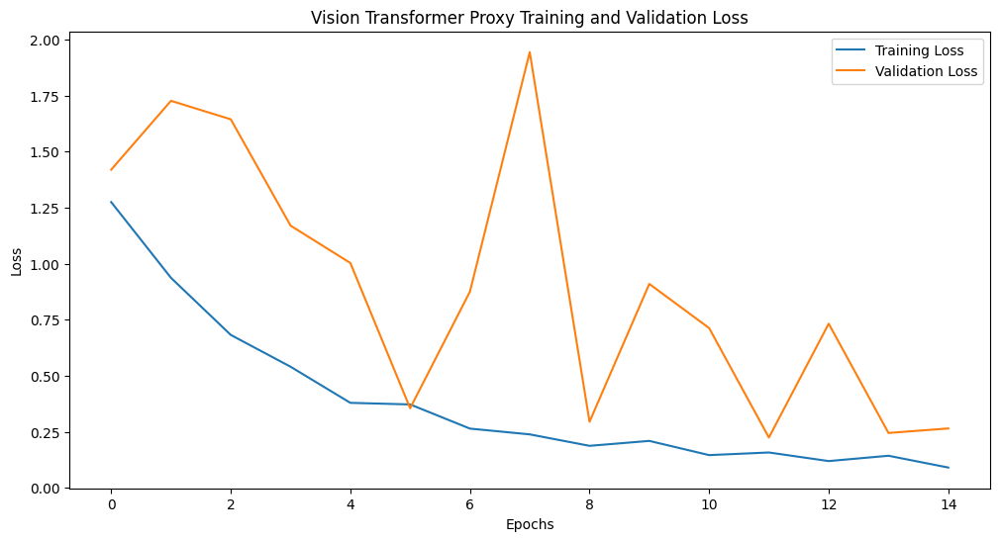

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import DenseNet121, InceptionV3, Xception, MobileNetV3Large
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Directories
train_dir = './train'
val_dir = './val'
test_dir = './test'

# Parameters
IMG_SIZE = 224
BATCH_SIZE = 32
EPOCHS = 15

# Data Generators
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

val_test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_generator = val_test_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

test_generator = val_test_datagen.flow_from_directory(
    test_dir,
    target_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False
)

# Compute Class Weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(train_generator.classes),
    y=train_generator.classes
)
class_weights = dict(enumerate(class_weights))

# Function to Build and Compile a Model
def build_and_train_model(base_model, model_name):
    base_model.trainable = True

    model = Sequential([
        base_model,
        GlobalAveragePooling2D(),
        Dense(128, activation='relu'),
        Dropout(0.5),
        Dense(len(train_generator.class_indices), activation='softmax')
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )

    print(f"Training {model_name}...")
    history = model.fit(
        train_generator,
        validation_data=val_generator,
        epochs=EPOCHS,
        class_weight=class_weights,
        callbacks=[
            tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=1e-6),
            tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
        ]
    )

    evaluate_model(model, test_generator, model_name)
    plot_history(history, model_name)
    return model

# Evaluate Model
def evaluate_model(model, test_generator, model_name):
    print(f"Evaluating {model_name}...")
    loss, accuracy = model.evaluate(test_generator)
    print(f"{model_name} Test Accuracy: {accuracy:.2f}")

    y_pred = model.predict(test_generator)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = test_generator.classes

    print(f"{model_name} Classification Report:")
    print(classification_report(y_true, y_pred_classes, target_names=test_generator.class_indices.keys()))

    conf_matrix = confusion_matrix(y_true, y_pred_classes)
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues',
                xticklabels=test_generator.class_indices.keys(),
                yticklabels=test_generator.class_indices.keys())
    plt.title(f"{model_name} Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.show()

# Plot History
def plot_history(history, model_name):
    plt.figure(figsize=(12, 6))
    plt.plot(history.history['accuracy'], label='Training Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'{model_name} Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.figure(figsize=(12, 6))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title(f'{model_name} Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# DenseNet121
base_densenet = DenseNet121(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
densenet_model = build_and_train_model(base_densenet, "DenseNet121")

# InceptionV3
base_inception = InceptionV3(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
inception_model = build_and_train_model(base_inception, "InceptionV3")

# Xception
base_xception = Xception(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
xception_model = build_and_train_model(base_xception, "Xception")

# MobileNetV3
base_mobilenet = MobileNetV3Large(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
mobilenet_model = build_and_train_model(base_mobilenet, "MobileNetV3")

# Vision Transformer (EfficientNetV2 as a proxy)
from tensorflow.keras.applications import EfficientNetV2B0
base_vit_proxy = EfficientNetV2B0(weights='imagenet', include_top=False, input_shape=(IMG_SIZE, IMG_SIZE, 3))
vit_proxy_model = build_and_train_model(base_vit_proxy, "Vision Transformer Proxy")


In [ ]:


# Specify the path in Google Drive
save_dir = '/content/drive/My Drive/Trained_Models'

# Create the directory if it doesn't exist
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Save DenseNet121 Model in Native Keras Format
densenet_model.save(f'{save_dir}/DenseNet121.keras')  # Native Keras format
print(f"DenseNet121 model saved as {save_dir}/DenseNet121.keras")

# Save InceptionV3 Model in Native Keras Format
inception_model.save(f'{save_dir}/InceptionV3.keras')  # Native Keras format
print(f"InceptionV3 model saved as {save_dir}/InceptionV3.keras")

# Save Xception Model in Native Keras Format
xception_model.save(f'{save_dir}/Xception.keras')  # Native Keras format
print(f"Xception model saved as {save_dir}/Xception.keras")

# Save MobileNetV3 Model in Native Keras Format
mobilenet_model.save(f'{save_dir}/MobileNetV3.keras')  # Native Keras format
print(f"MobileNetV3 model saved as {save_dir}/MobileNetV3.keras")

# Save Vision Transformer Proxy Model in Native Keras Format
vit_proxy_model.save(f'{save_dir}/VisionTransformerProxy.keras')  # Native Keras format
print(f"VisionTransformerProxy model saved as {save_dir}/VisionTransformerProxy.keras")


DenseNet121 model saved as /content/drive/My Drive/Trained_Models/DenseNet121.keras
InceptionV3 model saved as /content/drive/My Drive/Trained_Models/InceptionV3.keras
Xception model saved as /content/drive/My Drive/Trained_Models/Xception.keras
MobileNetV3 model saved as /content/drive/My Drive/Trained_Models/MobileNetV3.keras
VisionTransformerProxy model saved as /content/drive/My Drive/Trained_Models/VisionTransformerProxy.keras


In [ ]:
import os

# Specify the save directory
save_dir = '/content/drive/My Drive/Trained_Models'

# List all files in the directory
if os.path.exists(save_dir):
    saved_files = os.listdir(save_dir)
    print("Saved files in the directory:")
    for file in saved_files:
        print(file)
else:
    print(f"The directory {save_dir} does not exist.")



Saved files in the directory:
DenseNet121.h5
DenseNet121.keras
InceptionV3.keras
Xception.keras
MobileNetV3.keras
VisionTransformerProxy.keras


## **LIME EXPLAINER**

In [ ]:
!pip install lime
from lime import lime_image
from skimage.segmentation import mark_boundaries
import numpy as np
import matplotlib.pyplot as plt

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=a16294512073d37b9df3f57b944f43b1d456e442a34a9139d5468166ed811345
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
# Define a prediction function for LIME
def prediction_function(images, model):
    images = np.array(images) / 255.0  # Rescale images
    return model.predict(images)

# Initialize LIME explainer
explainer = lime_image.LimeImageExplainer()


# **Explain Predictions for Each Model**

In [ ]:
# Function to explain a single image with LIME
def explain_with_lime(image, model, model_name, class_names):
    explanation = explainer.explain_instance(
        image,
        classifier_fn=lambda x: prediction_function(x, model),
        top_labels=1,  # Number of labels to explain
        hide_color=0,
        num_samples=1000  # Number of perturbations to generate
    )

    # Get the explanation for the top class
    top_label = explanation.top_labels[0]
    temp, mask = explanation.get_image_and_mask(
        label=top_label,
        positive_only=True,
        hide_rest=False,
        num_features=5,
        min_weight=0.0
    )

    # Display the original and explanation
    plt.figure(figsize=(8, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.title("Original Image")

    plt.subplot(1, 2, 2)
    plt.imshow(mark_boundaries(temp / 255.0, mask))
    plt.title(f"LIME Explanation - {model_name}")
    plt.show()


# **Apply LIME to an Image**

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 10s 10s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1

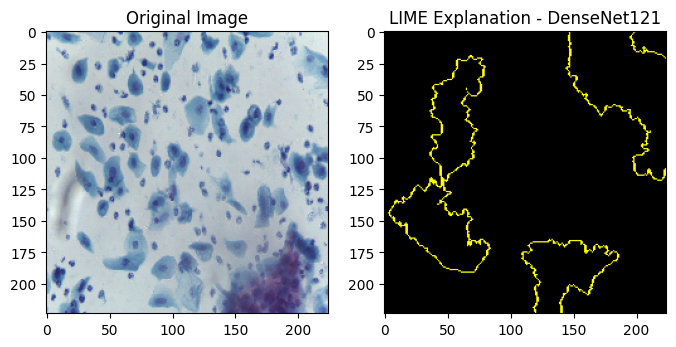

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1000ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 994ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 993ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 995ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step    
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━

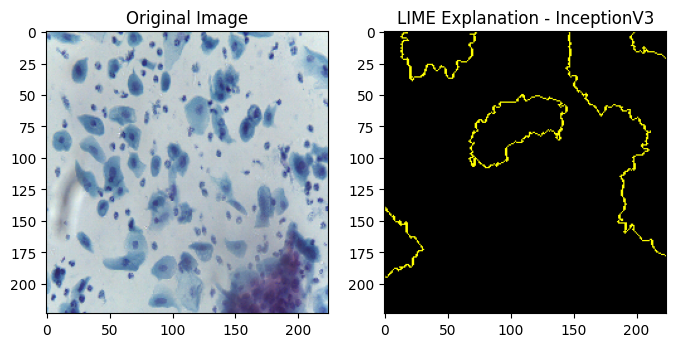

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

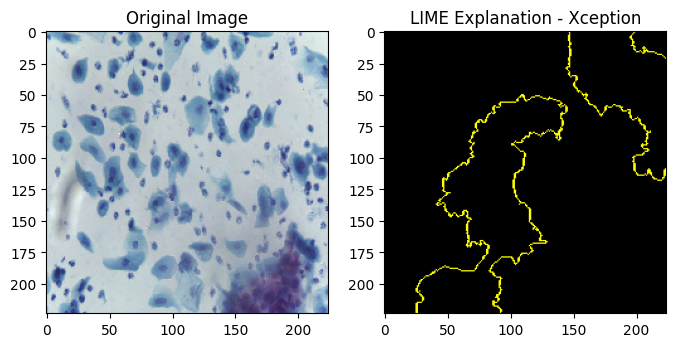

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 561ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 478ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 443ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 467ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 493ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 296ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 290ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 310ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 284ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 303ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 283ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 312ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 311ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 301ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 285ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 299ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 367ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 

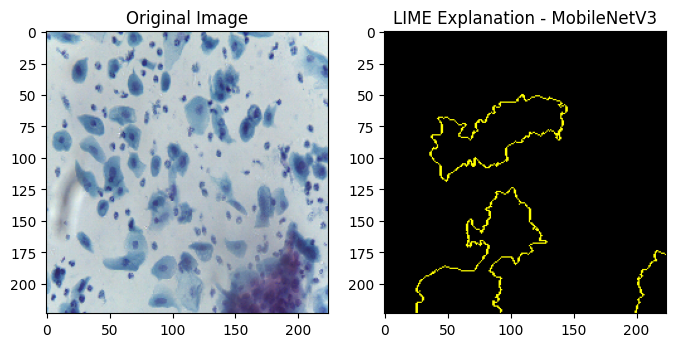

  0%|          | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 492ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 473ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 805ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 997ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 724ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━

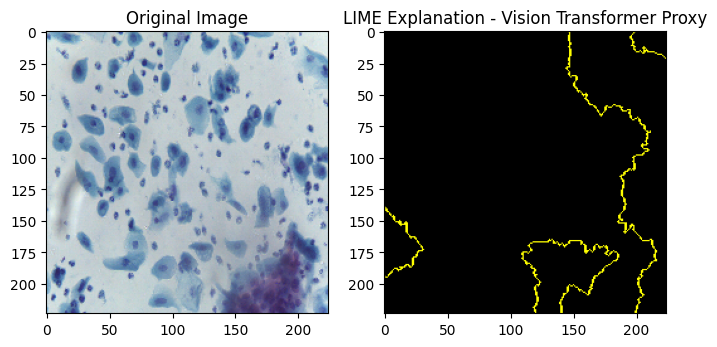

In [ ]:
# Select a sample image from the test set
sample_image, sample_label = test_generator[0][0][0], test_generator[0][1][0]

# Explain with DenseNet121
explain_with_lime(sample_image, densenet_model, "DenseNet121", list(test_generator.class_indices.keys()))

# Explain with InceptionV3
explain_with_lime(sample_image, inception_model, "InceptionV3", list(test_generator.class_indices.keys()))

# Explain with Xception
explain_with_lime(sample_image, xception_model, "Xception", list(test_generator.class_indices.keys()))

# Explain with MobileNetV3
explain_with_lime(sample_image, mobilenet_model, "MobileNetV3", list(test_generator.class_indices.keys()))

# Explain with Vision Transformer Proxy
explain_with_lime(sample_image, vit_proxy_model, "Vision Transformer Proxy", list(test_generator.class_indices.keys()))


Performance: Generating explanations with LIME can be computationally expensive due to multiple perturbations.
Customization: Adjust the num_samples parameter for finer explanations (at the cost of speed).

Visualization: The regions highlighted by LIME indicate the most influential pixels for the model’s prediction.

## **SHAP EXPLAINER**

In [ ]:
!pip install shap
import shap
import numpy as np
import matplotlib.pyplot as plt


In [ ]:
# Prepare background data (use a small sample from the training data)
background_data = train_generator[0][0][:100]  # First 100 images from the training generator


In [ ]:
# Define the SHAP explainer for the model
def get_shap_explainer(model, background_data):
    return shap.Explainer(lambda x: model.predict(x), background_data)


In [ ]:
## Function to visualize SHAP explanations for a single image
def visualize_shap_explanation(image, model, model_name, background_data):
    explainer = get_shap_explainer(model, background_data)
    image = image / 255.0  # Normalize the image

    # Generate SHAP values
    shap_values = explainer.shap_values(image[np.newaxis])  # Add batch dimension

    # Visualize the explanation
    shap.image_plot(shap_values, image[np.newaxis], show=True)
    plt.title(f"SHAP Explanation - {model_name}")



In [ ]:
import shap

# Initialize SHAP Explainer
def get_shap_explainer(model, background_data):
    masker = shap.maskers.Image(mask_value=0, shape=(224, 224, 3))
    explainer = shap.Explainer(model, masker)
    return explainer

# Visualize SHAP Explanation for a Single Image
def visualize_shap_explanation(image, model, model_name, background_data):
    explainer = get_shap_explainer(model, background_data)

    # Generate SHAP values
    shap_values = explainer(image[np.newaxis])  # Add batch dimension

    # Visualize the explanation
    shap.image_plot(shap_values, image[np.newaxis], show=True)
    plt.title(f"SHAP Explanation - {model_name}")



Use of shap.maskers.Image: Handles image-specific masking requirements.

Explainer Compatibility: shap.Explainer automatically integrates with TensorFlow/Keras models.

Visualization: Generates colorful SHAP overlays highlighting influential pixels for predictions.

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [02:47, 167.14s/it]              


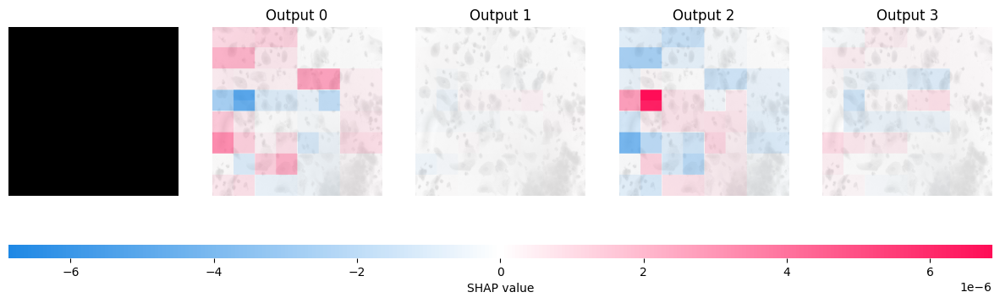

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:45, 105.28s/it]              


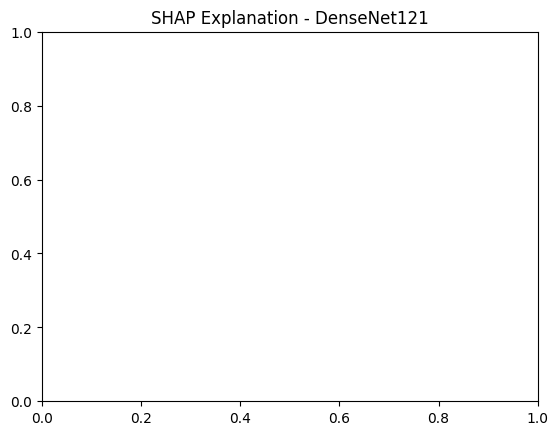

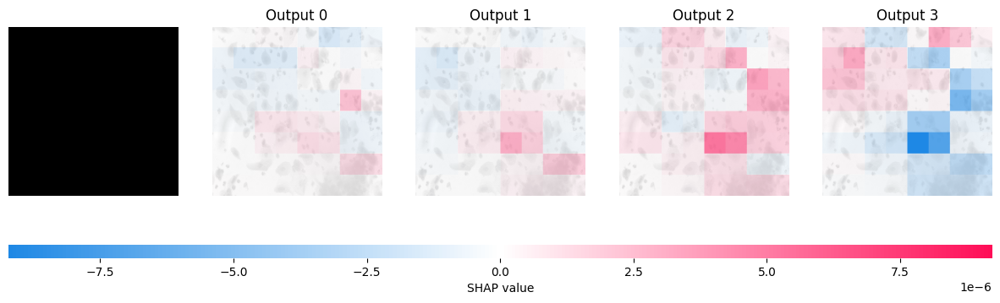

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [02:06, 126.79s/it]              


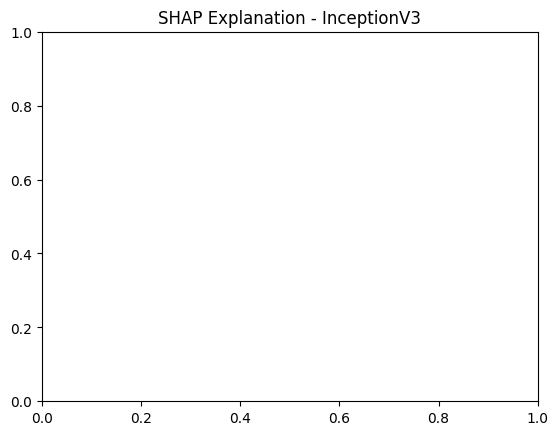

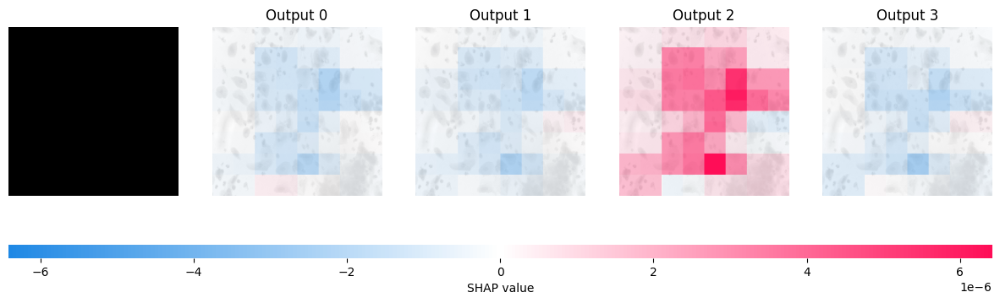

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:37, 37.12s/it]               


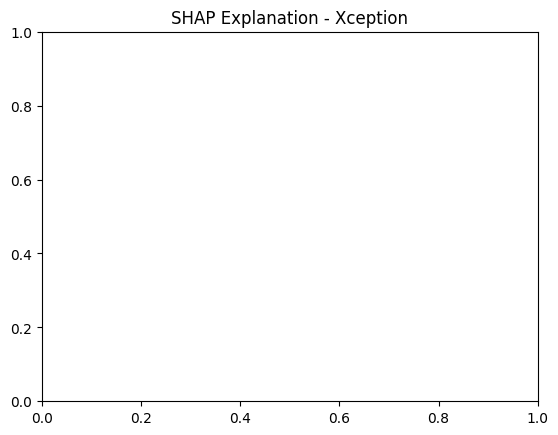

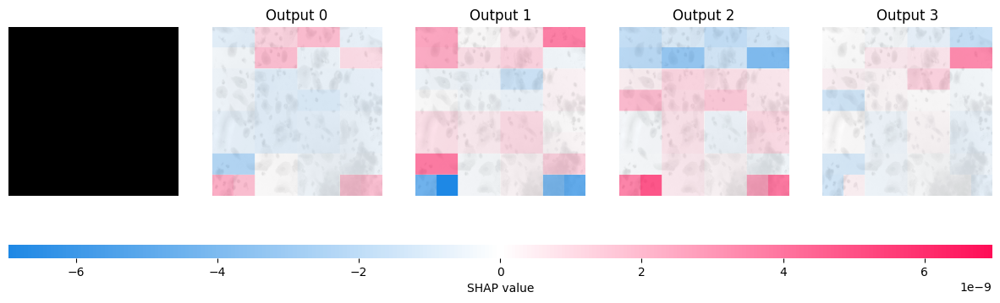

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [01:13, 73.76s/it]               


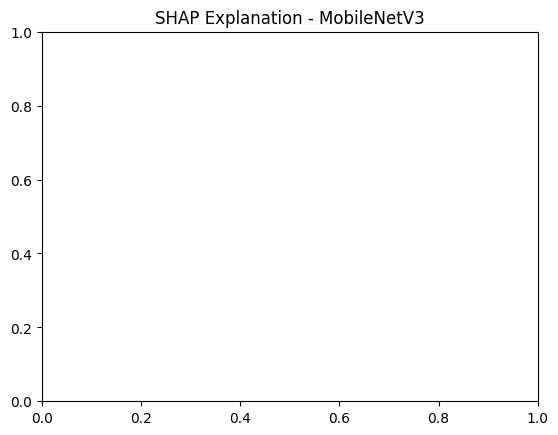

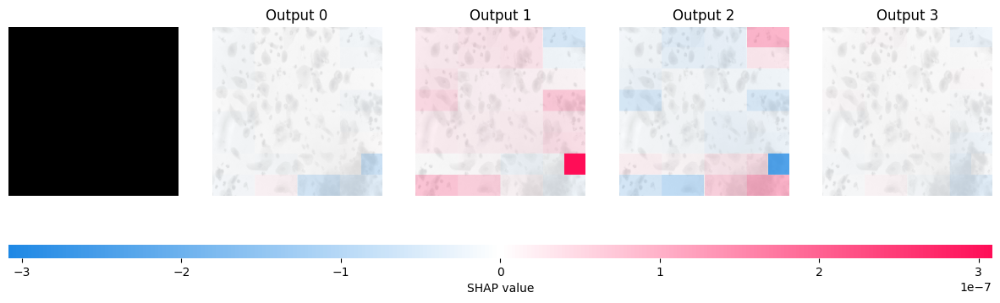

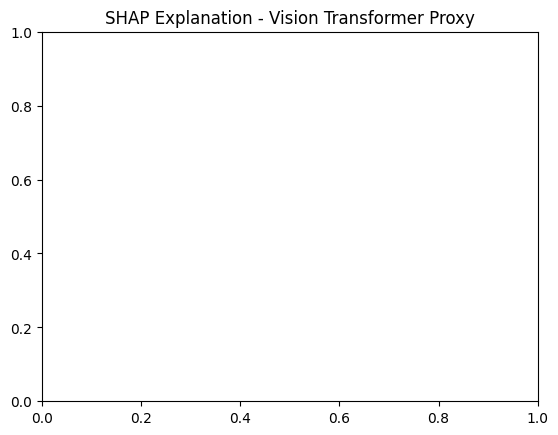

In [ ]:
# Normalize the sample image
sample_image = test_generator[0][0][0] / 255.0  # Normalize test image
background_data = train_generator[0][0][:100] / 255.0  # Normalize background data

# Explain DenseNet121
visualize_shap_explanation(sample_image, densenet_model, "DenseNet121", background_data)

# Explain InceptionV3
visualize_shap_explanation(sample_image, inception_model, "InceptionV3", background_data)

# Explain Xception
visualize_shap_explanation(sample_image, xception_model, "Xception", background_data)

# Explain MobileNetV3
visualize_shap_explanation(sample_image, mobilenet_model, "MobileNetV3", background_data)

# Explain Vision Transformer Proxy
visualize_shap_explanation(sample_image, vit_proxy_model, "Vision Transformer Proxy", background_data)


# **Colorful Heatmaps:**
SHAP overlays highlight regions in the image that contribute most positively or negatively to the prediction. Red indicates regions increasing the likelihood of the predicted class. Blue indicates regions decreasing the likelihood of the predicted class.

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

def preprocess_image(image_path):
    """Preprocess an image for prediction."""
    img = load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))  # Resize to model input size
    img_array = img_to_array(img) / 255.0  # Convert to array and normalize to [0, 1]
    return np.expand_dims(img_array, axis=0)  # Add batch dimension

def make_prediction(model, image_path, class_names):
    """Make predictions with the given model and display results."""
    # Preprocess the image
    processed_image = preprocess_image(image_path)

    # Predict class probabilities
    predictions = model.predict(processed_image)

    # Get the predicted class
    predicted_class_index = np.argmax(predictions)
    predicted_class_name = class_names[predicted_class_index]
    confidence = predictions[0][predicted_class_index]

    print(f"Predicted Class: {predicted_class_name}")
    print(f"Confidence Score: {confidence:.2f}")
    print(f"Class Probabilities: {predictions[0]}")

    return predicted_class_name, confidence

# Example usage
image_path = '/content/Cervical_Cancer_dataset_temp/Squamous cell carcinoma/SCC_3 (1).jpg'  # Replace with the path to your image
class_names = list(test_generator.class_indices.keys())  # Get class names

# Make predictions with each model
print("\nMaking prediction with DenseNet121...")
make_prediction(densenet_model, image_path, class_names)

print("\nMaking prediction with InceptionV3...")
make_prediction(inception_model, image_path, class_names)

print("\nMaking prediction with Xception...")
make_prediction(xception_model, image_path, class_names)

print("\nMaking prediction with MobileNetV3...")
make_prediction(mobilenet_model, image_path, class_names)

print("\nMaking prediction with Vision Transformer Proxy...")
make_prediction(vit_proxy_model, image_path, class_names)



Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
Predicted Class: Squamous cell carcinoma
Confidence Score: 1.00
Class Probabilities: [2.30971564e-05 1.09780660e-06 1.36947565e-05 9.99962091e-01]

Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step
Predicted Class: Squamous cell carcinoma
Confidence Score: 1.00
Class Probabilities: [1.9940429e-03 7.7050754e-05 1.7464829e-03 9.9618238e-01]

Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Predicted Class: Squamous cell carcinoma
Confidence Score: 1.00
Class Probabilities: [2.7609831e-03 7.0586852e-05 7.4735284e-04 9.9642110e-01]

Making prediction with MobileNetV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 0.41
Class Probabilities: [0.19259463 0.22546944 0.41122094 0.17071494]

Making prediction with Vision Transformer Proxy...
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
Predicted Class: Squamous cell

('Squamous cell carcinoma', 0.87637126)

In [ ]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Preprocess the image
def preprocess_image(image_path, target_size=(224, 224)):
    """Load and preprocess an image for model prediction."""
    img = load_img(image_path, target_size=target_size)  # Resize image
    img_array = img_to_array(img) / 255.0  # Normalize pixel values
    return np.expand_dims(img_array, axis=0)  # Add batch dimension

# Make a prediction with a single model
def make_prediction(model, image_path, class_names):
    """Make a prediction with a given model."""
    processed_image = preprocess_image(image_path, target_size=(IMG_SIZE, IMG_SIZE))
    predictions = model.predict(processed_image)
    predicted_class_index = np.argmax(predictions)
    predicted_class_name = class_names[predicted_class_index]
    confidence = predictions[0][predicted_class_index]

    return {
        "predicted_class": predicted_class_name,
        "confidence": confidence,
        "probabilities": predictions[0].tolist()
    }

# Predict with all models
def predict_with_all_models(image_path, models, class_names):
    """Make predictions with all models and return structured results."""
    results = {}
    for model_name, model in models.items():
        print(f"Making prediction with {model_name}...")
        results[model_name] = make_prediction(model, image_path, class_names)
    return results

# Load your trained models
models = {
    "DenseNet121": densenet_model,
    "InceptionV3": inception_model,
    "Xception": xception_model,
    "MobileNetV3": mobilenet_model,
    "Vision Transformer Proxy": vit_proxy_model
}

# Example usage
image_path = '/content/Cervical_Cancer_dataset_temp/Negative for Intraepithelial malignancy/NL_10_ (12).jpg'  # Replace with the actual image path
class_names = list(test_generator.class_indices.keys())  # Get class names from your test generator

# Run predictions with all models
predictions = predict_with_all_models(image_path, models, class_names)

# Print predictions in a structured format
print("\nPrediction Results:")
for model_name, result in predictions.items():
    print(f"\nModel: {model_name}")
    print(f"Predicted Class: {result['predicted_class']}")
    print(f"Confidence Score: {result['confidence']:.2f}")
    print(f"Class Probabilities: {result['probabilities']}")


Making prediction with DenseNet121...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 428ms/step
Making prediction with InceptionV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
Making prediction with Xception...
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step
Making prediction with MobileNetV3...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step
Making prediction with Vision Transformer Proxy...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step

Prediction Results:

Model: DenseNet121
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 1.00
Class Probabilities: [2.949303166133177e-07, 8.623855137557257e-06, 0.999943733215332, 4.733694368042052e-05]

Model: InceptionV3
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 1.00
Class Probabilities: [5.1123610319336876e-05, 2.294441856065532e-06, 0.9999405145645142, 6.046265298209619e-06]

Model: Xception
Predicted Class: Negative for Intraepithelial malignancy
Confidence Score: 0.99
Class Probabilities: [0.0024730560835450888, 0.000770020473282784

In [ ]:
import cv2
# Assuming your image is stored in a variable 'image'
image = cv2.resize(image, (224, 224))  # Resize to match model input
image = image / 255.0  # Normalize pixel values to [0, 1]


In [ ]:
# Ensure background data is normalized
background_data = background_data / 255.0


In [ ]:
# Ensure the image is resized and normalized
import cv2

# Assuming the uploaded image is '/mnt/data/image.png'
image_path = '/content/Cervical_Cancer_dataset_temp/Squamous cell carcinoma/SCC_3 (10).jpg'
image = cv2.imread(image_path)
image = cv2.resize(image, (224, 224))  # Resize to match model input
image = image / 255.0  # Normalize to [0, 1]


In [ ]:
# Generate SHAP values
shap_values = explainer(image[np.newaxis])

# Debugging: Print SHAP values
print("SHAP values shape:", shap_values.values.shape)
print("Base values shape:", shap_values.base_values.shape)


TypeError: 'LimeImageExplainer' object is not callable

In [ ]:
# Check model predictions
predictions = model_name.predict(image[np.newaxis])
print("Model predictions:", predictions)


NameError: name 'model_name' is not defined

## **Colorful Heatmaps:**

SHAP overlays highlight regions in the image that contribute most positively or negatively to the prediction.
Red indicates regions increasing the likelihood of the predicted class.
Blue indicates regions decreasing the likelihood of the predicted class.

In [ ]:
target_layer_name = {
    "DenseNet121": "densenet121",
    "InceptionV3": "inception_v3",
    "Xception": "xception",
    "MobileNetV3": "Conv_1",
    "Vision Transformer Proxy": "top_conv"
}


In [ ]:
def generate_grad_cam(model, image_path, target_size, predicted_class_index, layer_name):
    """Generate Grad-CAM heatmap for the given model and image."""
    # Load and preprocess the image
    img = load_img(image_path, target_size=target_size)
    img_array = img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)

    # Access the base model layer
    if hasattr(model.layers[0], "get_layer"):  # Check if the first layer is the base model
        base_model_layer = model.layers[0].get_layer(layer_name)
    else:
        raise ValueError(f"Layer {layer_name} not found in the base model.")

    # Create Grad-CAM model
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [base_model_layer.output, model.output]
    )

    # Compute gradients
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        loss = predictions[:, predicted_class_index]

    grads = tape.gradient(loss, conv_outputs)

    # Compute mean of gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]

    # Multiply gradients with feature map
    for i in range(conv_outputs.shape[-1]):
        conv_outputs[..., i] *= pooled_grads[i]

    # Compute heatmap
    heatmap = tf.reduce_mean(conv_outputs, axis=-1)
    heatmap = np.maximum(heatmap, 0) / np.max(heatmap)  # Normalize to [0, 1]

    return heatmap.numpy()



5/5 ━━━━━━━━━━━━━━━━━━━━ 44s 8s/step


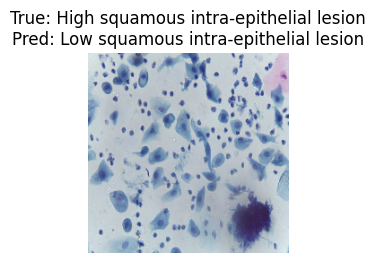

In [ ]:
def plot_misclassified_images(images, y_true, y_pred, class_names, num_images=10):
    """Plot misclassified images with true and predicted labels."""
    misclassified_indices = np.where(y_true != y_pred)[0]
    misclassified_indices = misclassified_indices[:num_images]

    plt.figure(figsize=(15, 5))
    for i, idx in enumerate(misclassified_indices):
        plt.subplot(1, num_images, i + 1)
        plt.imshow(images[idx])
        plt.title(f"True: {class_names[y_true[idx]]}\nPred: {class_names[y_pred[idx]]}")
        plt.axis('off')
    plt.show()

# Example
y_pred_classes = np.argmax(model.predict(test_generator), axis=1)
y_true_classes = test_generator.classes
plot_misclassified_images(test_generator[0][0], y_true_classes, y_pred_classes, class_names, num_images=5)



5/5 ━━━━━━━━━━━━━━━━━━━━ 38s 6s/step


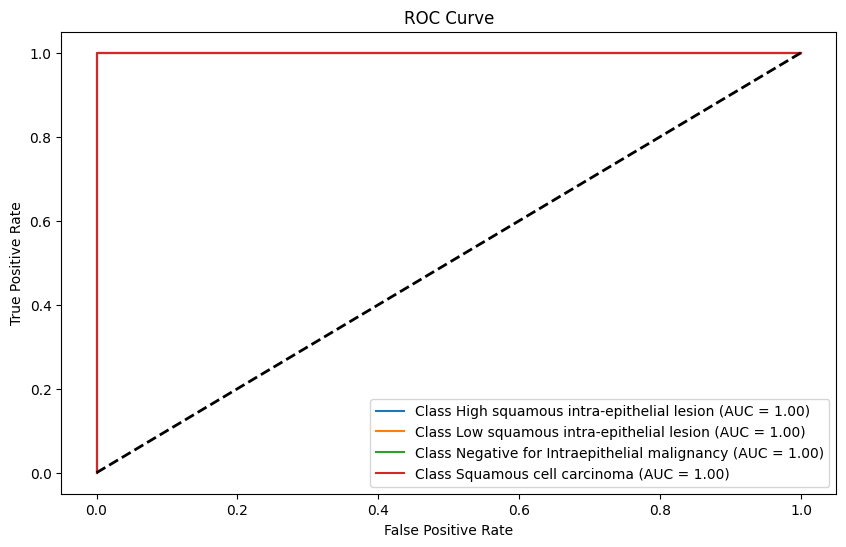

In [ ]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

def plot_roc_curve(model, test_generator, class_names):
    """Plot ROC curve for multiclass classification."""
    y_true = test_generator.classes
    y_score = model.predict(test_generator)

    # Binarize labels for multiclass ROC
    y_true_binarized = label_binarize(y_true, classes=range(len(class_names)))

    plt.figure(figsize=(10, 6))
    for i in range(len(class_names)):
        fpr, tpr, _ = roc_curve(y_true_binarized[:, i], y_score[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label=f"Class {class_names[i]} (AUC = {roc_auc:.2f})")

    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve')
    plt.legend(loc="lower right")
    plt.show()

# Example
plot_roc_curve(model, test_generator, class_names)


In [ ]:
!pip install gradio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 MB 9.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 321.4/321.4 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.8/94.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.3/11.3 MB 26.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 73.2/73.2 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.3/62.3 kB 2.8 MB/s eta 0:00:00
  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 3.0.2
    Uninstalling MarkupSafe-3.0.2:
      Successfully uninstalled MarkupSafe-3.0.2


In [ ]:
import gradio as gr
import numpy as np
import tensorflow as tf
from tensorflow import keras
from PIL import Image

# 1) Load your multi-class model
MODEL_PATH = "/content/drive/MyDrive/Trained_Models/Xception.keras"  # or 'model.h5'
model = keras.models.load_model(MODEL_PATH)

# 2) Define your list of class labels in the same order
#    that the model outputs predictions (e.g., softmax of length N).
class_labels = ["High squamous intra-epithelial lesion", "Low squamous intra-epithelial lesion", "Negative for Intraepithelial malignancy","Squamous cell carcinoma"]

# 3) The model might expect images of a specific size, say 224x224
TARGET_SIZE = (224, 224)

def predict_single_class(img):
    """
    Accepts a PIL image, preprocesses it, and predicts the single best class.
    """
    # Convert to PIL if not already
    if not isinstance(img, Image.Image):
        img = Image.fromarray(img)

    # Resize the image as required by your model
    img = img.resize(TARGET_SIZE)

    # Convert to NumPy array
    img_array = np.array(img)

    # Scale pixel values if needed (0 to 1 range, for example)
    img_array = img_array / 255.0

    # Add a batch dimension: (1, height, width, channels)
    img_array = np.expand_dims(img_array, axis=0)

    # Model prediction -> returns an array of shape (1, num_classes)
    preds = model.predict(img_array)

    # Argmax to get the highest predicted class
    pred_class_idx = np.argmax(preds[0])
    predicted_label = class_labels[pred_class_idx]

    return f"Predicted Class: {predicted_label}"

# 4) Create a Gradio interface with Image input and simple text output
demo = gr.Interface(
    fn=predict_single_class,
    inputs=gr.Image(type="pil", label="Upload an Image"),
    outputs="text",
    title="Cevical Cancer Multi-Class Classification",
    description="Upload an image to see the single most likely class."
)

if __name__ == "__main__":
    demo.launch(server_name="0.0.0.0", server_port=7860)


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://2353efaba446495e38.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import numpy as np
import tensorflow as tf
from tensorflow import keras
from PIL import Image

# 1) Load your multi-class model
MODEL_PATH = "/content/drive/MyDrive/Trained_Models/Xception.keras"  # or 'model.h5'
model = keras.models.load_model(MODEL_PATH)

# 2) Define your list of class labels in the same order
#    that the model outputs predictions (e.g., softmax of length N).
class_labels = [
    "High squamous intra-epithelial lesion",
    "Low squamous intra-epithelial lesion",
    "Negative for Intraepithelial malignancy",
    "Squamous cell carcinoma"
]

# 3) The model might expect images of a specific size
TARGET_SIZE = (224, 224)

def predict_single_class(img):
    """
    Accepts a PIL image, preprocesses it, and predicts the single best class
    along with its probability.
    """
    # Convert to PIL if not already
    if not isinstance(img, Image.Image):
        img = Image.fromarray(img)

    # Resize the image as required by your model
    img = img.resize(TARGET_SIZE)

    # Convert to NumPy array
    img_array = np.array(img)

    # Scale pixel values if needed (e.g., 0-1 range)
    img_array = img_array / 255.0

    # Add a batch dimension: (1, height, width, channels)
    img_array = np.expand_dims(img_array, axis=0)

    # Model prediction -> returns an array of shape (1, num_classes)
    preds = model.predict(img_array)  # e.g., [[0.1, 0.7, 0.15, 0.05]]
    preds = preds[0]  # shape => (num_classes,)

    # Argmax to get the highest predicted class index
    pred_class_idx = np.argmax(preds)
    predicted_label = class_labels[pred_class_idx]

    # Get the probability corresponding to the predicted class
    predicted_probability = preds[pred_class_idx]

    # Format the output to include both
    return f"Predicted Class: {predicted_label}\nProbability: {predicted_probability:.4f}"

# 4) Create a Gradio interface with Image input and text output
demo = gr.Interface(
    fn=predict_single_class,
    inputs=gr.Image(type="pil", label="Upload an Image"),
    outputs="text",
    title="Cervical Cancer Multi-Class Classification",
    description="Upload an image to see the predicted class and probability."
)

if __name__ == "__main__":
    demo.launch(server_name="0.0.0.0", server_port=7860)


Running Gradio in a Colab notebook requires sharing enabled. Automatically setting `share=True` (you can turn this off by setting `share=False` in `launch()` explicitly).

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://f2212de53903e7b84d.gradio.live

This share link expires in 72 hours. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
